<a href="https://colab.research.google.com/github/mariateonaolteanu23/AccessRoute/blob/master/data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # Data Preparation and Preprocessing

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras
from keras import layers
import tensorflow as tf
import os
import cv2
import shutil
import matplotlib.image as mpimg
import seaborn as sns
import re
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, AveragePooling2D, GlobalAveragePooling2D, Resizing
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from datetime import datetime
import random

## Data Loading and Structure Understanding

### Use personal drive to store data


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Define paths for data loading

In [3]:
FOLDER = "/content/drive/MyDrive/dl-partA/"
LABEL_DESC_FILE = "Label.txt"
IMAGES_FOLDER = "Image/"

### Because we have to classification tasks (roll and pitch) we decided to combine the in a single task. The images will be labelled and associated based on the concatenation of pitch and roll values. (e.g. 0-70)

In [ ]:
data = []

with open(f'{FOLDER}{LABEL_DESC_FILE}', 'r') as labels:
    for line in labels:
        splits = line.strip().split()

        # image specs
        pitch = splits[1]
        roll = splits[2]
        depth = splits[3]

        # determine image location
        img_path = f"{FOLDER}{IMAGES_FOLDER}{splits[0]}"

        # get image measurements
        h, w, chs = cv2.imread(img_path).shape

        # create label folder based on the combination of pitch and roll
        label_folder = f"{FOLDER}data/{pitch}_{roll}"

        if not os.path.exists(label_folder):
            os.makedirs(label_folder)

        # copy image in the label folder
        shutil.copy2(img_path, f"{label_folder}/{splits[0]}")

        # create dataframe entry of image specs and properties
        data.append({"img":  f"{label_folder}/{splits[0]}",
                     "label": f"{pitch}_{roll}",
                     "pitch": pitch,
                     "roll": roll,
                     "depth": depth,
                     "height": h,
                     "width": w,
                     "channels": chs})

    # create and store dataframe
    df = pd.DataFrame(data)
    df.to_csv(f"{FOLDER}img_desc.csv", index=False)

# Exploratory Data Analysis

In [21]:
df = pd.read_csv(f"{FOLDER}img_desc.csv")
df.head()

,img,label,pitch,roll,depth,height,width,channels,init_depth,depth_std
0,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,0.307041,256,256,3,0.611818,0.307041
1,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,0.544485,256,256,3,0.693017,0.544485
2,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,-0.143301,256,256,3,0.457814,-0.143301
3,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,-1.172724,256,256,3,0.105780,-1.172724
4,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,-0.614502,256,256,3,0.296676,-0.614502


All images are 256 x 256.

In [5]:
print(df['height'].unique())
print(df['width'].unique())

[256]
[256]


### Create plots to visualize data distribution

In [9]:
PLOTS_FOLDER = f"{FOLDER}/plots/"
os.makedirs(PLOTS_FOLDER, exist_ok=True)

Depth Values distribution

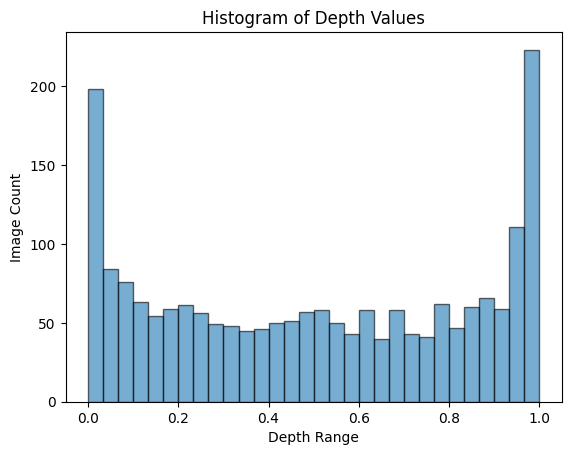

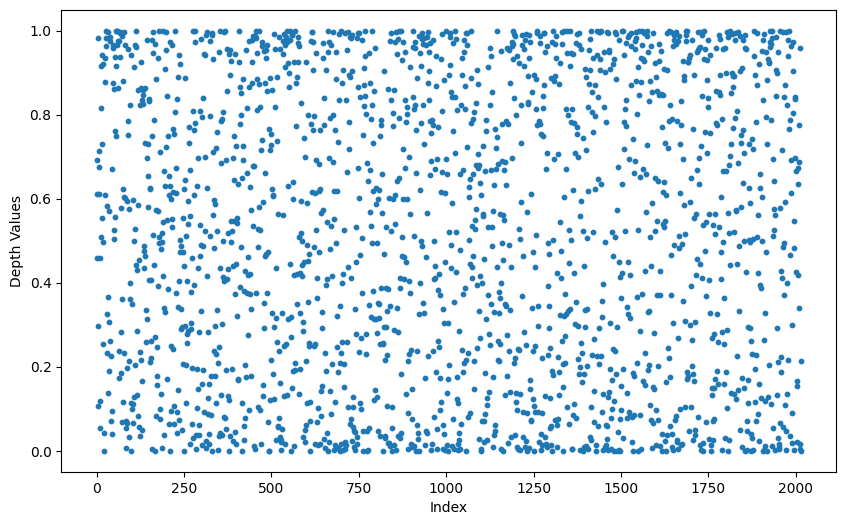

In [ ]:
plt.hist(df["depth"], bins=30, edgecolor='k', alpha=0.6)
plt.title('Histogram of Depth Values')
plt.xlabel('Depth Range')
plt.ylabel('Image Count')
plt.savefig(f"{PLOTS_FOLDER}depth")
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(range(len(df["depth"])), df["depth"], s=10)
plt.xlabel("Index")
plt.ylabel("Depth Values")
plt.show()

Pitch and Roll distribution

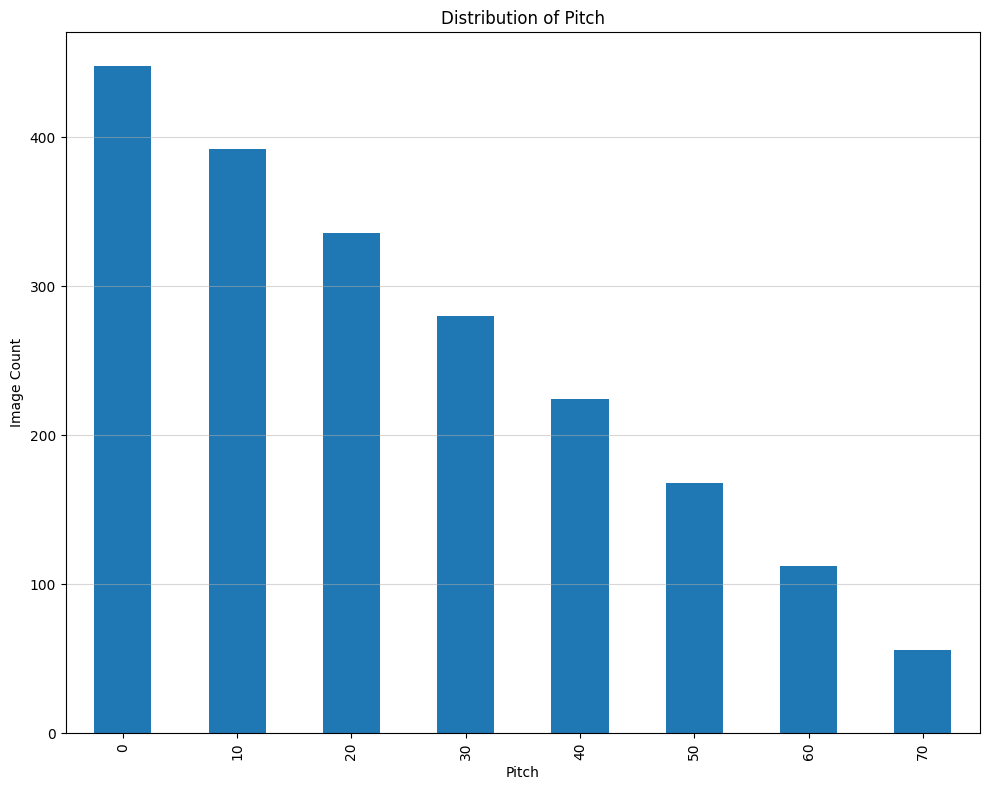

In [ ]:
plt.figure(figsize=(10, 8))
df['pitch'].value_counts().plot(kind='bar')
plt.title('Distribution of Pitch')
plt.xlabel('Pitch')
plt.ylabel('Image Count')
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()
plt.savefig(f"{PLOTS_FOLDER}pitch")
plt.show()

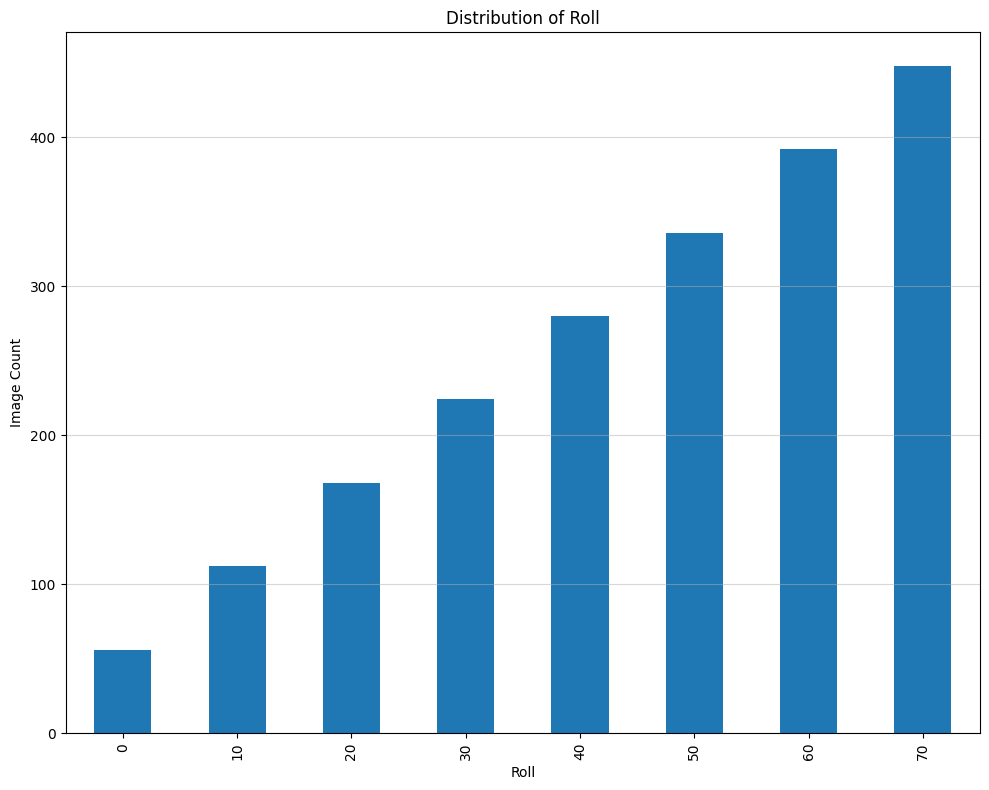

In [ ]:
plt.figure(figsize=(10, 8))
df['roll'].value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of Roll')
plt.xlabel('Roll')
plt.ylabel('Image Count')
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()
plt.savefig(f"{PLOTS_FOLDER}roll")
plt.show()

Distribution of labels

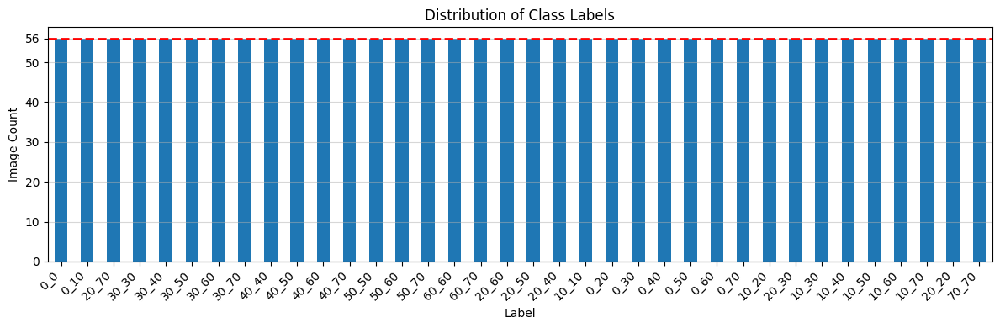

In [ ]:
plt.figure(figsize=(12, 4))
df['label'].value_counts().plot(kind='bar')
plt.axhline(y=df['label'].value_counts().values[0], color='red', linestyle='--', linewidth=2)
plt.title('Distribution of Class Labels')
plt.xlabel('Label')
plt.ylabel('Image Count')
plt.yticks([0, 10, 20, 30, 40, 50, 56])
plt.xticks(rotation=45, fontsize=10, ha='right')
plt.grid(axis='y', alpha=0.5)
plt.tight_layout()
plt.savefig(f"{PLOTS_FOLDER}labels")
plt.show()

NameError: name 'PLOTS_FOLDER' is not defined

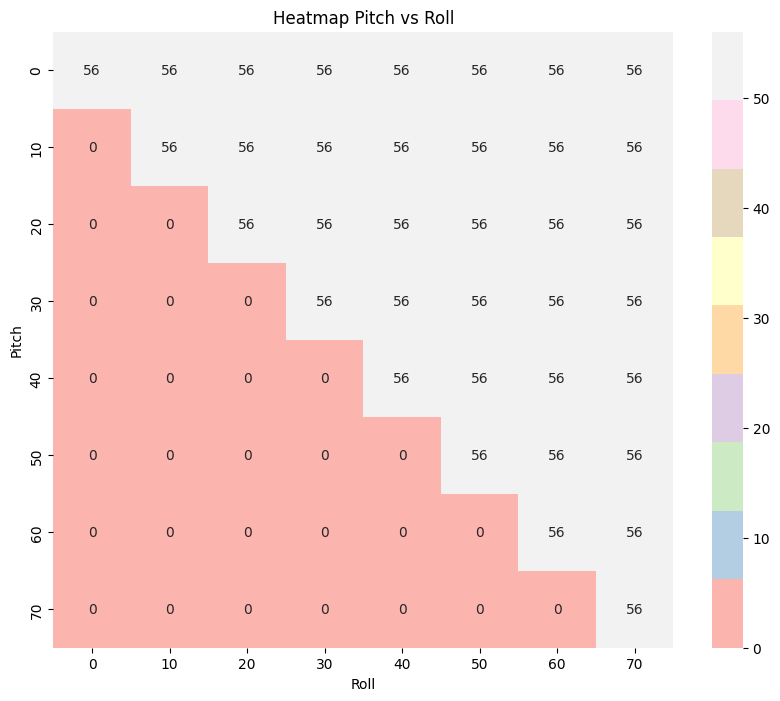

In [5]:
poses = df.groupby(['pitch', 'roll']).size().unstack(fill_value=0)
plt.figure(figsize=(10, 8))
sns.heatmap(poses, annot=True, cmap="Pastel1")
plt.title("Heatmap Pitch vs Roll")
plt.xlabel("Roll")
plt.ylabel("Pitch")
plt.savefig(f"{PLOTS_FOLDER}labels_map")
plt.show()

### Visualization of sample images - plot different poses (combinations of pitch and roll)

<ipython-input-14-bad21342babe>:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img = mpimg.imread(tmp.iloc[0][0])


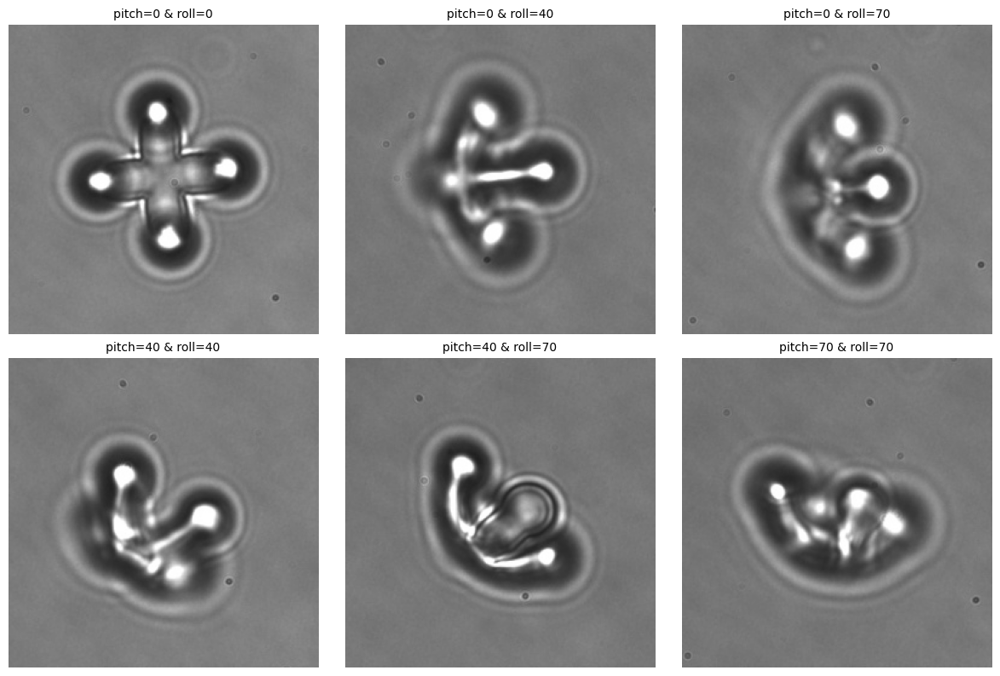

In [ ]:
pitch_roll_combs = [(0, 0), (0, 40), (0, 70), (40, 40), (40, 70), (70, 70)]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for i, (p, r) in enumerate(pitch_roll_combs):
    label = f"{p}_{r}"

    tmp = df[df["label"] == label].copy()
    img = mpimg.imread(tmp.iloc[0][0])
    axes[i].imshow(img, cmap='gray')
    axes[i].axis('off')
    axes[i].set_title(f"pitch={p} & roll={r}", fontsize=10)
plt.tight_layout()
plt.savefig(f"{PLOTS_FOLDER}images")
plt.show()

### **Data Augumentation Exploration**
-----
Manipulate depth perception using depth maps.
Additionally, we implemented a solution for hightening the brightness of an image.

In [22]:
def brighten_image(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 140, 255, cv2.THRESH_BINARY)
    mask = (mask / 255).astype(np.uint8)
    new_image = image.copy()
    new_image[mask == 1] = np.clip(image[mask == 1] * 2.5, 0, 255)
    return new_image

from sklearn.utils import shuffle
def aug_image(image):
  channels = cv2.split(image)
  l_channels = []
  for channel in channels:
    channel = channel.astype(np.uint8)
    b_channel = cv2.GaussianBlur(channel, (3, 3), 0)
    l_channels.append(cv2.Laplacian(b_channel, cv2.CV_64F))

  n_channels = []
  for channel in l_channels:
    mini = np.min(channel)
    maxi = np.max(channel)
    n_channels.append(((channel - mini) / (maxi - mini) * 255).astype(np.uint8))

  depth_map = cv2.merge(n_channels)

  image = image.astype(np.float32)
  depth_map = depth_map.astype(np.float32)

  images = []
  # alpga is the factor of the original image and beta is the factor of the depth map
  for alpha in [0.4, 0.6, 0.8]:
    beta = 1 - alpha
    aug_image = cv2.addWeighted(image, alpha, depth_map, beta, 0)
    aug_image = np.clip(aug_image, 0, 255).astype(np.float32)
    images.append(aug_image)

  return images

def augment_dataset(dataset):
    X = []
    y = []

    for images, targets in dataset:
        X.append(images.numpy())
        y.append(targets.numpy())

    aug_X = []
    aug_y = []

    for i in range(len(X)):
        Xs = aug_image(X[i].astype(np.uint8))
        for x in Xs:
          aug_X.append(x)
          aug_y.append(y[i])
        aug_X.append(X[i])
        aug_y.append(y[i])

    aug_X, aug_y = shuffle(aug_X, aug_y, random_state=42)
    return tf.data.Dataset.from_tensor_slices((aug_X, aug_y))

Plot augumentation tranformations

<ipython-input-47-e4df933f060c>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  image = cv2.imread(tmp.iloc[3][0])


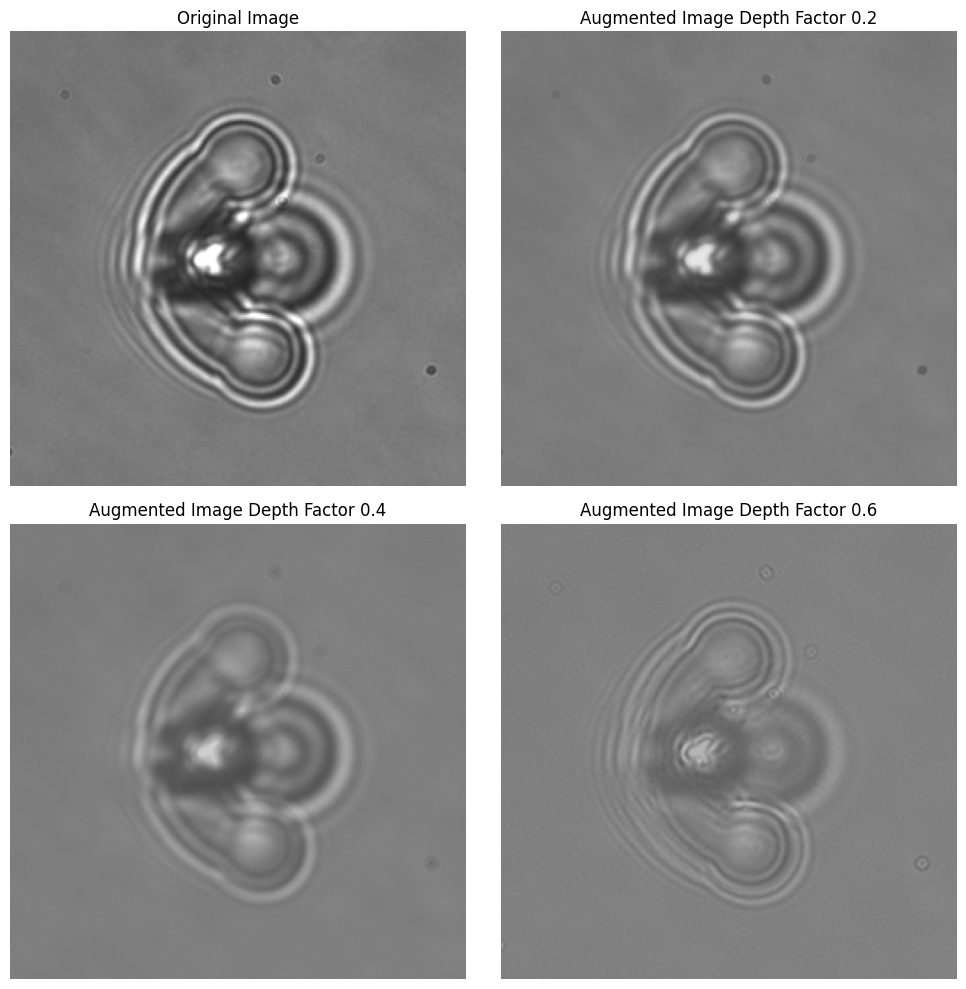

<ipython-input-47-e4df933f060c>:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  image = cv2.imread(tmp.iloc[1][0])


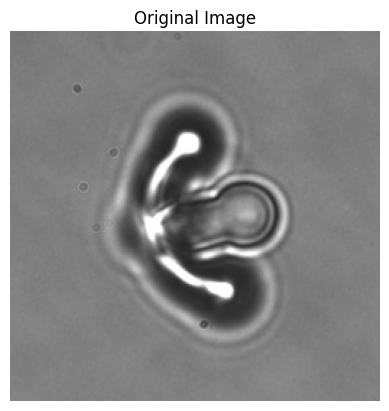

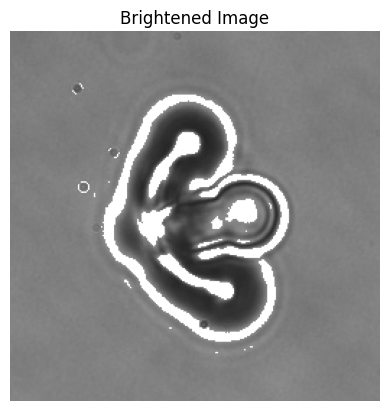

<ipython-input-47-e4df933f060c>:33: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  images = aug_image(cv2.imread(tmp.iloc[1][0]))


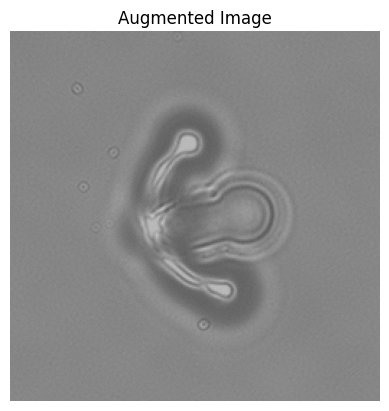

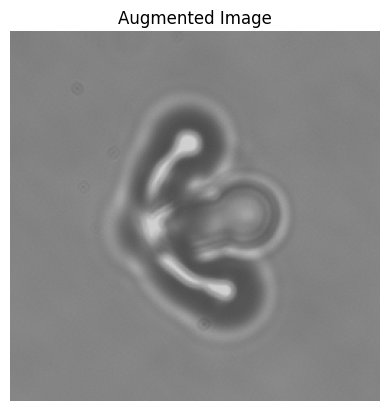

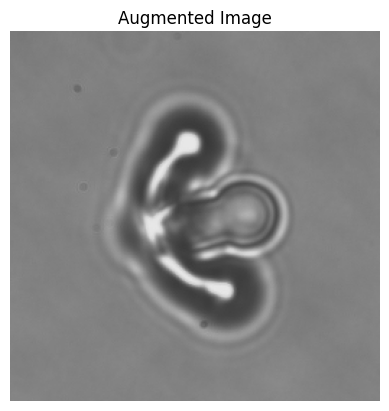

In [47]:
label = f"0_70"
tmp = df[df["label"] == label]
image = cv2.imread(tmp.iloc[3][0])
augs = aug_image(image)

fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs = axs.ravel()
i = 0
for title, img in zip(['Original Image', 'Augmented Image Depth Factor 0.2', 'Augmented Image Depth Factor 0.4', 'Augmented Image Depth Factor 0.6'], [image] + list(reversed(augs))):
  axs[i].imshow(tf.cast(img, tf.uint8), cmap='gray')
  axs[i].axis('off')
  axs[i].set_title(title)
  i += 1
plt.tight_layout()
plt.savefig(f"{PLOTS_FOLDER}aug_image")
plt.show()

label = f"10_60"
tmp = df[df["label"] == label]

image = cv2.imread(tmp.iloc[1][0])
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Original Image')
plt.show()

image = brighten_image(image)
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Brightened Image')
plt.show()

images = aug_image(cv2.imread(tmp.iloc[1][0]))

for img in images:
  plt.imshow(tf.cast(img, tf.uint8), cmap='gray')
  plt.axis('off')
  plt.title('Augmented Image')
  plt.show()

### **Normalization/Standardization and Splitting**
---

#### **Resize and Normalize the image**

Resized the image to 100 x 100 and normalized it by centering it (substract mean) and scaling pixel values between [-1, 1] (the image is not clipped).

<ipython-input-12-f2319fd16e42>:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  image = cv2.imread(tmp.iloc[0][0])


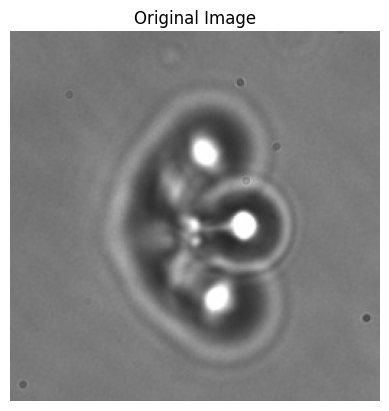

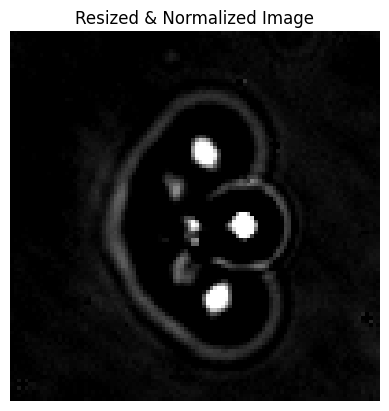

In [ ]:
def resize_img(image, h=100, w=100):
  return cv2.resize(image, (w, h))

def normalize_img(image):
  return ((image - np.mean(image)) / 127)

label = f"0_70"
tmp = df[df["label"] == label]

image = cv2.imread(tmp.iloc[3][0])
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Original Image')
plt.show()

image = resize_img(image)
image = normalize_img(image)
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Normalized Image')
plt.show()

### **Depth Standardization + Normalization**

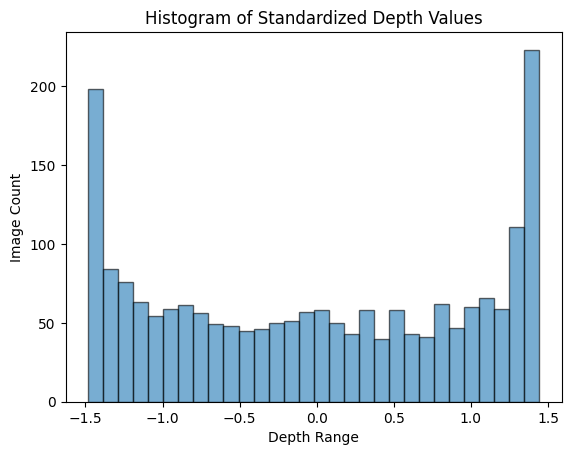

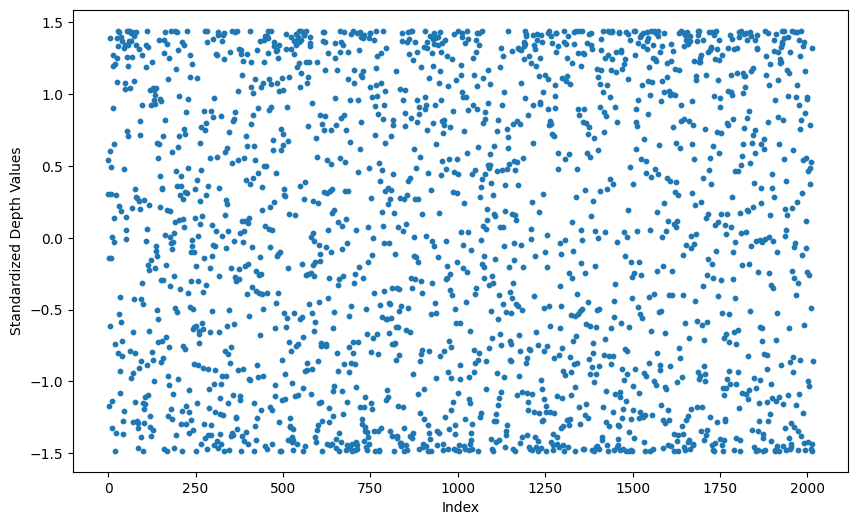

,img,label,pitch,roll,depth,height,width,channels,init_depth,depth_std
0,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,0.307041,256,256,3,0.611818,0.307041
1,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,0.544485,256,256,3,0.693017,0.544485
2,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,-0.143301,256,256,3,0.457814,-0.143301
3,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,-1.172724,256,256,3,0.105780,-1.172724
4,/content/drive/MyDrive/dl-partA/data/0_0/6_P0_...,0_0,0,0,-0.614502,256,256,3,0.296676,-0.614502


In [10]:
depth_std = (df['depth'] - df['depth'].mean()) / df['depth'].std()

plt.hist(depth_std, bins=30, edgecolor='k', alpha=0.6)
plt.title('Histogram of Standardized Depth Values')
plt.xlabel('Depth Range')
plt.ylabel('Image Count')
plt.savefig(f"{PLOTS_FOLDER}depth_std_hist")
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(range(len(depth_std)), depth_std, s=10)
plt.xlabel("Index")
plt.ylabel("Standardized Depth Values")
plt.savefig(f"{PLOTS_FOLDER}depth_std_dist")
plt.show()

df["init_depth"] = df['depth'].copy()
df['depth'] = depth_std
df.to_csv(f"{FOLDER}img_desc.csv", index=False)
df.head()

### **Split Logic**

In [4]:
def split_data(dataset, test_size=0.2, val_size=0.2, strat=True):
  X = []
  y = []

  for images, targets in dataset:
      X.append(images.numpy())
      y.append(targets.numpy())

  X = np.concatenate(X, axis=0)
  y = np.concatenate(y, axis=0)

  if strat:
    stratify = y
  else:
    stratify = None

  X, X_test, y, y_test = train_test_split(X, y, test_size=test_size, random_state=42, stratify=stratify, shuffle=True)

  if strat:
    stratify = y
  else:
    stratify = None

  X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=val_size, random_state=42, stratify=stratify, shuffle=True)

  return  X_train, X_val, X_test, y_train, y_val, y_test

def split_dataset(dataset, test_size=0.2, val_size=0.2, strat=True):

  X_train, X_val, X_test, y_train, y_val, y_test = split_data(dataset, test_size=test_size, val_size=val_size, strat=strat)

  train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
  val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
  test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

  return train_dataset, val_dataset, test_dataset

### **Create Datasets**
Create dataset for microbot pose classification

In [5]:
def normalize_img(image):
    image = tf.cast(image, tf.float32)
    return (image - tf.reduce_mean(image)) / 127.0

def create_poses_datasets(dir=f"{FOLDER}/data", image_size=(256, 256), normalize=True, augment=False, test_size=0.2, val_size=0.2, strat=True):

  dataset = tf.keras.utils.image_dataset_from_directory(
        dir,
        labels='inferred',
        label_mode='categorical',
        image_size=image_size
  )

  labels = dataset.class_names

  train_dataset, val_dataset, test_dataset = split_dataset(dataset, test_size=test_size, val_size=val_size, strat=strat)

  if augment:
    train_dataset = augment_dataset(train_dataset)

  if normalize:
    train_dataset = train_dataset.map(lambda x, y: (normalize_img(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    test_dataset = test_dataset.map(lambda x, y: (normalize_img(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    val_dataset = val_dataset.map(lambda x, y: (normalize_img(x), y), num_parallel_calls=tf.data.AUTOTUNE)

  train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)
  val_dataset = val_dataset.prefetch(tf.data.AUTOTUNE)

  return labels, train_dataset, val_dataset, test_dataset

Create dataset for depth prediction (regression task)

In [6]:
def get_image(path, normalize=True):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)
    if normalize:
      image = normalize_img(image)
    return image

def create_depth_datasets(df, image_size=(100, 100), normalize=True, test_size=0.2, val_size=0.2, strat=False, batch_size=16):
  dataset = tf.data.Dataset.from_tensor_slices((df["img"], df["depth"]))
  dataset = dataset.map(lambda x, y: (get_image(x, normalize=normalize), y), num_parallel_calls=tf.data.AUTOTUNE)
  dataset = dataset.batch(batch_size)
  train_dataset, val_dataset, test_dataset = split_dataset(dataset, test_size=test_size, val_size=val_size, strat=strat)

  return train_dataset, val_dataset, test_dataset

# **Classification Task**
---

In [7]:
# Credits: Google Colab
info = !nvidia-smi
info = '\n'.join(info)
if info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(info)

Sun Dec 22 16:27:36 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Define basic CNN models: 2 x models with 2 convolutional layers, 1 model with 3 convolutional layers.

In [8]:
class CNN2(tf.keras.Model):
    def __init__(self, input_shape, num_classes, dropout_rate=0.5):
        super(CNN2, self).__init__()
        self.resize = Resizing(128, 128)
        self.conv1 = Conv2D(32, (3, 3), activation='relu')
        self.pool1 = MaxPooling2D((2, 2))

        self.conv2 = Conv2D(64, (3, 3), activation='relu')
        self.pool2 = MaxPooling2D((2, 2))

        self.flatten = Flatten()
        self.dense1 = Dense(128, activation='relu')
        self.dropout = Dropout(dropout_rate)
        self.out = Dense(num_classes, activation='softmax')

    def call(self, inputs, training=False):
        x = self.resize(inputs)
        x = self.conv1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dropout(x, training=training)
        outs = self.out(x)
        return outs

class CNN2_(tf.keras.Model):
    def __init__(self, input_shape, num_classes, dropout_rate=0.2):
        super(CNN2_, self).__init__()
        # first conv layer
        self.resize = Resizing(128, 128)
        self.conv1 = Conv2D(32, (3, 3), activation='relu', input_shape=input_shape)
        self.pool1 = MaxPooling2D((2, 2))

        # second conv layer
        self.conv2 = Conv2D(64, (3, 3), activation='relu')
        self.pool2 = MaxPooling2D((2, 2))

        self.flatten = Flatten()
        self.out = Dense(num_classes, activation='softmax')

    def call(self, inputs, training=False):
        x = self.resize(inputs)
        x = self.conv1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = self.flatten(x)
        outs = self.out(x)
        return outs

class CNN3(tf.keras.Model):
    def __init__(self, input_shape, num_classes, dropout_rate=0.5):
        super(CNN3, self).__init__()
        self.resize = Resizing(128, 128)
        # first conv layer
        self.conv1 = Conv2D(32, (3, 3), activation='relu', input_shape=input_shape)
        self.pool1 = MaxPooling2D((2, 2))

        # second conv layer
        self.conv2 = Conv2D(64, (3, 3), activation='relu')
        self.pool2 = MaxPooling2D((2, 2))

        # third conv layer
        self.conv3 = Conv2D(128, (3, 3), activation='relu')
        self.pool3 = MaxPooling2D((2, 2))

        self.flatten = Flatten()
        self.dense = Dense(128, activation='relu')
        self.dropout = Dropout(dropout_rate)

        self.out = Dense(num_classes, activation='softmax')

    def call(self, inputs, training=False):
        x = self.resize(inputs)
        x = self.conv1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = self.conv3(x)
        x = self.pool3(x)
        x = self.flatten(x)
        x = self.dense(x)
        x = self.dropout(x, training=training)
        outs = self.out(x)
        return outs

In [9]:
from matplotlib.ticker import MaxNLocator

def get_model(name, input_shape, num_classes):
  if name == "cnn2":
    return CNN2(input_shape, num_classes)
  elif name == "cnn2_":
    return CNN2_(input_shape, num_classes)
  elif name == "cnn3":
    return CNN3(input_shape, num_classes)
  else:
    raise Exception("Model does not exist")

def get_classes(x):
  return np.argmax(x, axis=1)

def evaluate_model(model, labels, X_test, y_test, path=""):
  loss, accuracy = model.evaluate(X_test, y_test)
  print(f"Test Loss: {loss}")

  y_pred = model.predict(X_test)
  y_pred = get_classes(y_pred)
  y_true = get_classes(y_test)

  acc = accuracy_score(y_true, y_pred)
  print(f"Test Accuracy: {acc}")

  precision = precision_score(y_true, y_pred, average="weighted")
  print(f"Test Precision: {precision}")

  recall = recall_score(y_true, y_pred, average="weighted")
  print(f"Test Recall: {recall}")

  f1 = f1_score(y_true, y_pred, average="weighted")
  print(f"Test F1 Score: {f1}")

  cm = confusion_matrix(y_true, y_pred)

  plt.figure(figsize=(8, 6))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True, square=True, linewidths=0.5, linecolor='gray', xticklabels=labels, yticklabels=labels)
  plt.xlabel('Predicted Labels')
  plt.ylabel('Actual Labels')
  plt.title('Confusion Matrix')
  plt.tight_layout()
  plt.savefig(path)
  plt.show()

  return acc, precision, recall, f1

def store_results(data, model, results):
  timestamp = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
  results["time"] = timestamp
  results["model"] = model
  data.append(results)
  return data

def comparison_plot(history, title, m1, m2, save=False, file="plot"):
  plt.plot(range(1, len(history[m1]) + 1), history[m1], label=f'Training {title.split()[0]}')
  plt.plot(range(1, len(history[m1]) + 1), history[m2], label=f'Validation {title.split()[0]}')
  plt.xlabel('Epochs')
  plt.ylabel(f'{title.split()[0]}')
  plt.title(f'Training vs Validation {title}')
  ax = plt.gca()
  ax.xaxis.set_major_locator(MaxNLocator(integer=True))
  plt.legend()
  plt.grid(True)
  if save:
    plt.savefig(file)
  plt.show()

def plot_training_metrics(model_history, folder, models=["cnn2", "cnn2_", "cnn3"], save=False):
  os.makedirs(folder, exist_ok=True)

  for model_type in models:
    epochs = [5, 10, 20, 30]
    print(f"MODEL {model_type}")
    for i, history in enumerate(model_history[model_type]):
        comparison_plot(history.history, f"Loss", 'loss', 'val_loss', save=save, file=f"{folder}{model_type}-loss-ep{epochs[i]}")
        comparison_plot(history.history, f"Accuracy", 'accuracy', 'val_accuracy', save=save, file=f"{folder}{model_type}-acc-ep{epochs[i]}")

def comparison_plot_tuning(metric, train, val, epoch, save=False, file="plot"):
  plt.figure(figsize=(10, 6))
  plt.plot(train, label=f'Training {metric}')
  plt.plot(val, label=f'Validation {metric}')
  plt.axvline(x=epoch, color='red', linestyle='--', label='Fine Tuning')
  plt.title(f'Training and Validation {metric}')
  plt.xlabel('Epoch')
  plt.ylabel(f'{metric}')
  plt.legend()
  plt.grid(True)
  if save:
    plt.savefig(file)
  plt.tight_layout()
  plt.show()

def plot_training_and_tuning_metrics(model_history, folder, epoch, models=[], save=False):
  for model in models:
    train, tune = model_history[model]

    t_acc = train['accuracy'] + tune["accuracy"]
    v_acc = train['val_accuracy'] + tune["val_accuracy"]
    comparison_plot_tuning("Accuracy", t_acc, v_acc, epoch, save=save, file=f"{folder}{model}-acc")

    t_acc = train['loss'] + tune["loss"]
    v_acc = train['val_loss'] + tune["val_loss"]
    comparison_plot_tuning("Loss", t_acc, v_acc, epoch, save=save, file=f"{folder}{model}-loss")

Get train, validation and test datasets for classification task

In [10]:
labels, train_dataset, val_dataset, test_dataset = create_poses_datasets(dir=f"{FOLDER}/data", normalize=False, strat=True, augment=False)

Found 2016 files belonging to 36 classes.


In [23]:
aug_train_dataset = augment_dataset(train_dataset)

In [137]:
train = aug_train_dataset.map(lambda x, y: (normalize_img(x), y))
val = val_dataset.map(lambda x, y: (normalize_img(x), y))
test = test_dataset.map(lambda x, y: (normalize_img(x), y))

In [138]:
BATCH_SIZE = 16
train = train.batch(BATCH_SIZE)
val = val.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)

In [139]:
X_test = []
y_test = []
for imgs, targets in test.as_numpy_iterator():
    X_test.append(imgs)
    y_test.append(targets)

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

Define results path

In [140]:
data = []
BASIC_FOLDER = f"{FOLDER}/results/basic_model/not_aug"
os.makedirs(BASIC_FOLDER, exist_ok=True)

Train & Evaluate 3 Basic CNN Models

Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.0509 - loss: 3.5949 - val_accuracy: 0.3622 - val_loss: 2.5455
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.3961 - loss: 2.1384 - val_accuracy: 0.8700 - val_loss: 0.5869
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7159 - loss: 0.9191 - val_accuracy: 0.8854 - val_loss: 0.3625
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8172 - loss: 0.5193 - val_accuracy: 0.9040 - val_loss: 0.2880
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8690 - loss: 0.4146 - val_accuracy: 0.9257 - val_loss: 0.2811
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - accuracy: 0.9416 - loss: 0.1750
Test Loss: 0.19127176702022552
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
Test Accuracy: 0.9381188118811881
Test Precision: 0.9451213596634388
Test Recall: 0.9381188118811881
Test F1 Score: 0.9371142982543281


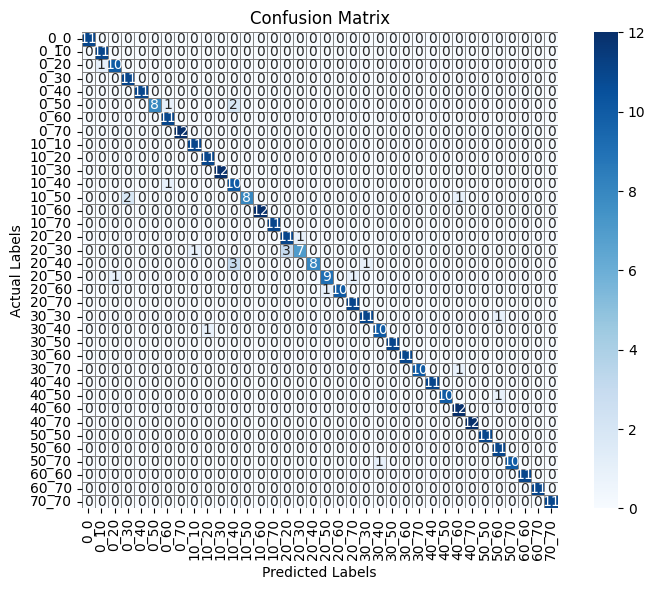

Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step - accuracy: 0.0737 - loss: 3.5248 - val_accuracy: 0.5728 - val_loss: 2.0216
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4777 - loss: 1.7680 - val_accuracy: 0.8576 - val_loss: 0.5738
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7454 - loss: 0.7768 - val_accuracy: 0.9040 - val_loss: 0.3523
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8611 - loss: 0.4316 - val_accuracy: 0.9133 - val_loss: 0.3164
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8782 - loss: 0.3835 - val_accuracy: 0.9288 - val_loss: 0.2933
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.9173 - loss: 0.2446 - val_accuracy: 0.9412 - val_loss: 0.2818
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.9272 - loss: 0.2105 - val_accuracy: 0.9257 - val_loss: 0.2841
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.9171 - loss: 0.2058 - val_accuracy: 0.9381 - v

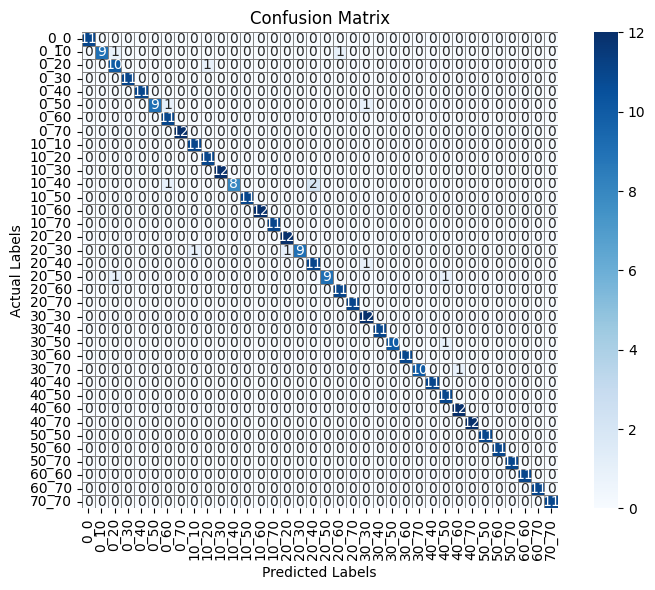

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


81/81 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.0837 - loss: 3.4257 - val_accuracy: 0.7492 - val_loss: 0.9892
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6681 - loss: 1.1515 - val_accuracy: 0.8762 - val_loss: 0.4066
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8368 - loss: 0.5071 - val_accuracy: 0.9226 - val_loss: 0.3095
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8860 - loss: 0.3518 - val_accuracy: 0.9412 - val_loss: 0.2720
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9366 - loss: 0.2135 - val_accuracy: 0.9381 - val_loss: 0.2806
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.9542 - loss: 0.2278
Test Loss: 0.2593742311000824
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
Test Accuracy: 0.943069306930693
Test Precision: 0.9481928275245107
Test Recall: 0.943069306930693
Test F1 Score: 0.9427476083477285


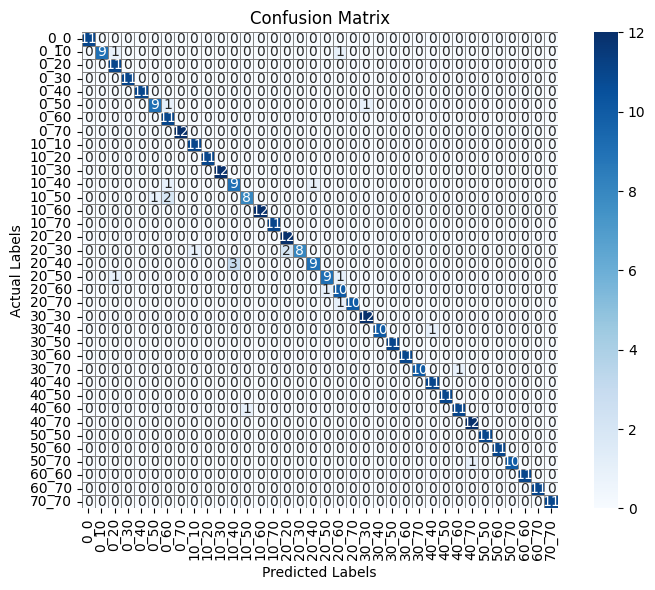

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


81/81 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - accuracy: 0.0625 - loss: 3.5158 - val_accuracy: 0.7183 - val_loss: 1.3698
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.6770 - loss: 1.1790 - val_accuracy: 0.8978 - val_loss: 0.3960
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8133 - loss: 0.6002 - val_accuracy: 0.9443 - val_loss: 0.2332
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9112 - loss: 0.3091 - val_accuracy: 0.9381 - val_loss: 0.2300
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9218 - loss: 0.2502 - val_accuracy: 0.9412 - val_loss: 0.2621
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9394 - loss: 0.1750 - val_accuracy: 0.9567 - val_loss: 0.1731
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9480 - loss: 0.1524 - val_accuracy: 0.9628 - val_loss: 0.1712
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9560 - loss: 0.1519 - val_accuracy: 0.9598 - val_loss: 0.

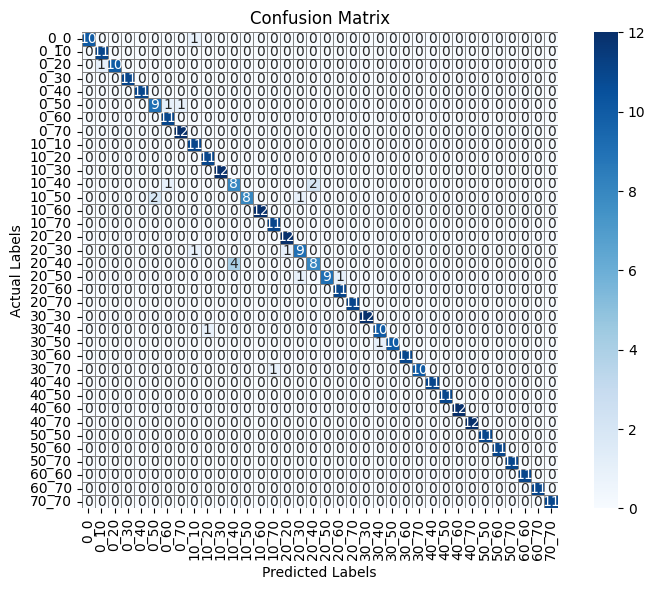

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


81/81 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.2841 - loss: 2.8560 - val_accuracy: 0.8885 - val_loss: 0.4442
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9409 - loss: 0.1785 - val_accuracy: 0.9164 - val_loss: 0.2921
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9800 - loss: 0.0595 - val_accuracy: 0.9319 - val_loss: 0.2310
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9973 - loss: 0.0141 - val_accuracy: 0.9381 - val_loss: 0.2222
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9930 - loss: 0.0138 - val_accuracy: 0.9443 - val_loss: 0.1779
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.9523 - loss: 0.1935
Test Loss: 0.20053023099899292
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Test Accuracy: 0.948019801980198
Test Precision: 0.9537174047075038
Test Recall: 0.948019801980198
Test F1 Score: 0.9478566061084697


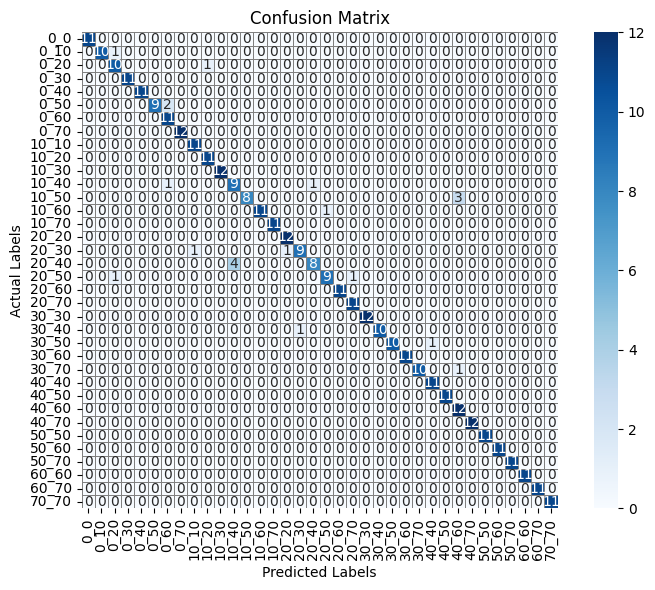

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


81/81 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.2899 - loss: 2.8954 - val_accuracy: 0.8607 - val_loss: 0.4957
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9461 - loss: 0.1768 - val_accuracy: 0.8885 - val_loss: 0.3721
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9882 - loss: 0.0325 - val_accuracy: 0.9319 - val_loss: 0.2901
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9840 - loss: 0.0496 - val_accuracy: 0.9350 - val_loss: 0.3583
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9968 - loss: 0.0112 - val_accuracy: 0.9412 - val_loss: 0.2960
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 1.0000 - loss: 5.8964e-04 - val_accuracy: 0.9350 - val_loss: 0.2726
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 1.0000 - loss: 2.6295e-04 - val_accuracy: 0.9381 - val_loss: 0.2752
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 1.0000 - loss: 1.8799e-04 - val_accuracy: 0.9381 - 

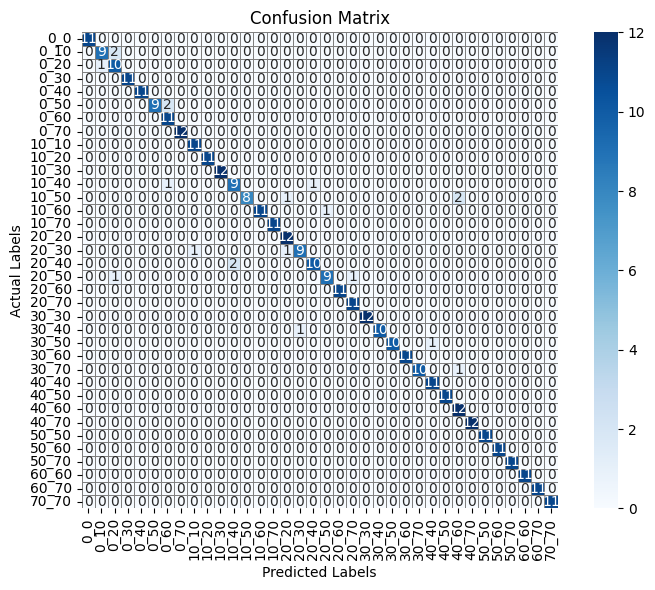

MODEL cnn2


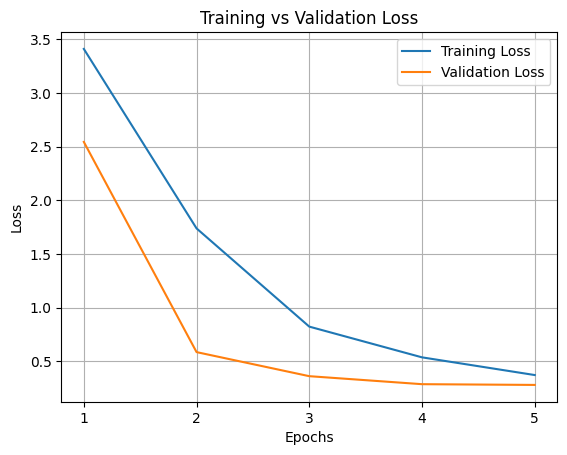

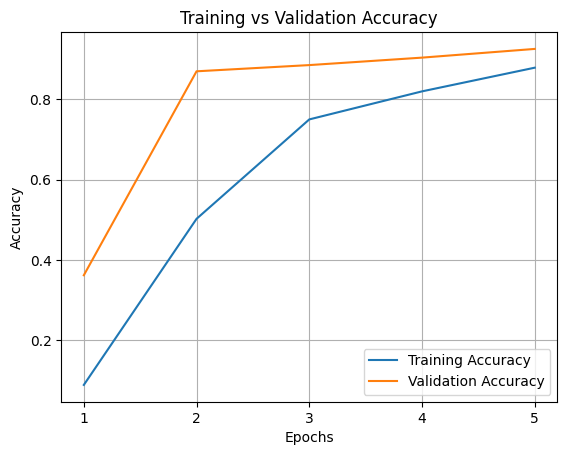

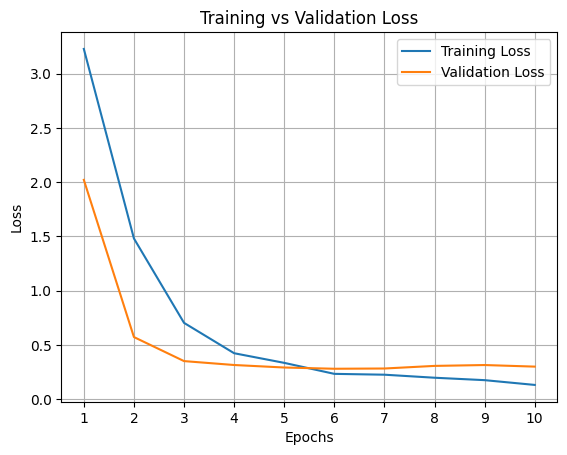

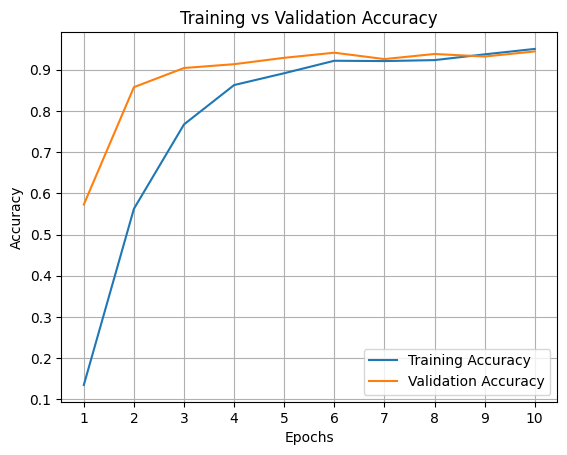

MODEL cnn2_


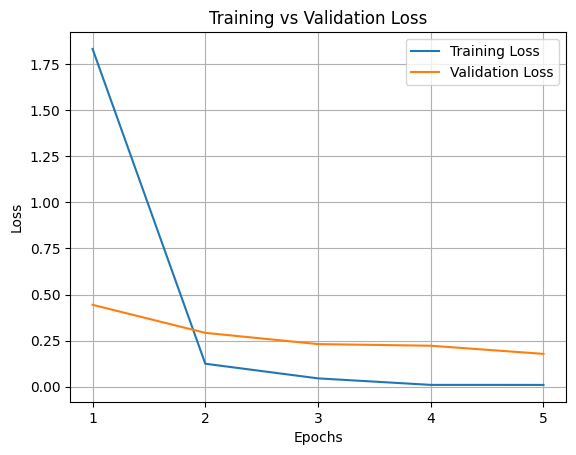

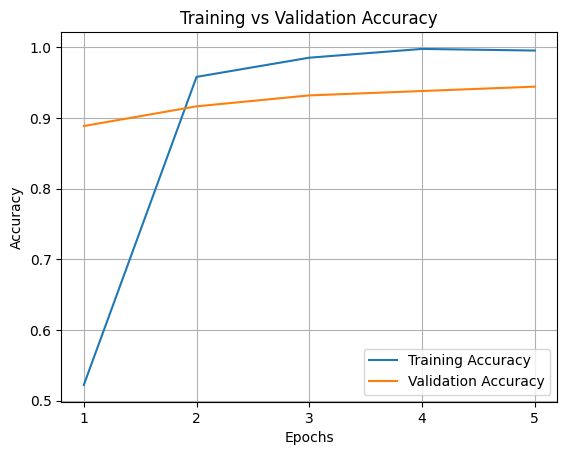

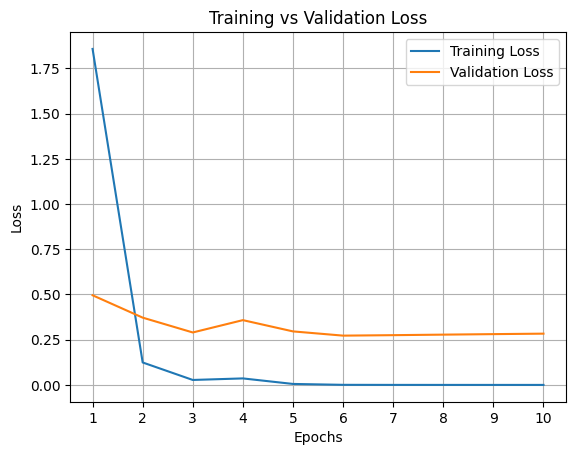

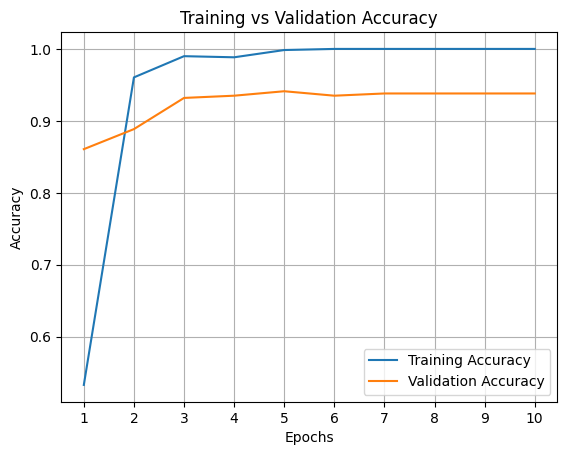

MODEL cnn3


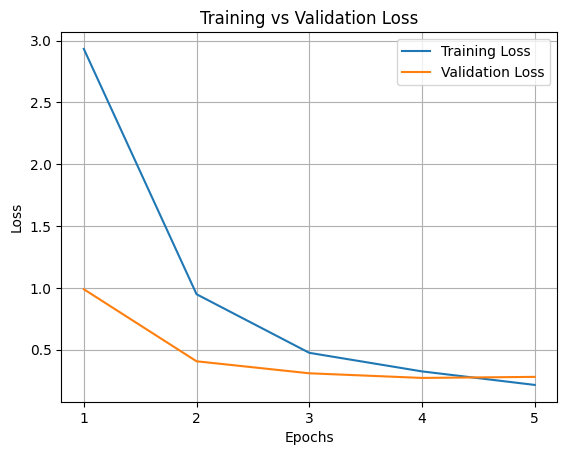

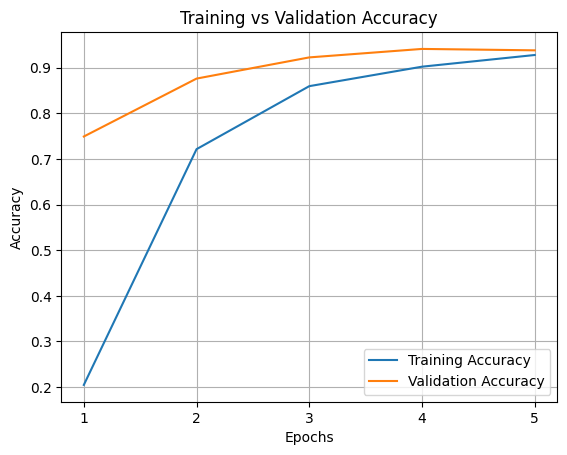

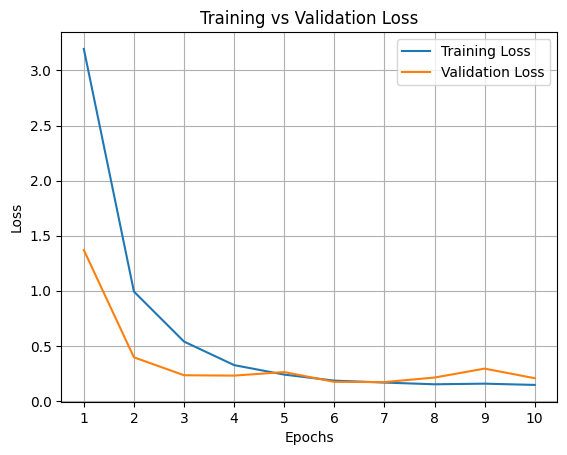

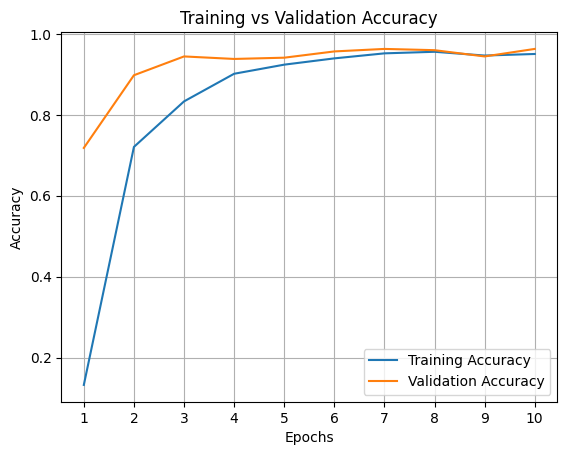

In [141]:
epochs = [5, 10]
model_history = {}

for model_type in ["cnn2", "cnn3", "cnn2_"]:
  model_history[model_type] = []
  for i, e in enumerate(epochs):

    model = get_model(name=model_type, input_shape=(None, None, 3), num_classes=36)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    history = model.fit(train,
                        epochs=e, batch_size=BATCH_SIZE,
                        validation_data=val,
                        callbacks=[keras.callbacks.ModelCheckpoint(f'{model_type}' +"save_at_epoch{epoch}.keras")])

    model_history[model_type].append(history)

    acc, precision, recall, f1 = evaluate_model(model, labels, X_test, y_test, path=f"{BASIC_FOLDER}{model_type}-cm-ep{e}")
    data = store_results(data, model_type, {"epochs": e, "acc": acc, "precision": precision, "recall": recall, "f1": f1})

df = pd.DataFrame(data)
df.to_csv(f"{BASIC_FOLDER}basic_cnns_results.csv", index=False)
plot_training_metrics(model_history, f"{BASIC_FOLDER}", save=True)

# Pre-trained Model Arhitectures
----

In [28]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet import preprocess_input as preprocess_input_resnet
from tensorflow.keras.applications.inception_v3  import preprocess_input as preprocess_input_inception
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input as preprocess_input_inception_resnet
from tensorflow.keras.layers import Input, Resizing
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers, models

Visualize preprocessing of different models

<ipython-input-21-23245972d48d>:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  image = cv2.imread(tmp.iloc[0][0])


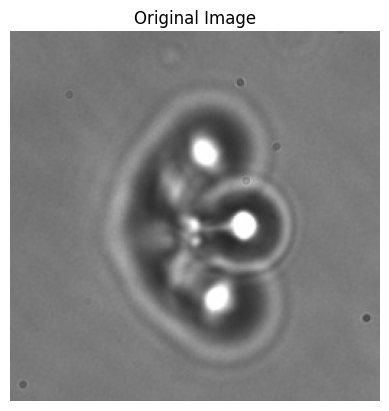

<ipython-input-21-23245972d48d>:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  image = cv2.imread(tmp.iloc[0][0])


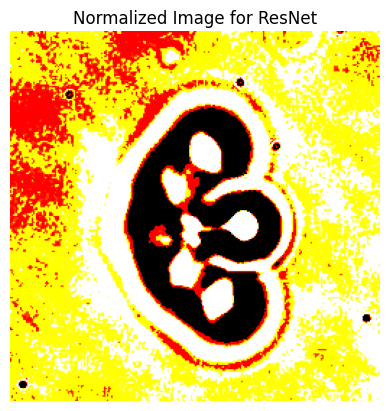

<ipython-input-21-23245972d48d>:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  image = cv2.imread(tmp.iloc[0][0])


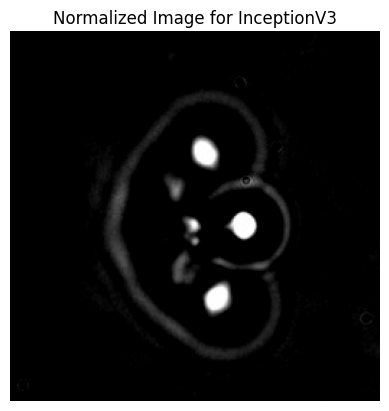

<ipython-input-21-23245972d48d>:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  image = cv2.imread(tmp.iloc[0][0])


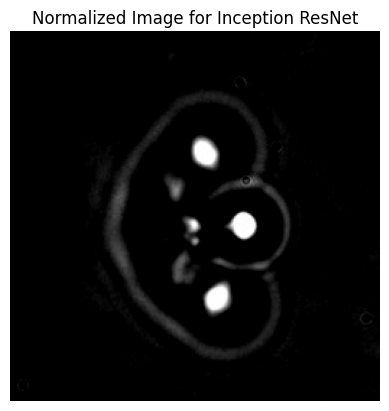

In [21]:
df = pd.read_csv(f"{FOLDER}img_desc.csv")
tmp = df[df["label"] == "0_70"]

image = cv2.imread(tmp.iloc[0][0])
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Original Image')
plt.show()

image = cv2.imread(tmp.iloc[0][0])
image = preprocess_input_resnet(image)
plt.imshow(image)
plt.axis('off')
plt.title('Normalized Image for ResNet')
plt.show()

image = cv2.imread(tmp.iloc[0][0])
image = preprocess_input_inception(image)
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Normalized Image for InceptionV3')
plt.show()

image = cv2.imread(tmp.iloc[0][0])
image = preprocess_input_inception_resnet(image)
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title('Normalized Image for Inception ResNet')
plt.show()

# **ResNet 50**
----

Preprocess input and view transformation

In [91]:
train = aug_train_dataset.map(lambda x, y: (preprocess_input_resnet(x), y))
val = val_dataset.map(lambda x, y: (preprocess_input_resnet(x), y))
test = test_dataset.map(lambda x, y: (preprocess_input_resnet(x), y))

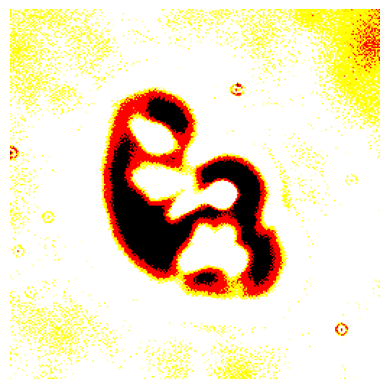

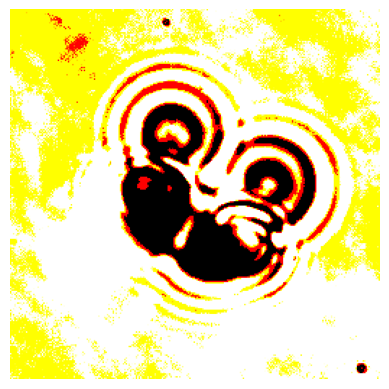

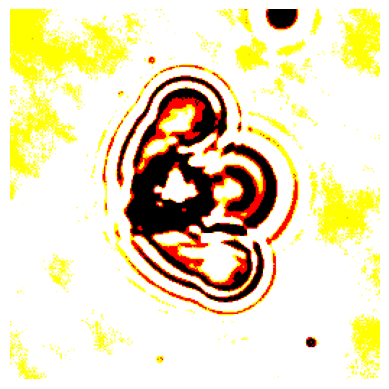

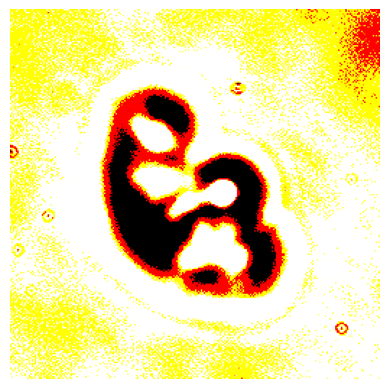

In [93]:
for image, targets in train.take(4):
  plt.imshow(image)
  plt.axis("off")
  plt.show()

Split data in batches

In [94]:
BATCH_SIZE = 16
train = train.batch(BATCH_SIZE)
val = val.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)

X_test = []
y_test = []
for imgs, targets in test.as_numpy_iterator():
    X_test.append(imgs)
    y_test.append(targets)

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

### Inspect ResNet50 Arhitecture

In [26]:
resnet = ResNet50(
    weights="imagenet",
    include_top=False,
)
resnet.trainable = False
resnet.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, None, None, 3)  │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, None, None, 64) │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, None, None, 64) │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, None, None, 64) │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, None, None, 64) │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, None, None, 64) │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, None, None, 64) │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, None, None, 64) │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, None, None, 64) │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, None, None, 64) │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, None, None, 64) │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, None, None, 64) │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, None, None,     │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │ 256)                   │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, None, None,     │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │ 256)                   │                │                        │
├──────────────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

Define path for results

In [15]:
resnet_data = []
RESNET_FOLDER = f"{FOLDER}/results/resnet_model/"
os.makedirs(RESNET_FOLDER, exist_ok=True)

### Train & Fine Tune Resnet50

In [98]:
def get_model_configs(name):
  if name == "resnet_last_10_flat":
    return (10,  layers.Flatten(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  elif name == "resnet_last_10_pooling":
    return (10,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  elif name == 'resnet_last_32_flat':
    return (32,  layers.Flatten(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  elif name == 'resnet_last_32_pooling':
    return (32,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  elif name == 'resnet_last_a_lot':
    return (None,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  else:
    raise Exception("Model does not exist")

MODEL: resnet_last_10_flat
Epoch 1/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step - accuracy: 0.5531 - loss: 5.0646 - val_accuracy: 0.8669 - val_loss: 1.1980
Epoch 2/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.9295 - loss: 0.4756 - val_accuracy: 0.9628 - val_loss: 0.3092
Epoch 3/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.9553 - loss: 0.2881 - val_accuracy: 0.9505 - val_loss: 0.6524
Epoch 4/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.9594 - loss: 0.3747 - val_accuracy: 0.9474 - val_loss: 0.7615
Epoch 5/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.9589 - loss: 0.4056 - val_accuracy: 0.9505 - val_loss: 0.6321
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step - accuracy: 0.9813 - loss: 0.1867 - val_accuracy: 0.9598 - val_loss: 0.5184
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.9936 - loss: 0.0564 - val_accuracy: 0.9845 - val_loss: 0.1360
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.9962 -

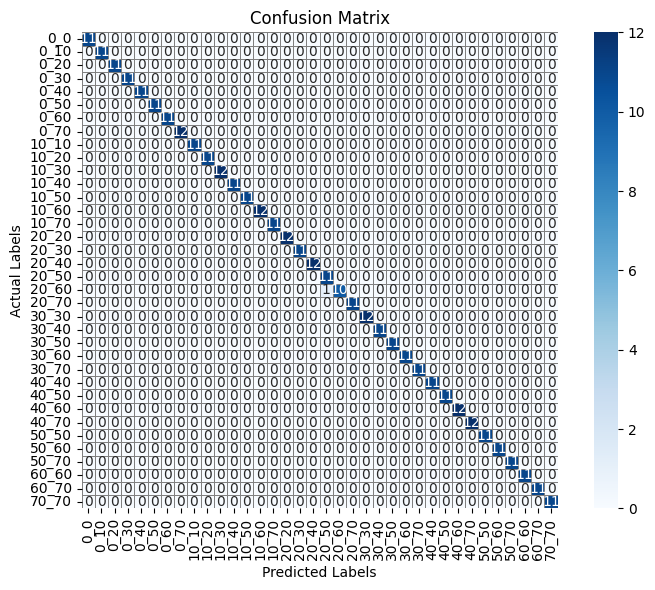

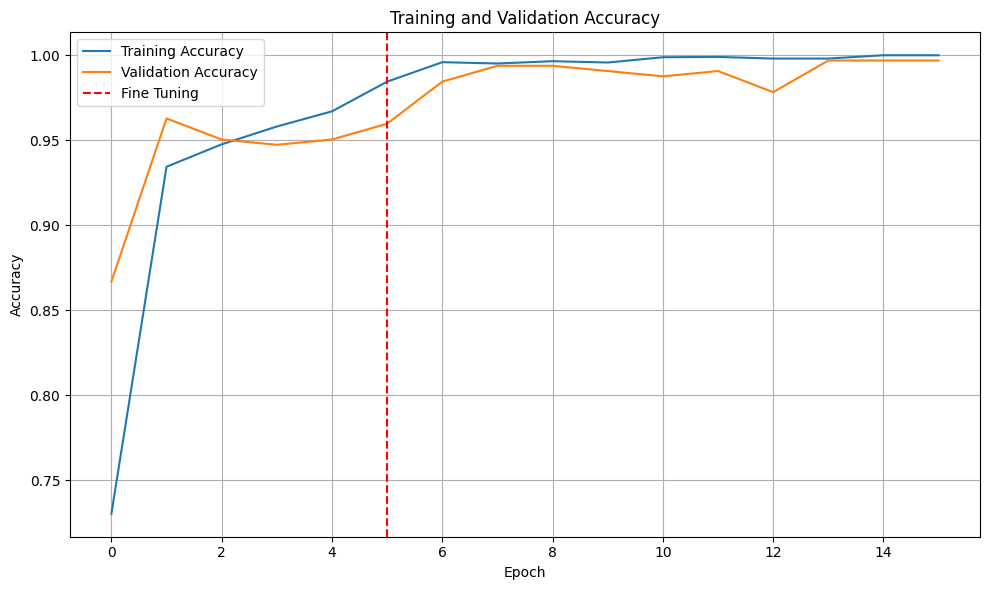

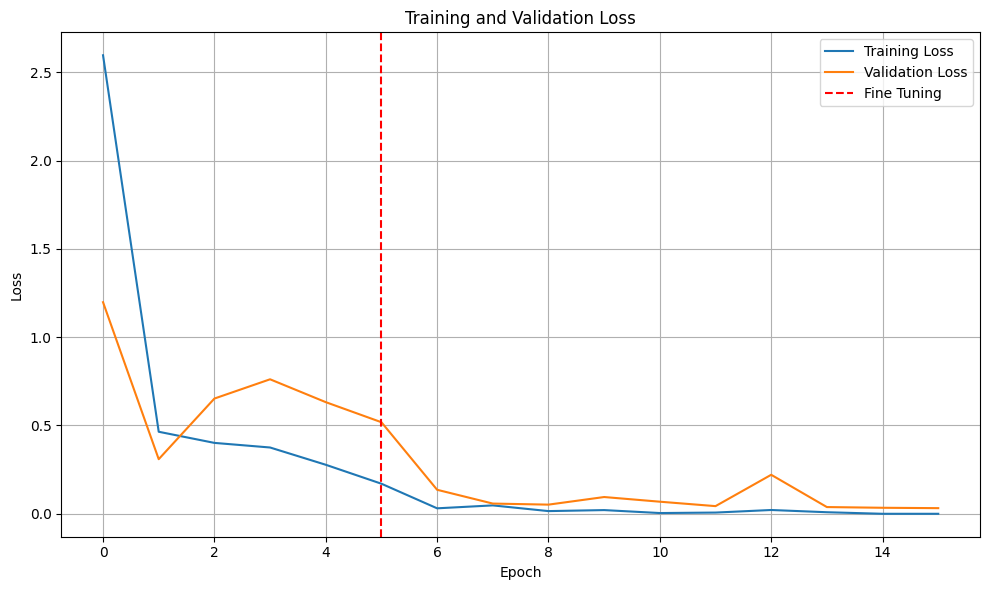

MODEL: resnet_last_10_pooling
Epoch 1/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step - accuracy: 0.2268 - loss: 3.0957 - val_accuracy: 0.7492 - val_loss: 0.9563
Epoch 2/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.7306 - loss: 0.9705 - val_accuracy: 0.8854 - val_loss: 0.4397
Epoch 3/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.8627 - loss: 0.5694 - val_accuracy: 0.9505 - val_loss: 0.2705
Epoch 4/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.9101 - loss: 0.3935 - val_accuracy: 0.9659 - val_loss: 0.1783
Epoch 5/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.9449 - loss: 0.2834 - val_accuracy: 0.9783 - val_loss: 0.1351
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.9207 - loss: 0.2898 - val_accuracy: 0.9876 - val_loss: 0.0506
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.9925 - loss: 0.0424 - val_accuracy: 0.9907 - val_loss: 0.0205
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.999

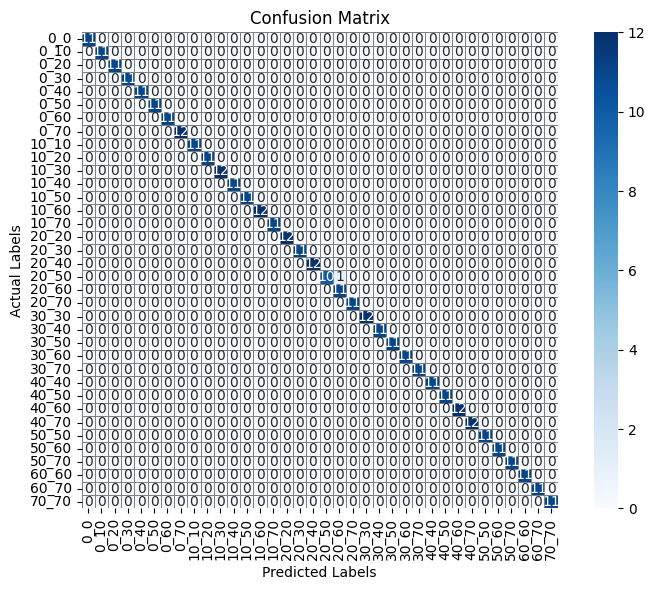

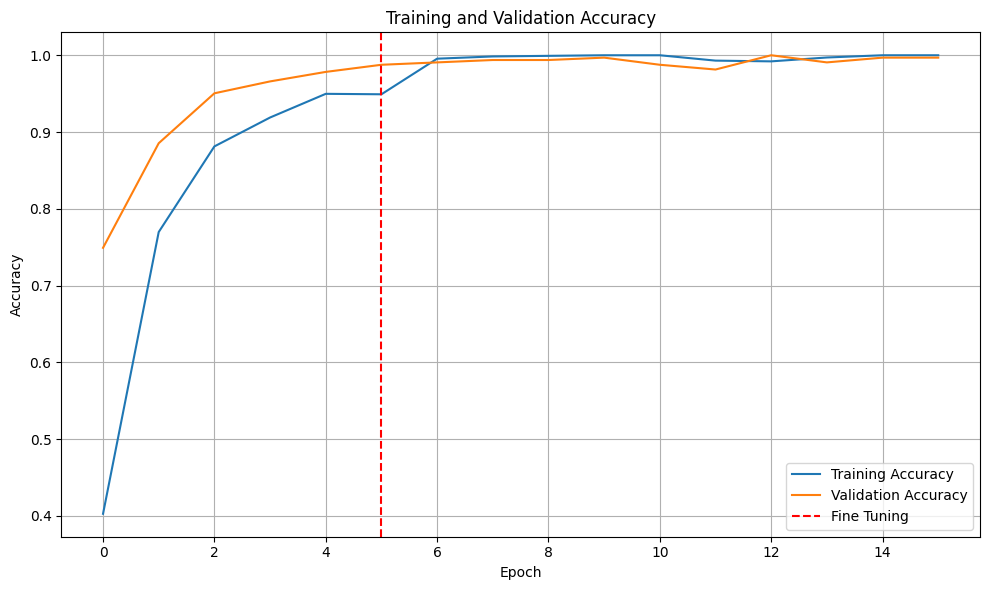

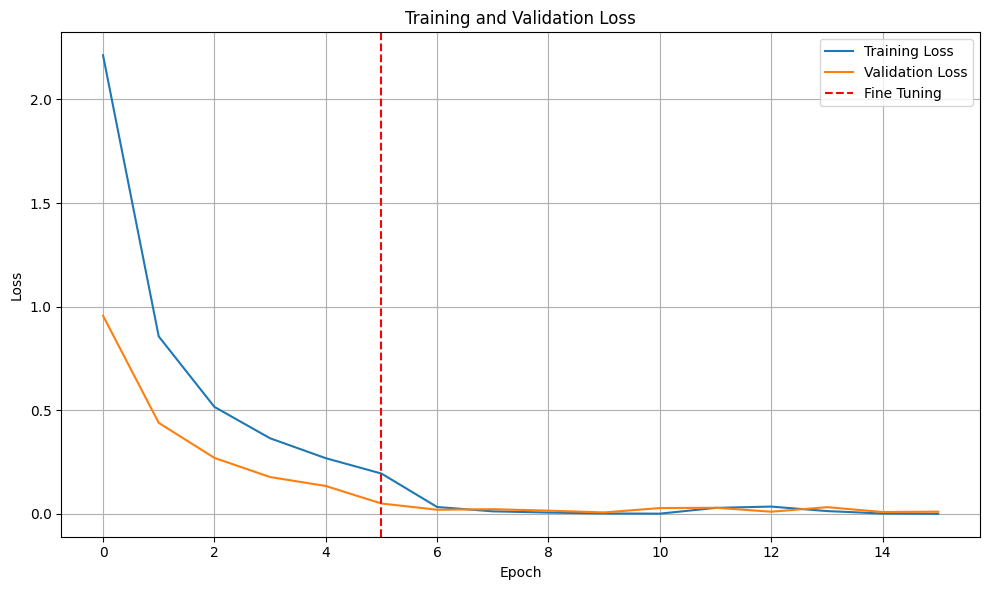

MODEL: resnet_last_32_pooling
Epoch 1/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step - accuracy: 0.2313 - loss: 3.0744 - val_accuracy: 0.7399 - val_loss: 0.9522
Epoch 2/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.7362 - loss: 0.9628 - val_accuracy: 0.9009 - val_loss: 0.3898
Epoch 3/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.8591 - loss: 0.5623 - val_accuracy: 0.9350 - val_loss: 0.2637
Epoch 4/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.9159 - loss: 0.3814 - val_accuracy: 0.9721 - val_loss: 0.1638
Epoch 5/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.9423 - loss: 0.2784 - val_accuracy: 0.9721 - val_loss: 0.1333
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.7812 - loss: 1.0057 - val_accuracy: 0.9907 - val_loss: 0.0217
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.9874 - loss: 0.0360 - val_accuracy: 0.9876 - val_loss: 0.0329
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step - accuracy: 0.9

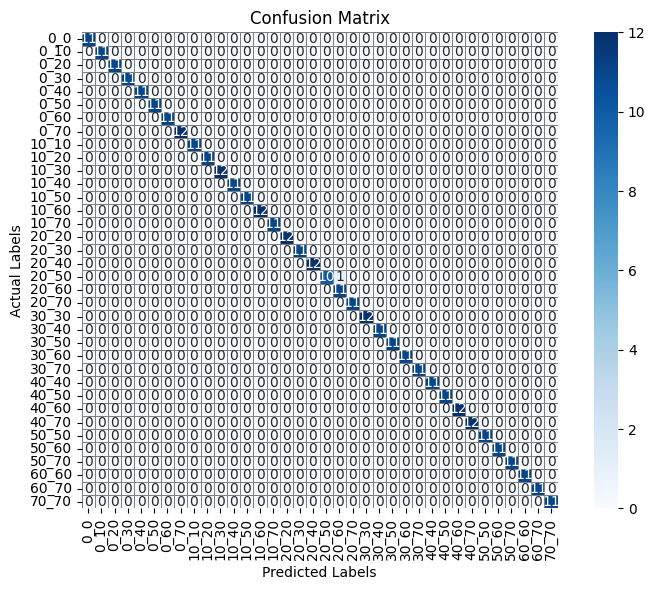

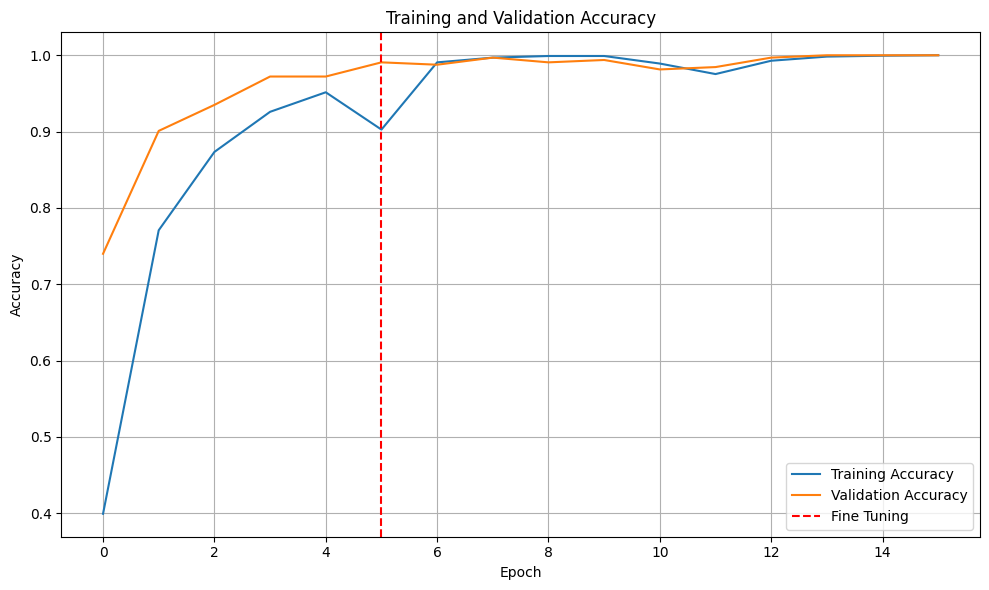

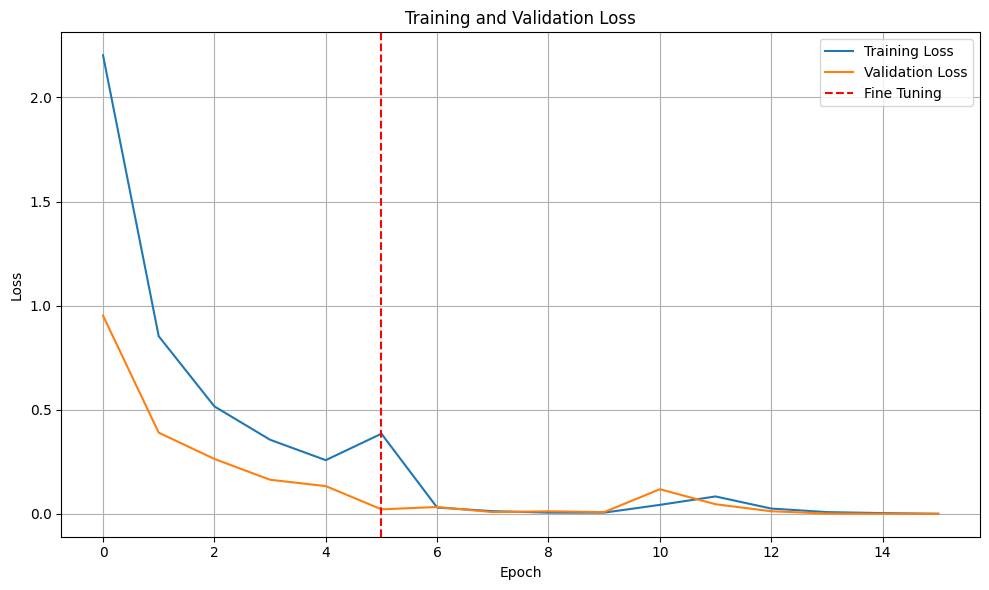

MODEL: resnet_last_32_flat
Epoch 1/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 22s 43ms/step - accuracy: 0.5609 - loss: 4.9912 - val_accuracy: 0.8916 - val_loss: 1.5022
Epoch 2/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.9224 - loss: 0.5632 - val_accuracy: 0.9474 - val_loss: 0.4184
Epoch 3/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.9521 - loss: 0.4481 - val_accuracy: 0.9319 - val_loss: 0.9146
Epoch 4/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.9720 - loss: 0.1952 - val_accuracy: 0.9845 - val_loss: 0.1812
Epoch 5/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.9677 - loss: 0.2407 - val_accuracy: 0.9257 - val_loss: 0.8912
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9091 - loss: 1.0725 - val_accuracy: 0.9040 - val_loss: 1.2182
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.9664 - loss: 0.3058 - val_accuracy: 0.9938 - val_loss: 0.0231
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step - accuracy: 0.9904

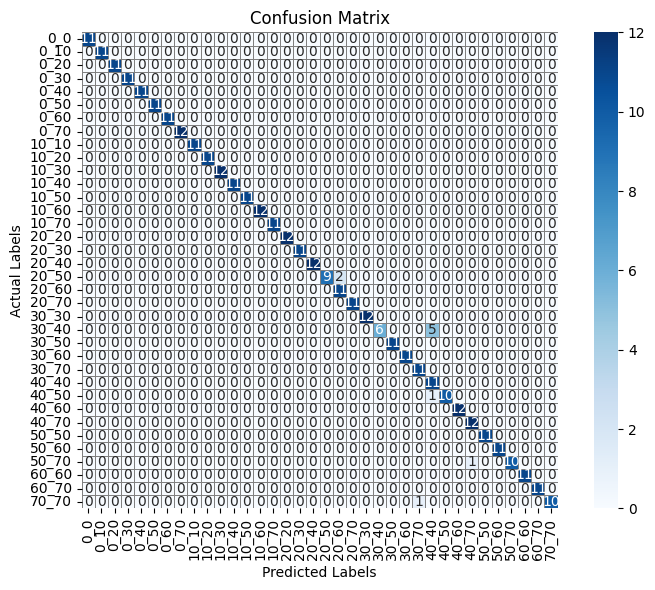

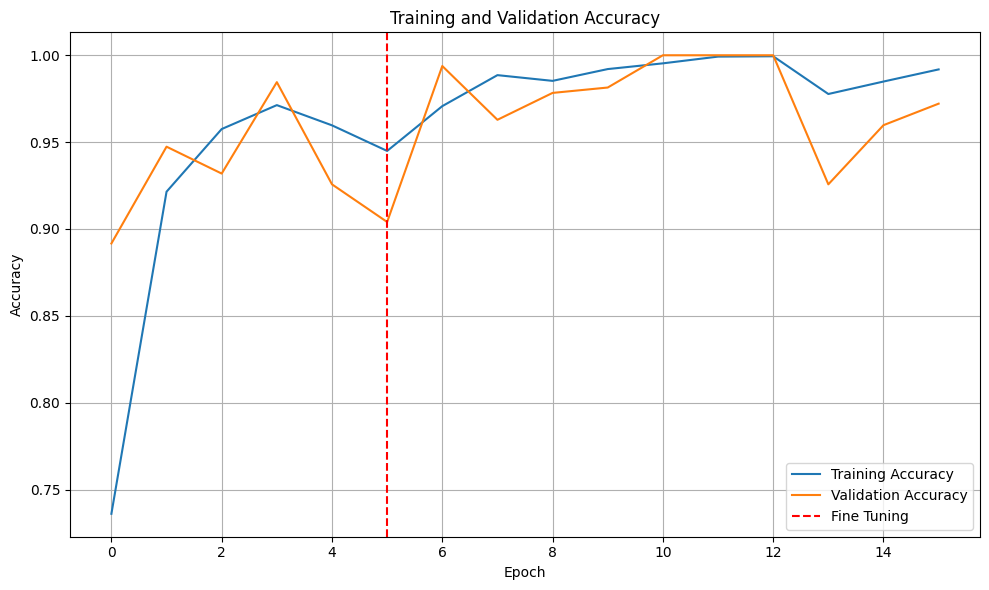

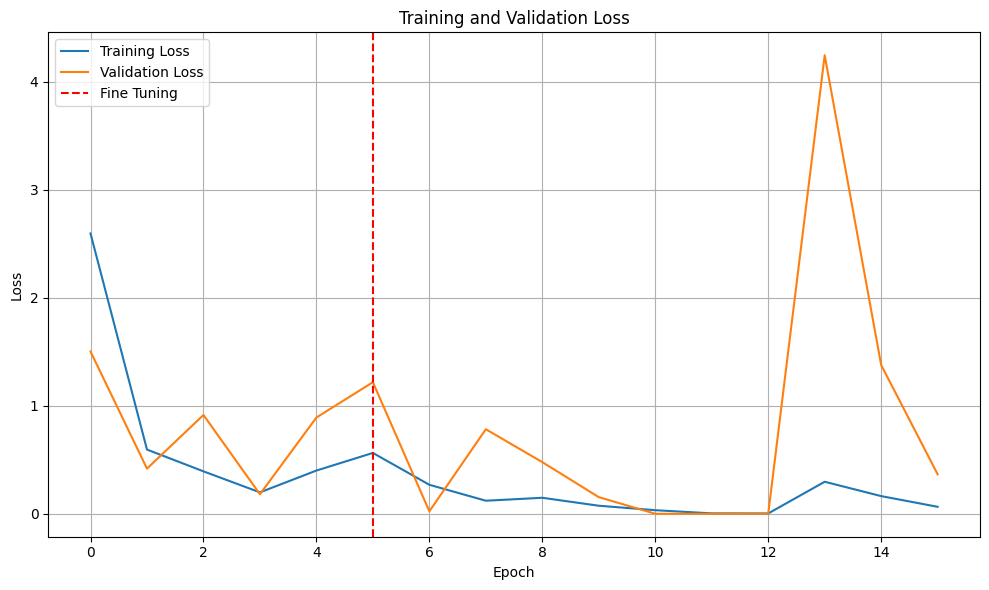

MODEL: resnet_last_a_lot
Epoch 1/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step - accuracy: 0.2374 - loss: 3.0476 - val_accuracy: 0.7276 - val_loss: 0.9472
Epoch 2/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.7297 - loss: 0.9807 - val_accuracy: 0.8978 - val_loss: 0.4374
Epoch 3/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.8528 - loss: 0.5746 - val_accuracy: 0.9412 - val_loss: 0.2649
Epoch 4/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.9148 - loss: 0.3757 - val_accuracy: 0.9443 - val_loss: 0.2166
Epoch 5/5
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.9401 - loss: 0.2881 - val_accuracy: 0.9659 - val_loss: 0.1722
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 46s 80ms/step - accuracy: 0.7762 - loss: 1.0338 - val_accuracy: 0.9938 - val_loss: 0.0225
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step - accuracy: 0.9928 - loss: 0.0298 - val_accuracy: 1.0000 - val_loss: 0.0027
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step - accuracy: 0.9978 -

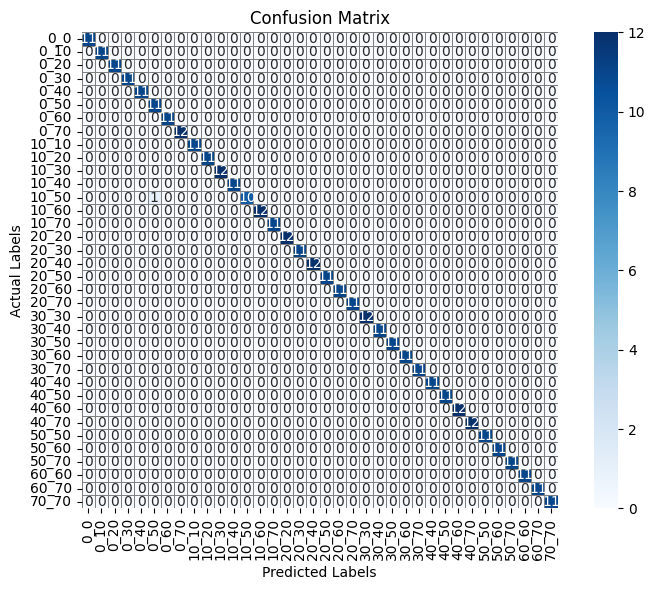

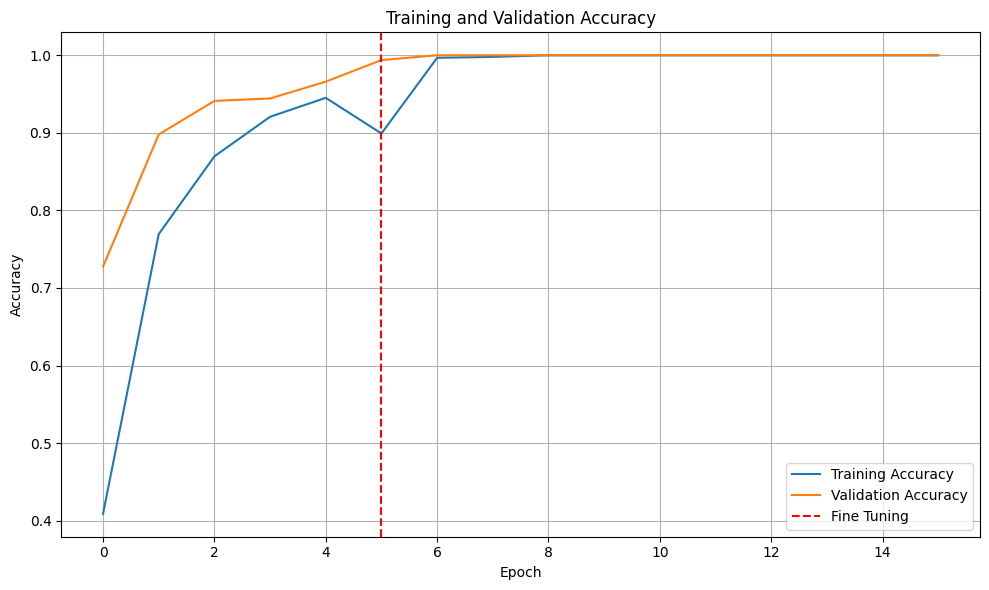

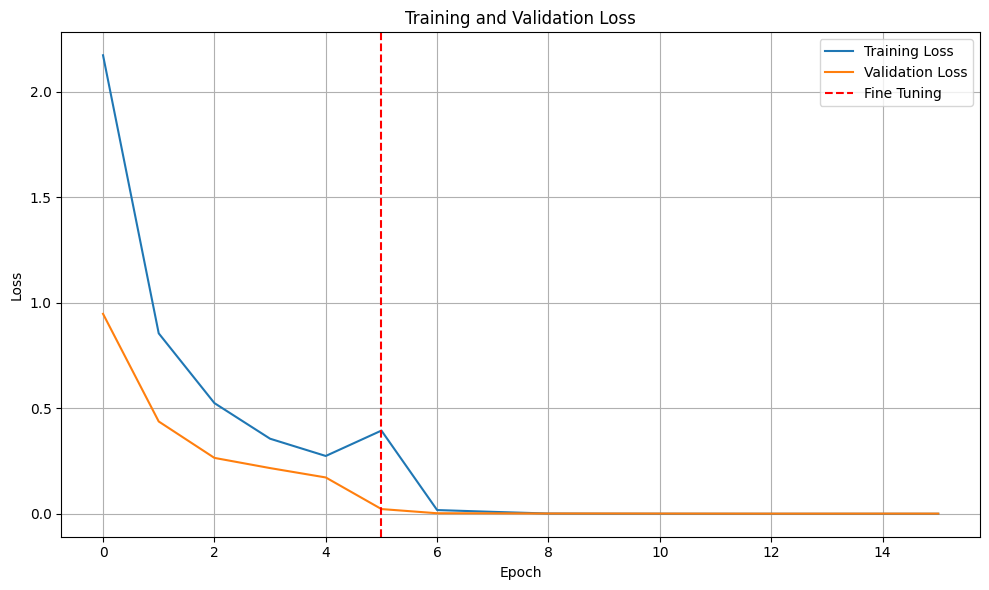

In [99]:
for model_type in ["resnet_last_10_flat", "resnet_last_10_pooling", 'resnet_last_32_pooling', 'resnet_last_32_flat', 'resnet_last_a_lot']:
  num_layers, layer, d_rate, optimizer, epochs, tune_epochs =  get_model_configs(model_type)
  print(f"MODEL: {model_type}")

  model_history = {model_type: []}

  resnet = ResNet50(
      weights="imagenet",
      include_top=False,
      input_shape=(128, 128, 3)
  )

  resnet.trainable = False

  model = models.Sequential([
      Input(shape=(256, 256, 3)),
      Resizing(128, 128),
      resnet,
      layer,
      layers.Dropout(d_rate),
      layers.Dense(36,  activation='softmax')
  ])

  model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

  history = model.fit(train, validation_data=val, epochs=epochs)
  model_history[model_type].append(history.history)

  if model_type == 'resnet_last_a_lot':
    for layer in resnet.layers:
      if layer.name.startswith("conv5") or layer.name.startswith("conv4_block4"):
        layer.trainable = True
  else:
    for layer in resnet.layers[-num_layers:]:
      layer.trainable = True

  model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


  history = model.fit(train, validation_data=val,
                      epochs=epochs + tune_epochs,
                      initial_epoch=history.epoch[-1],)
  model_history[model_type].append(history.history)

  acc, precision, recall, f1 = evaluate_model(model, labels, X_test, y_test, path=f"{RESNET_FOLDER}{model_type}-cm-ep{epochs + tune_epochs}")
  resnet_data = store_results(resnet_data, model_type, {"epochs": epochs + tune_epochs, "acc": acc, "precision": precision, "recall": recall, "f1": f1})
  plot_training_and_tuning_metrics(model_history, RESNET_FOLDER, epochs, models=[model_type], save=True)

In [100]:
df = pd.DataFrame(resnet_data)
df.to_csv(f"{RESNET_FOLDER}resnet_results.csv", index=False)
df.head()

,epochs,acc,precision,recall,f1,time,model
0,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 05:53:10,resnet_last_10_flat
1,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 05:56:17,resnet_last_10_pooling
2,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 06:00:14,resnet_last_32_pooling
3,15,0.975248,0.981648,0.975248,0.974904,2024-12-22 06:04:16,resnet_last_32_flat
4,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 06:08:29,resnet_last_a_lot


In [ ]:
last = 0
for layer in model.layers[-3:]:
  last = layer.count_params()

params_data = []

for model_type in ["resnet_last_10_flat", "resnet_last_10_pooling", 'resnet_last_32_pooling', 'resnet_last_32_flat', 'resnet_last_a_lot']:
  params = last
  num_layers, _, _, _, _, _ =  get_model_configs(model_type)
  if num_layers is None:
      for layer in resnet.layers:
        if layer.name.startswith("conv5") or layer.name.startswith("conv4_block4"):
          params += layer.count_params()
  else:
    for layer in  resnet.layers[-num_layers:]:
        params += layer.count_params()
  params_data.append({"model": model_type, "params": params})
  params_df = pd.DataFrame(params_data)
df = pd.merge(pd.read_csv(f"{RESNET_FOLDER}resnet_results.csv"), params_df[["model", "params"]], on='model', how='left')
df.to_csv(f"{RESNET_FOLDER}resnet_results.csv", index=False)
df.head()

# **Inception V3**
---

Preprocess data and visuakize transformation

In [142]:
train = aug_train_dataset.map(lambda x, y: (preprocess_input_inception(tf.cast(x, tf.float32)), y))
val = val_dataset.map(lambda x, y: (preprocess_input_inception(tf.cast(x, tf.float32)), y))
test = test_dataset.map(lambda x, y: (preprocess_input_inception(tf.cast(x, tf.float32)), y))

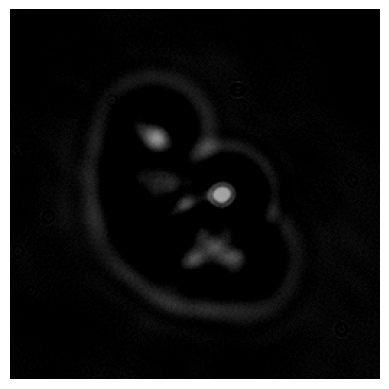

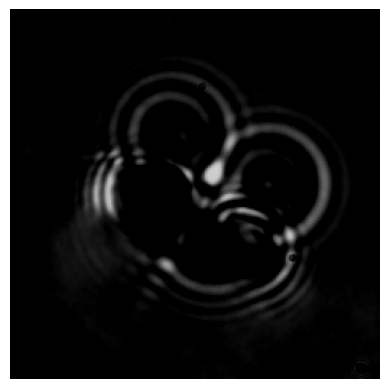

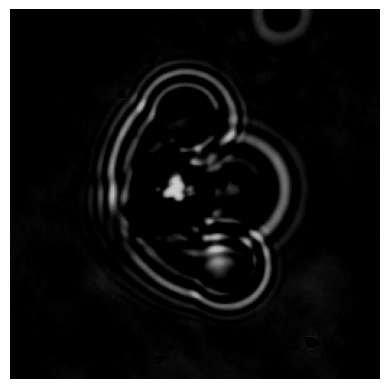

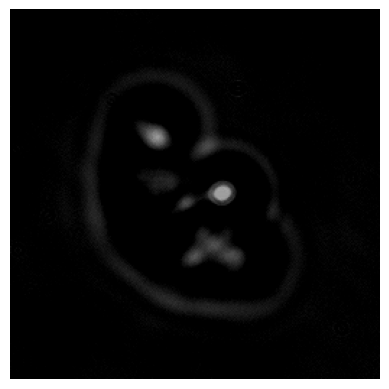

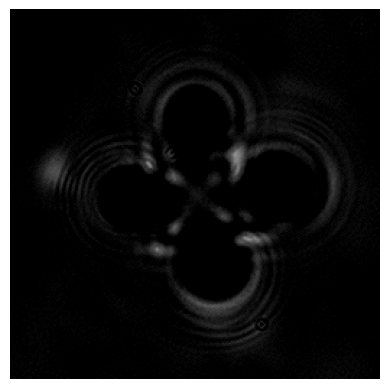

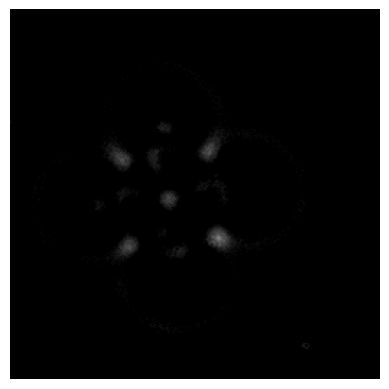

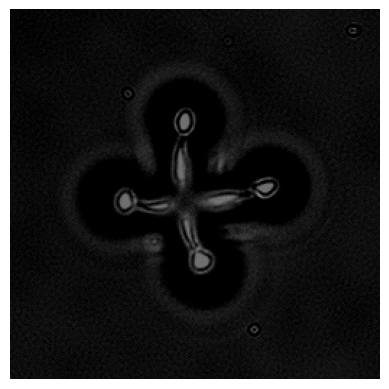

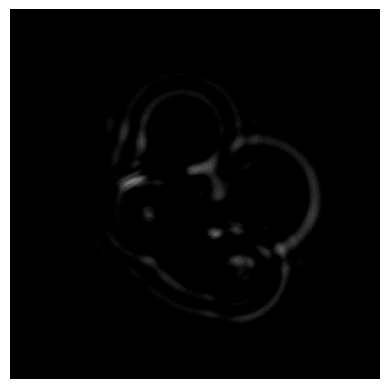

In [143]:
for image, targets in train.take(8):
    plt.imshow(image)
    plt.axis("off")
    plt.show()

In [144]:
BATCH_SIZE = 16
train = train.batch(BATCH_SIZE)
val = val.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)

X_test = []
y_test = []
for imgs, targets in test.as_numpy_iterator():
    X_test.append(imgs)
    y_test.append(targets)

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

### Inspect Arhitecture

In [145]:
inception = tf.keras.applications.InceptionV3(
    include_top=False,
    weights='imagenet',
    input_shape=None,
)

inception.summary()

num_layers_9 = 0
for layer in reversed(inception.layers):
    num_layers_9 += 1
    if layer.name == "mixed9":
      break

num_layers_8 = 0
for layer in reversed(inception.layers):
    num_layers_8 += 1
    if layer.name == "mixed8":
      break

Define results path

In [14]:
inception_data = []
INCEPTION_FOLDER = f"{FOLDER}/results/inceptionv3_model/"
os.makedirs(INCEPTION_FOLDER, exist_ok=True)

### Train & Fine Tune InceptionV3

In [175]:
def get_inception_model_configs(name):
  if name == "inception_mixed9" or name == "inception_mixed9_aug_tune":
    return (num_layers_9,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 10, 5)
  elif name == "inception_mixed8" or name == "inception_mixed8_aug_tune":
    return (num_layers_8,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 10, 5)
  elif name == "inception_mixed8_ep" or name == "inception_mixed8_aug_tune_ep":
    return (num_layers_8,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  elif name == "inception_mixed9_ep" or name == "inception_mixed9_aug_tune_ep":
    return (num_layers_9,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  else:
    raise Exception("Model does not exist")

In [172]:
INCEPTION_CONFIGS = ["inception_mixed9", "inception_mixed8", "inception_mixed9_aug_tune", "inception_mixed8_aug_tune", "inception_mixed9_ep", "inception_mixed8_ep", "inception_mixed9_aug_tune_ep", "inception_mixed8_aug_tune_ep"]

MODEL: inception_mixed9
Epoch 1/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 31s 57ms/step - accuracy: 0.2543 - loss: 3.5350 - val_accuracy: 0.7337 - val_loss: 0.7349
Epoch 2/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.7178 - loss: 0.9155 - val_accuracy: 0.8700 - val_loss: 0.4378
Epoch 3/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.8254 - loss: 0.5336 - val_accuracy: 0.8885 - val_loss: 0.3609
Epoch 4/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.8755 - loss: 0.3772 - val_accuracy: 0.9226 - val_loss: 0.2543
Epoch 5/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.8989 - loss: 0.3000 - val_accuracy: 0.9195 - val_loss: 0.2604
Epoch 6/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9300 - loss: 0.2129 - val_accuracy: 0.9474 - val_loss: 0.1416
Epoch 7/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9405 - loss: 0.1863 - val_accuracy: 0.9443 - val_loss: 0.2043
Epoch 8/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9468 

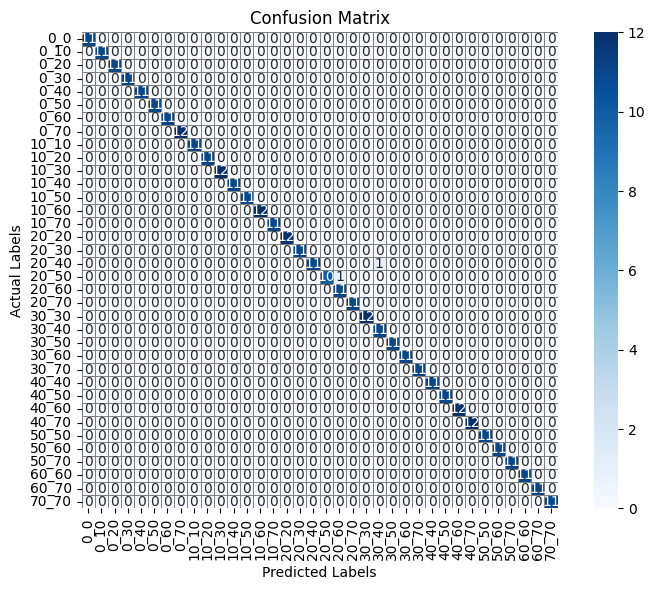

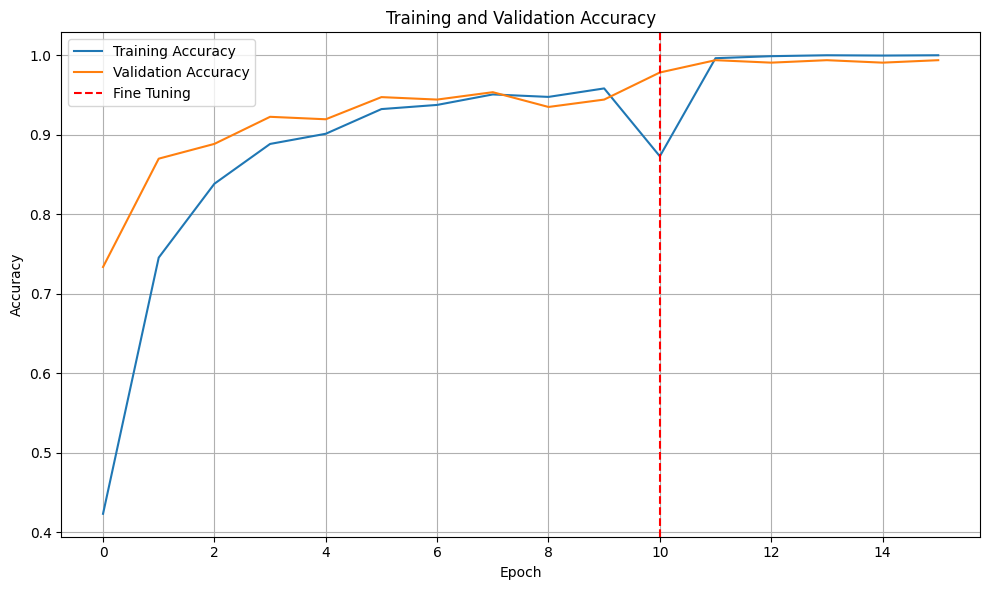

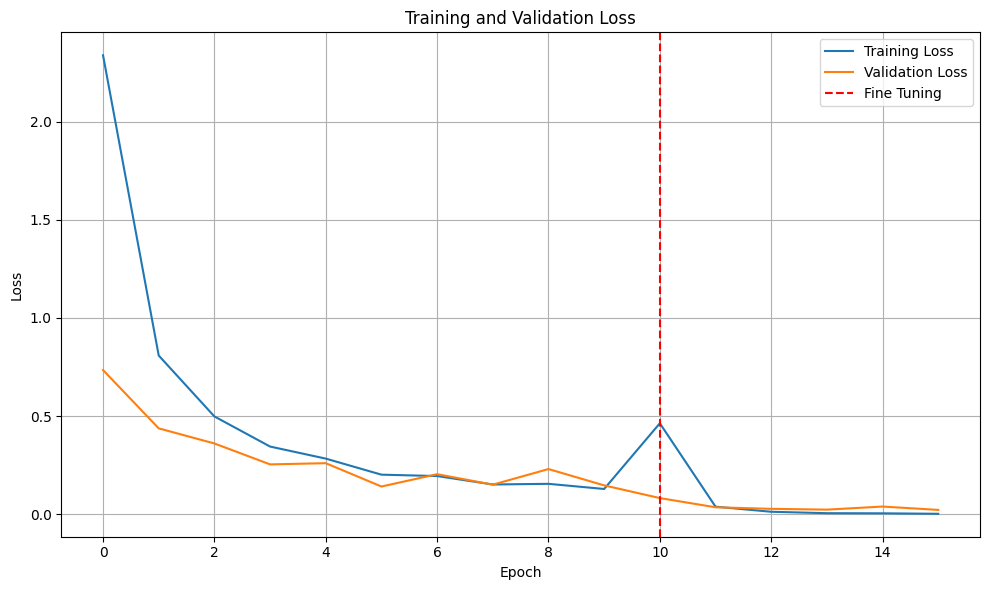

MODEL: inception_mixed8
Epoch 1/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step - accuracy: 0.2574 - loss: 3.5483 - val_accuracy: 0.7492 - val_loss: 0.8140
Epoch 2/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.7197 - loss: 0.8906 - val_accuracy: 0.8514 - val_loss: 0.4258
Epoch 3/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.8281 - loss: 0.5147 - val_accuracy: 0.9164 - val_loss: 0.2993
Epoch 4/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.8869 - loss: 0.3262 - val_accuracy: 0.9412 - val_loss: 0.2085
Epoch 5/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9107 - loss: 0.2801 - val_accuracy: 0.9195 - val_loss: 0.2687
Epoch 6/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9339 - loss: 0.2024 - val_accuracy: 0.9443 - val_loss: 0.1982
Epoch 7/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9425 - loss: 0.1819 - val_accuracy: 0.9690 - val_loss: 0.1230
Epoch 8/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9409 

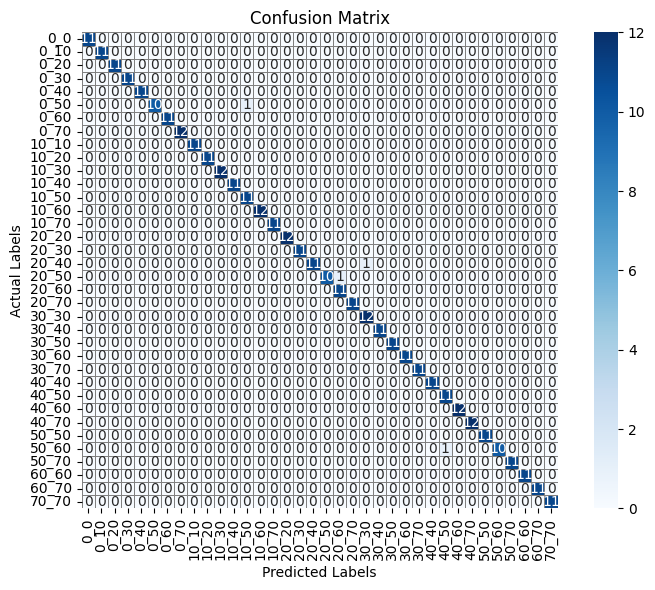

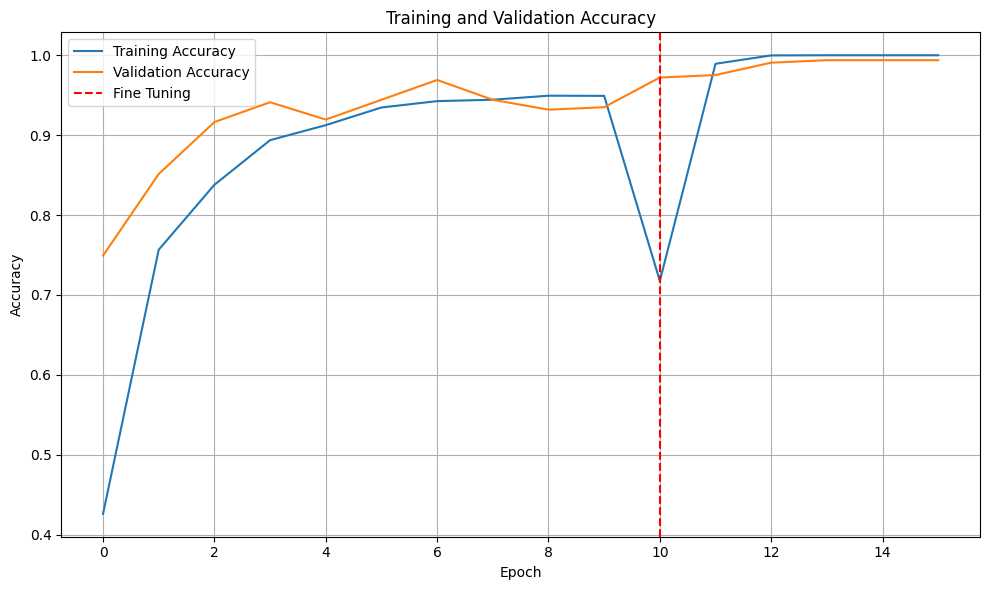

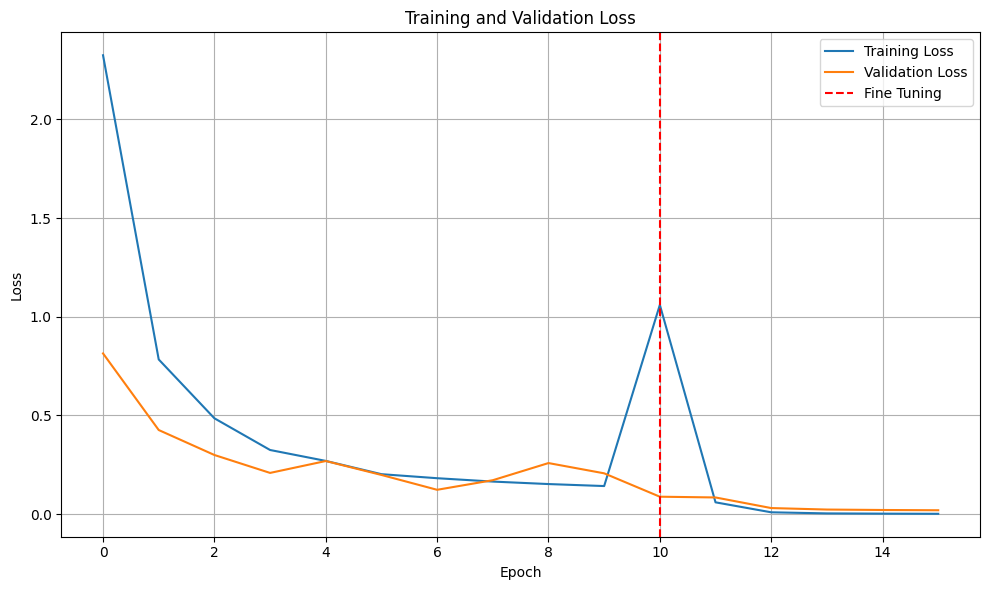

MODEL: inception_mixed9_aug_tune
Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 28s 179ms/step - accuracy: 0.1401 - loss: 4.9087 - val_accuracy: 0.4613 - val_loss: 1.8629
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.5626 - loss: 1.5746 - val_accuracy: 0.6378 - val_loss: 1.0040
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7306 - loss: 0.8401 - val_accuracy: 0.7585 - val_loss: 0.7420
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8146 - loss: 0.5418 - val_accuracy: 0.8235 - val_loss: 0.5706
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8798 - loss: 0.3499 - val_accuracy: 0.8235 - val_loss: 0.5627
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9283 - loss: 0.2470 - val_accuracy: 0.8824 - val_loss: 0.4357
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9527 - loss: 0.1778 - val_accuracy: 0.8700 - val_loss: 0.3945
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9526 - loss

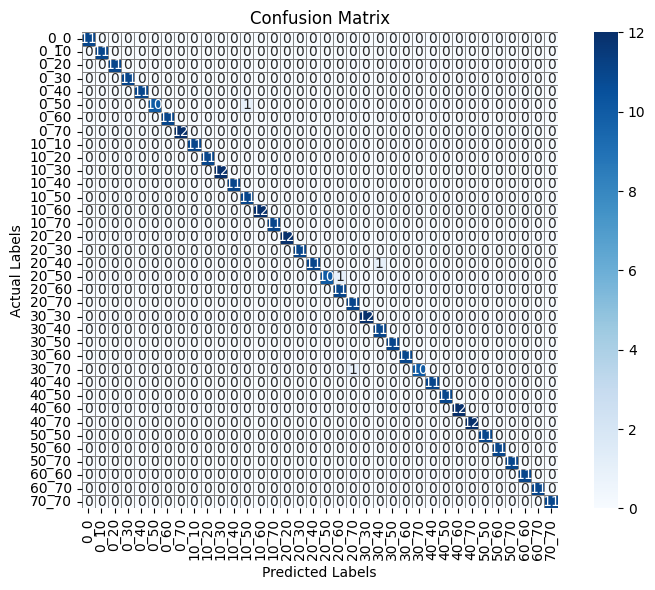

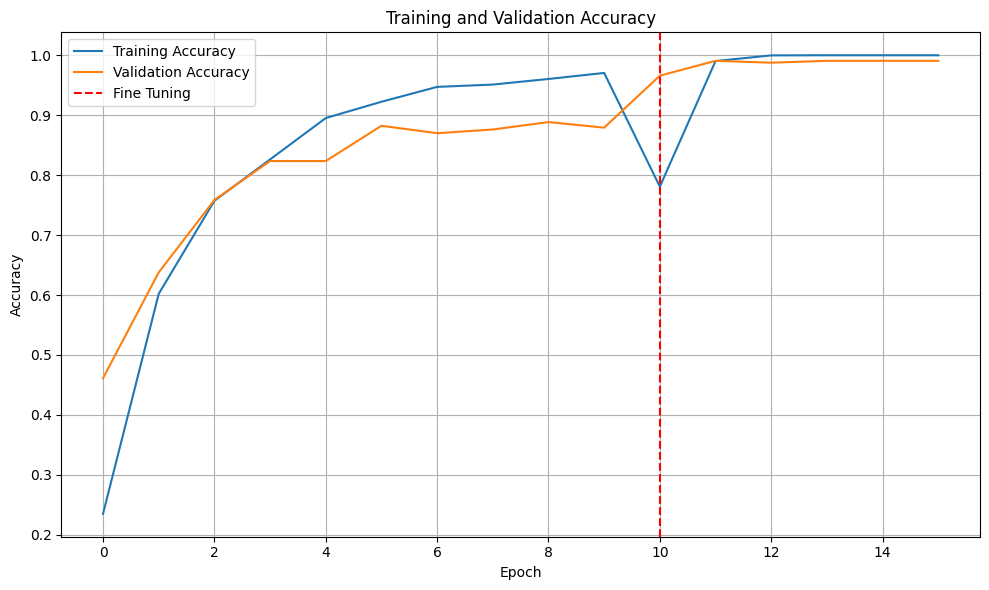

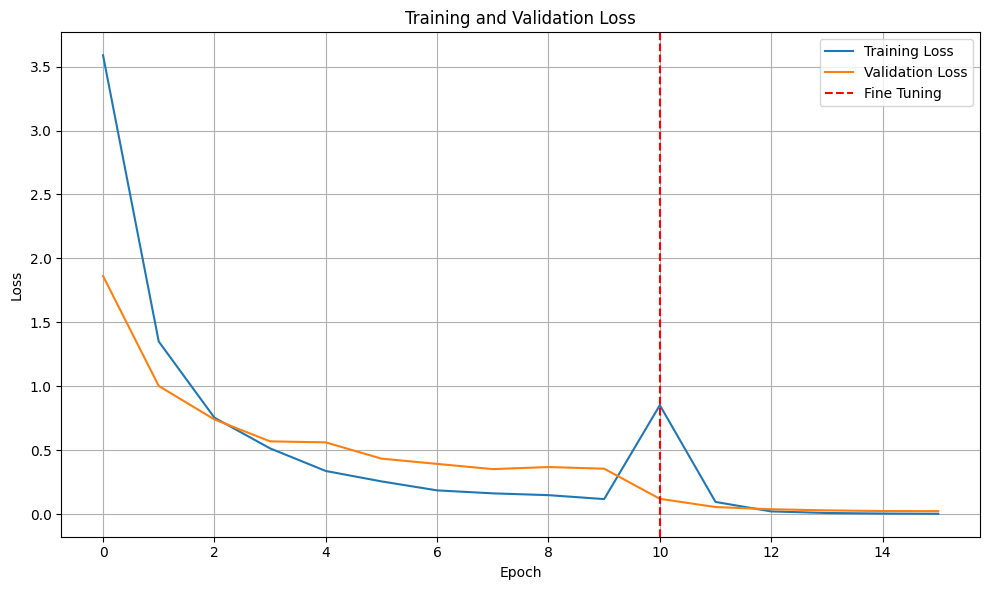

MODEL: inception_mixed8_aug_tune
Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 25s 179ms/step - accuracy: 0.1323 - loss: 5.0882 - val_accuracy: 0.4365 - val_loss: 1.8633
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5740 - loss: 1.4809 - val_accuracy: 0.6285 - val_loss: 1.0741
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.7440 - loss: 0.8316 - val_accuracy: 0.7399 - val_loss: 0.7835
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8327 - loss: 0.5192 - val_accuracy: 0.7492 - val_loss: 0.7418
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8867 - loss: 0.3398 - val_accuracy: 0.8328 - val_loss: 0.6178
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9378 - loss: 0.2258 - val_accuracy: 0.8390 - val_loss: 0.5000
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9352 - loss: 0.2227 - val_accuracy: 0.8669 - val_loss: 0.4512
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9508 - loss

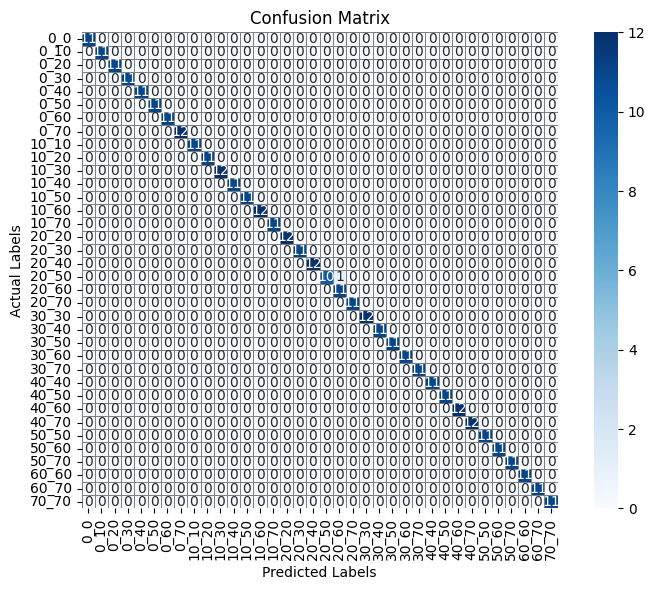

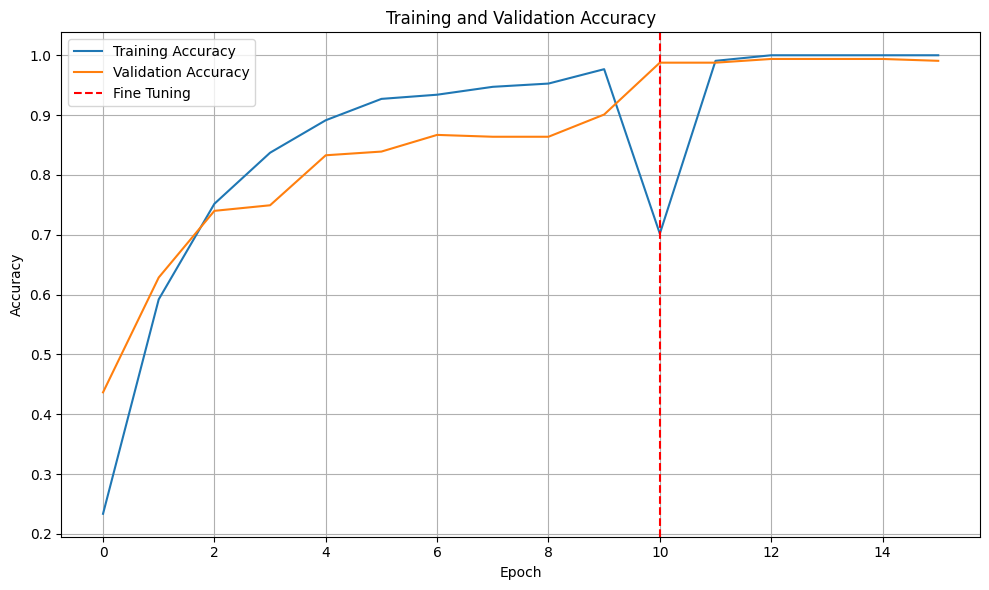

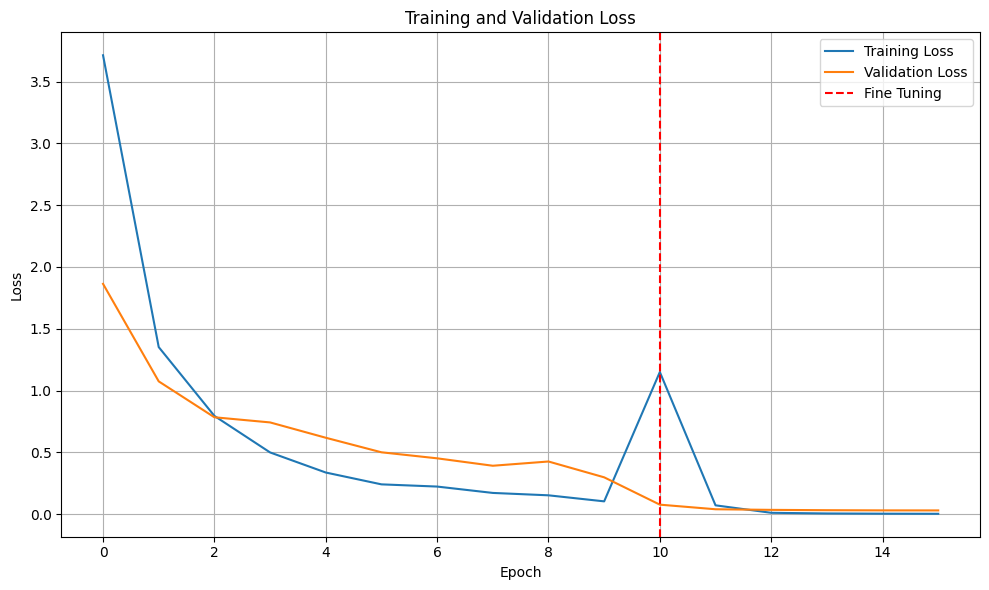

MODEL: inception_mixed9_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 24s 181ms/step - accuracy: 0.1467 - loss: 4.6253 - val_accuracy: 0.4427 - val_loss: 2.0880
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5809 - loss: 1.5452 - val_accuracy: 0.6161 - val_loss: 1.1875
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7354 - loss: 0.8217 - val_accuracy: 0.7337 - val_loss: 0.7874
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8160 - loss: 0.5640 - val_accuracy: 0.7771 - val_loss: 0.6805
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8831 - loss: 0.3567 - val_accuracy: 0.8111 - val_loss: 0.5474
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6395 - loss: 1.3929 - val_accuracy: 0.9721 - val_loss: 0.1521
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.9830 - loss: 0.1431 - val_accuracy: 0.9876 - val_loss: 0.0630
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 1.0000 - loss: 0.

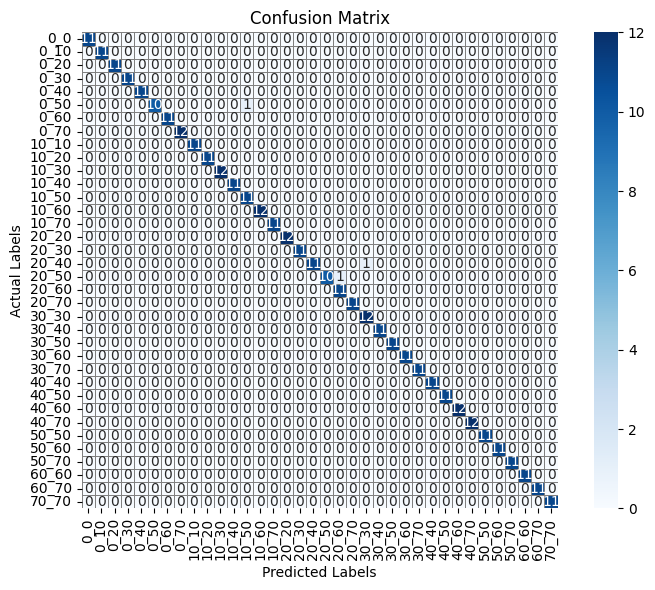

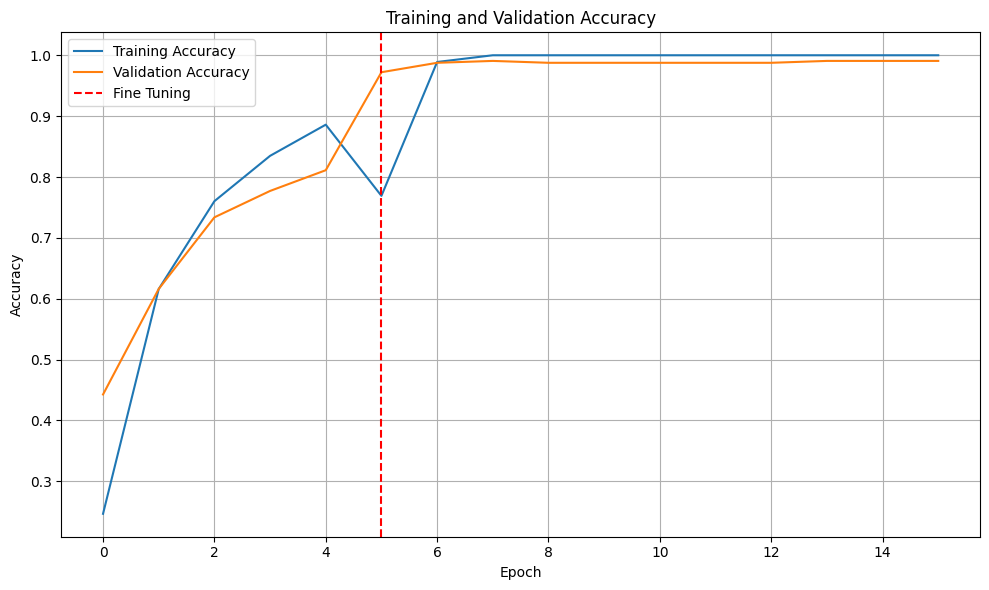

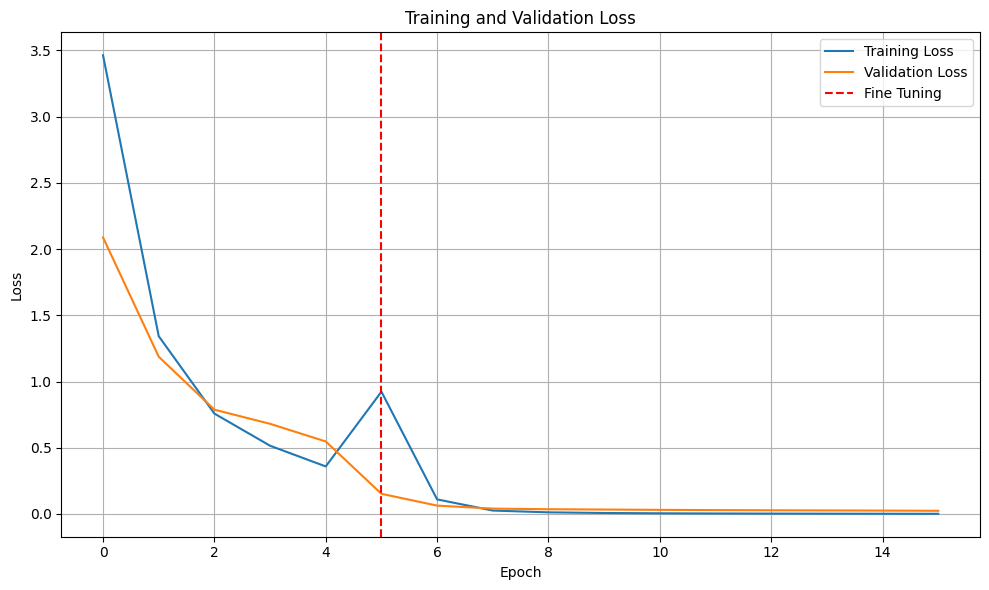

MODEL: inception_mixed8_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 24s 179ms/step - accuracy: 0.1256 - loss: 4.8868 - val_accuracy: 0.4272 - val_loss: 2.0554
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5594 - loss: 1.5881 - val_accuracy: 0.6285 - val_loss: 1.1928
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7348 - loss: 0.8514 - val_accuracy: 0.7709 - val_loss: 0.7316
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8381 - loss: 0.4963 - val_accuracy: 0.8421 - val_loss: 0.5785
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8933 - loss: 0.3189 - val_accuracy: 0.8514 - val_loss: 0.4714
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.4984 - loss: 1.9422 - val_accuracy: 0.9752 - val_loss: 0.0872
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.9832 - loss: 0.1203 - val_accuracy: 0.9876 - val_loss: 0.0340
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.9999 - loss: 0.

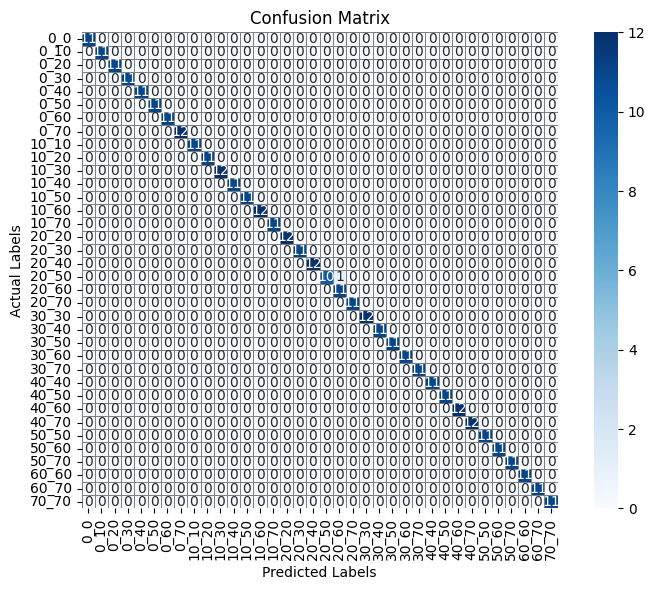

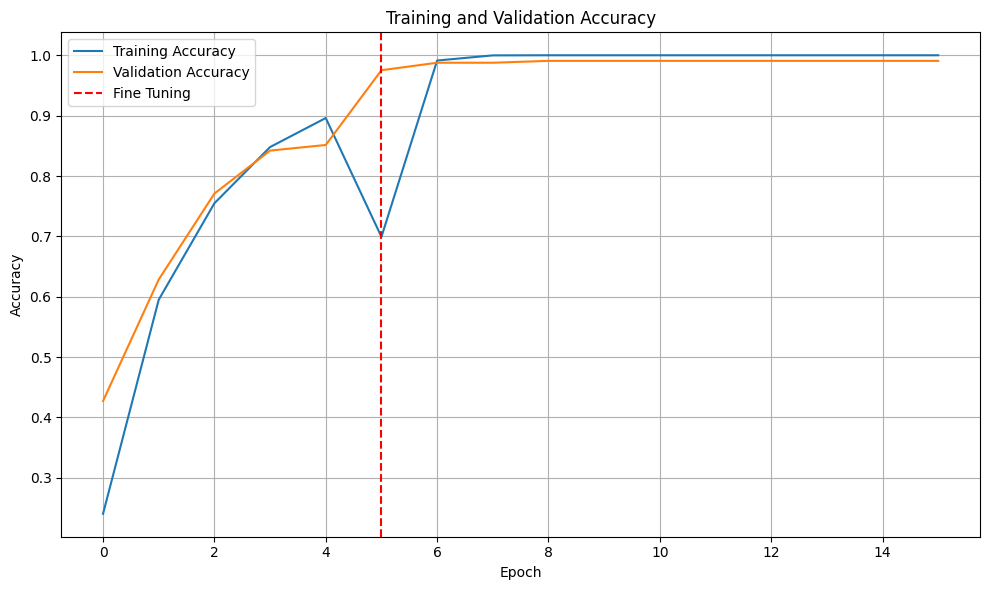

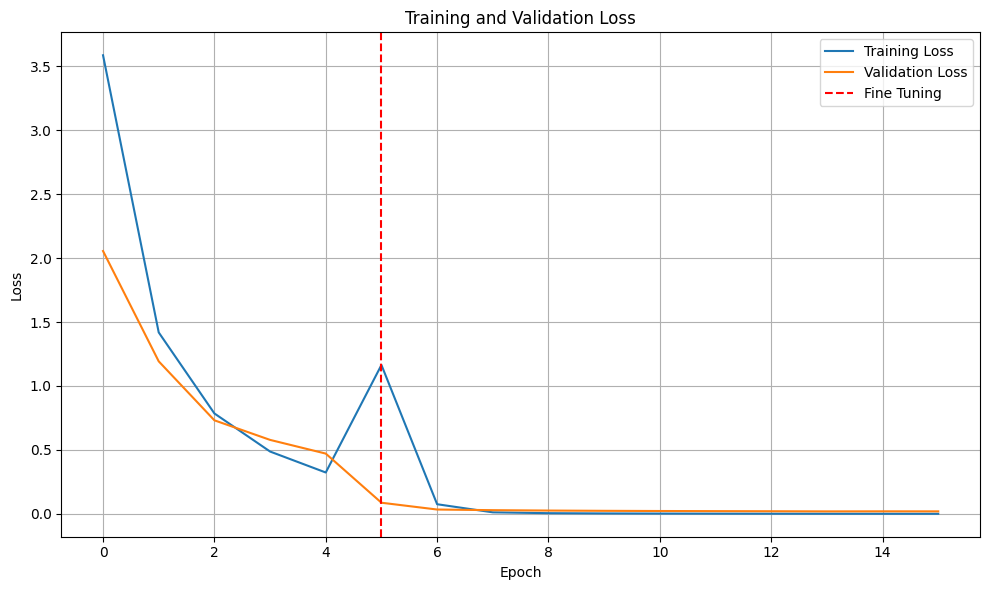

MODEL: inception_mixed9_aug_tune_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 25s 179ms/step - accuracy: 0.1173 - loss: 5.0119 - val_accuracy: 0.4489 - val_loss: 1.9503
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5476 - loss: 1.5686 - val_accuracy: 0.6502 - val_loss: 1.1495
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7345 - loss: 0.8148 - val_accuracy: 0.7399 - val_loss: 0.7824
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8349 - loss: 0.4866 - val_accuracy: 0.7864 - val_loss: 0.5964
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8883 - loss: 0.3384 - val_accuracy: 0.8019 - val_loss: 0.6632
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - accuracy: 0.6461 - loss: 1.3846 - val_accuracy: 0.9690 - val_loss: 0.1492
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.9848 - loss: 0.1418 - val_accuracy: 0.9814 - val_loss: 0.0674
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 1.0000 -

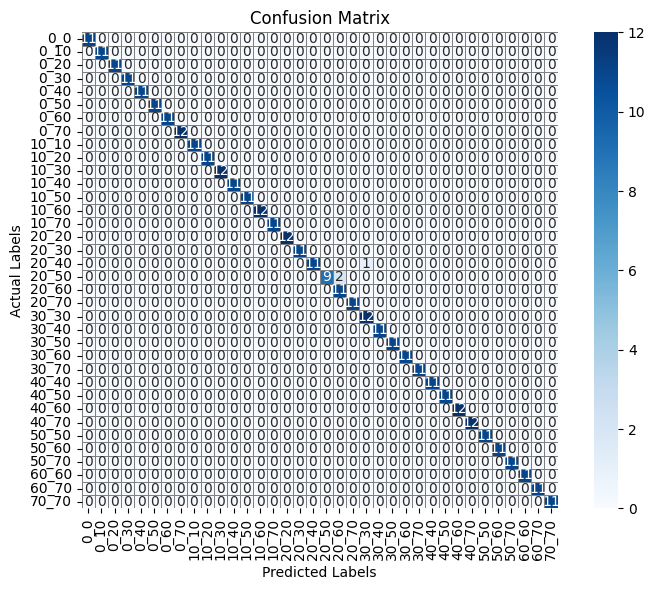

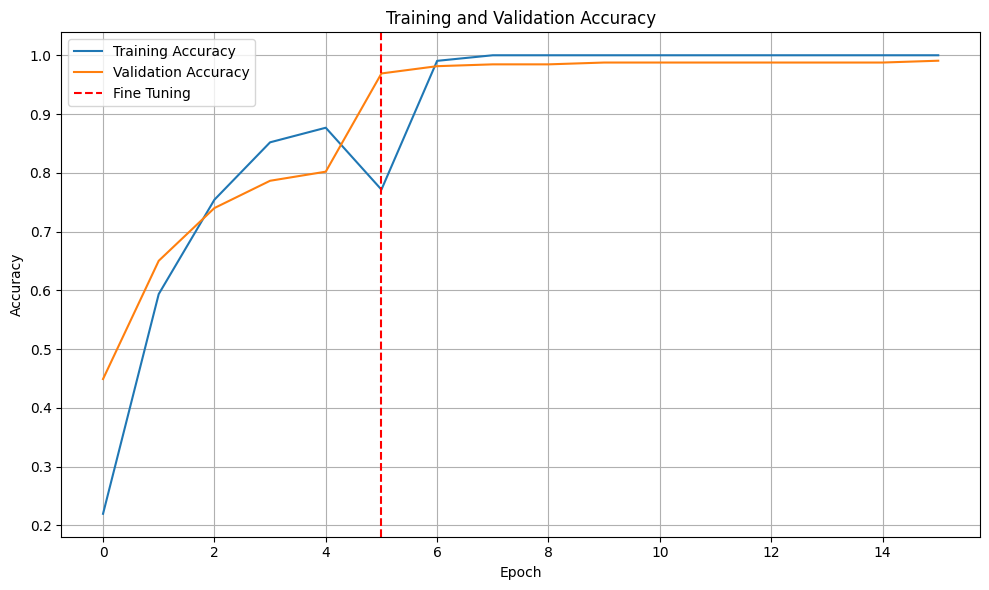

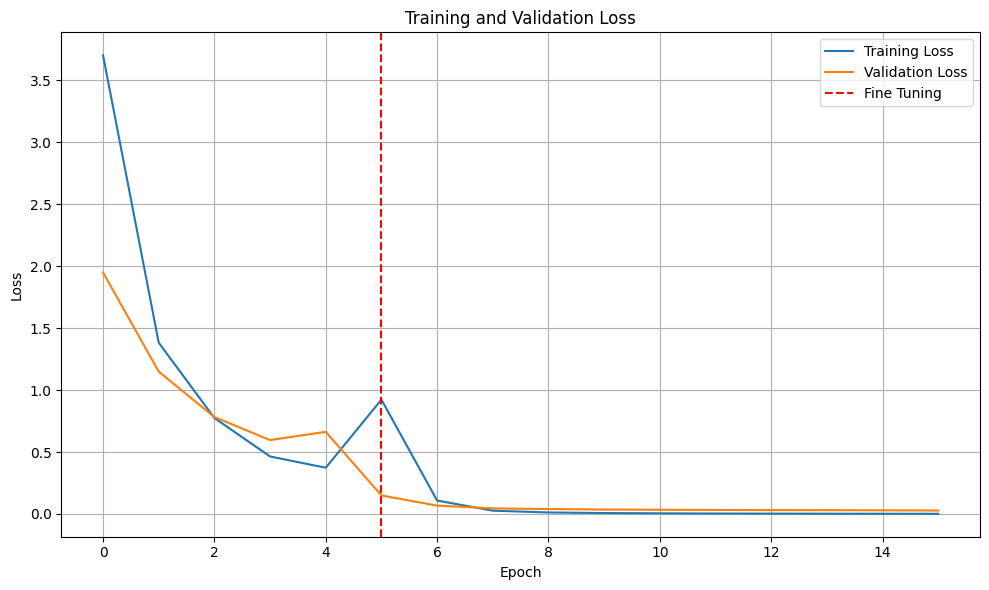

MODEL: inception_mixed8_aug_tune_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 26s 184ms/step - accuracy: 0.1328 - loss: 5.0663 - val_accuracy: 0.4427 - val_loss: 1.9084
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - accuracy: 0.5380 - loss: 1.5903 - val_accuracy: 0.6130 - val_loss: 1.0843
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.7402 - loss: 0.8557 - val_accuracy: 0.7833 - val_loss: 0.6975
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.8320 - loss: 0.5379 - val_accuracy: 0.8266 - val_loss: 0.5623
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.8777 - loss: 0.3586 - val_accuracy: 0.8359 - val_loss: 0.4788
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - accuracy: 0.4842 - loss: 1.9590 - val_accuracy: 0.9814 - val_loss: 0.0904
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.9850 - loss: 0.1259 - val_accuracy: 0.9876 - val_loss: 0.0412
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 1.0000 -

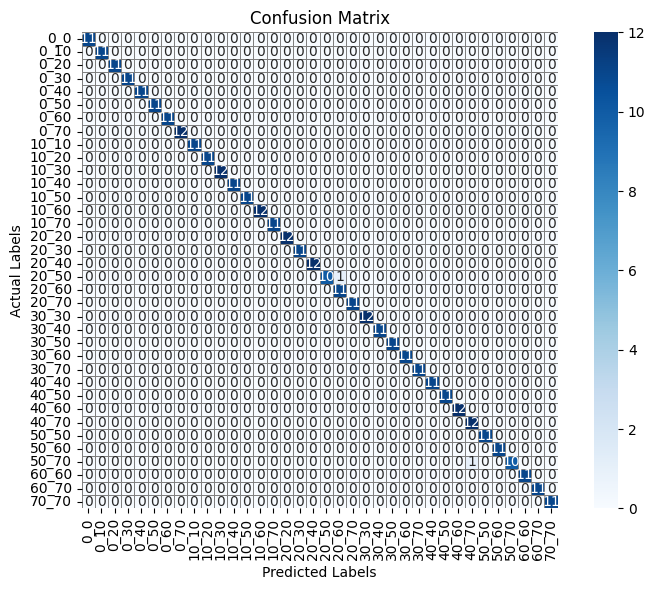

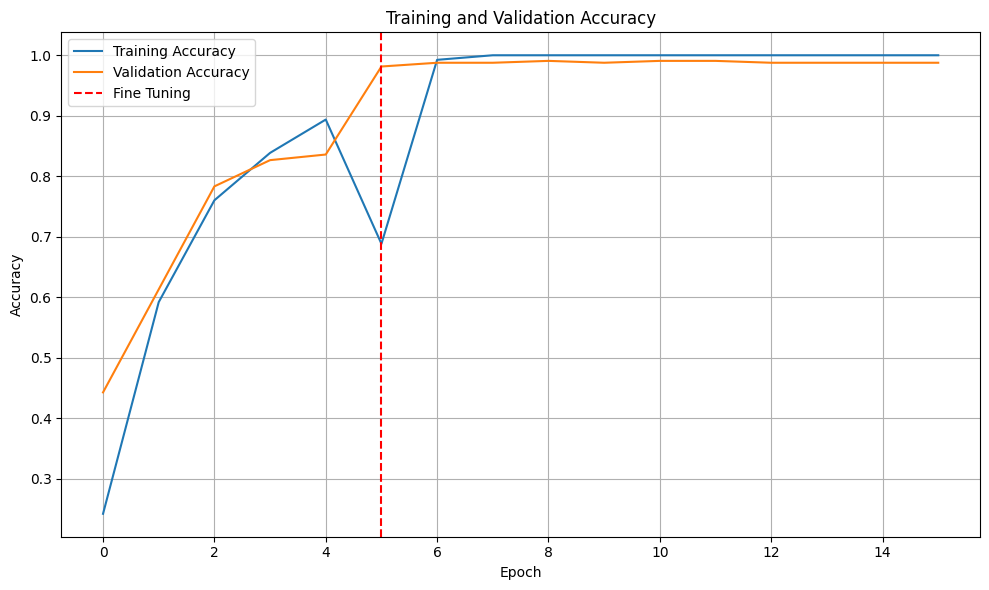

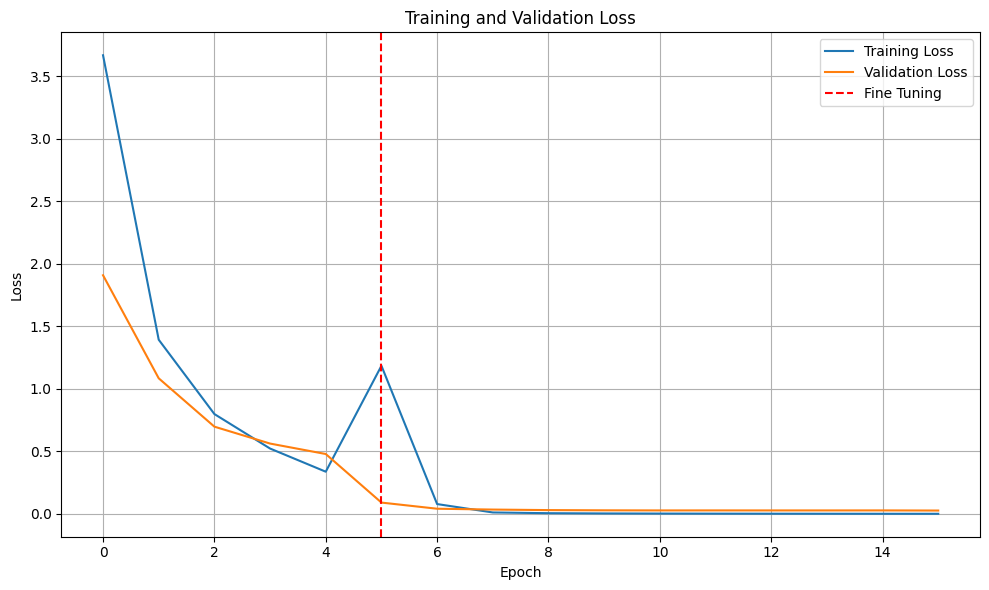

In [149]:
tune = train

for model_type in INCEPTION_CONFIGS:
  num_layers, layer, d_rate, optimizer, epochs, tune_epochs = get_inception_model_configs(model_type)
  print(f"MODEL: {model_type}")
  model_history = {model_type: []}

  # use aug data only for fine tuning
  if "aug_tune" in model_type:
    train = train_dataset.map(lambda x, y: (preprocess_input_inception(tf.cast(x, tf.float32)), y))
    train = train.batch(BATCH_SIZE)

  inception = tf.keras.applications.InceptionV3(
      weights="imagenet",
      include_top=False,
      input_shape=(128, 128, 3)
  )

  inception.trainable = False

  model = models.Sequential([
      Input(shape=(256, 256, 3)),
      Resizing(128, 128),
      inception,
      layer,
      layers.Dropout(d_rate),
      layers.Dense(36, activation='softmax')
  ])

  model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

  history = model.fit(train, validation_data=val, epochs=epochs, batch_size=BATCH_SIZE)
  model_history[model_type].append(history.history)

  for layer in inception.layers[-num_layers:]:
        layer.trainable = True

  model.compile(
      optimizer,
      loss='categorical_crossentropy', metrics=['accuracy'])

  history = model.fit(tune, validation_data=val, epochs=epochs + tune_epochs, initial_epoch=history.epoch[-1], batch_size=BATCH_SIZE)

  model_history[model_type].append(history.history)

  acc, precision, recall, f1 = evaluate_model(model, labels, X_test, y_test, path=f"{INCEPTION_FOLDER}{model_type}-cm-ep{epochs + tune_epochs}")
  inception_data = store_results(inception_data, model_type, {"epochs": epochs + tune_epochs, "acc": acc, "precision": precision, "recall": recall, "f1": f1})
  plot_training_and_tuning_metrics(model_history, INCEPTION_FOLDER, epochs, models=[model_type], save=True)

In [151]:
df = pd.DataFrame(inception_data)
df.to_csv(f"{INCEPTION_FOLDER}inception_results.csv", index=False)
df

,epochs,acc,precision,recall,f1,time,model
0,15,0.995050,0.995462,0.995050,0.995044,2024-12-22 09:58:43,inception_mixed9
1,15,0.990099,0.990908,0.990099,0.990079,2024-12-22 10:01:51,inception_mixed8
2,15,0.990099,0.990924,0.990099,0.990084,2024-12-22 10:04:10,inception_mixed9_aug_tune
3,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:06:41,inception_mixed8_aug_tune
4,15,0.992574,0.993177,0.992574,0.992560,2024-12-22 10:09:29,inception_mixed9_ep
5,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:12:34,inception_mixed8_ep
6,15,0.992574,0.993526,0.992574,0.992529,2024-12-22 10:15:21,inception_mixed9_aug_tune_ep
7,15,0.995050,0.995446,0.995050,0.995035,2024-12-22 10:18:31,inception_mixed8_aug_tune_ep


In [178]:
last = 0
for layer in model.layers[-3:]:
  last = layer.count_params()

params_data = []

for model_type in INCEPTION_CONFIGS:
  params = last
  num_layers, _, _, _, _, _ =  get_inception_model_configs(model_type)
  for layer in  resnet.layers[-num_layers:]:
      params += layer.count_params()
  params_data.append({"model": model_type, "params": params})

params_df = pd.DataFrame(params_data)
df = pd.merge(pd.read_csv(f"{INCEPTION_FOLDER}inception_results.csv"), params_df[["model", "params"]], on='model', how='left')
df.to_csv(f"{INCEPTION_FOLDER}inception_results.csv", index=False)
df

,epochs,acc,precision,recall,f1,time,model,params
0,15,0.995050,0.995462,0.995050,0.995044,2024-12-22 09:58:43,inception_mixed9,15072292
1,15,0.990099,0.990908,0.990099,0.990079,2024-12-22 10:01:51,inception_mixed8,18437668
2,15,0.990099,0.990924,0.990099,0.990084,2024-12-22 10:04:10,inception_mixed9_aug_tune,15072292
3,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:06:41,inception_mixed8_aug_tune,18437668
4,15,0.992574,0.993177,0.992574,0.992560,2024-12-22 10:09:29,inception_mixed9_ep,15072292
5,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:12:34,inception_mixed8_ep,18437668
6,15,0.992574,0.993526,0.992574,0.992529,2024-12-22 10:15:21,inception_mixed9_aug_tune_ep,15072292
7,15,0.995050,0.995446,0.995050,0.995035,2024-12-22 10:18:31,inception_mixed8_aug_tune_ep,18437668


# **InceptionResNetV2**
---

In [152]:
train = aug_train_dataset.map(lambda x, y: (preprocess_input_inception_resnet(tf.cast(x, tf.float32)), y))
val = val_dataset.map(lambda x, y: (preprocess_input_inception_resnet(tf.cast(x, tf.float32)), y))
test = test_dataset.map(lambda x, y: (preprocess_input_inception_resnet(tf.cast(x, tf.float32)), y))

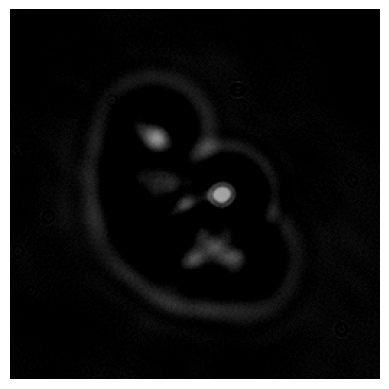

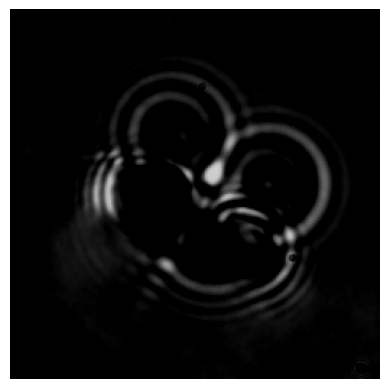

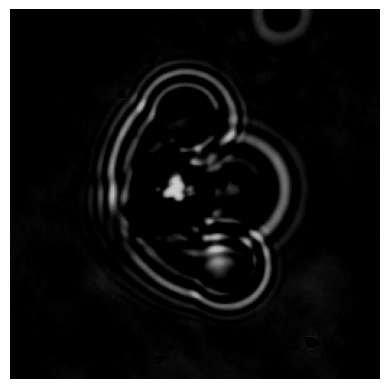

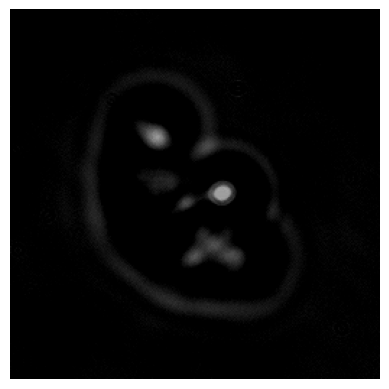

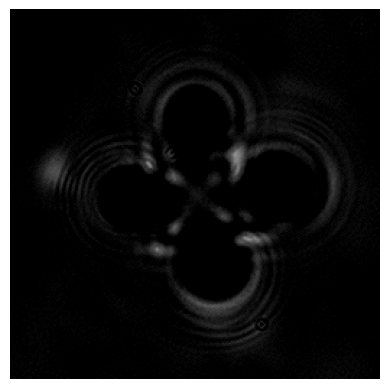

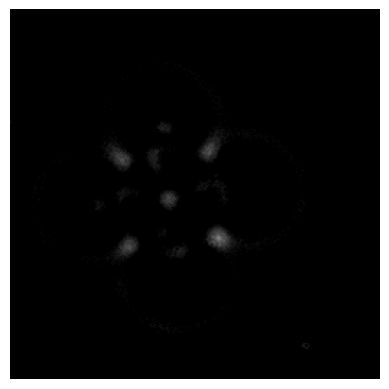

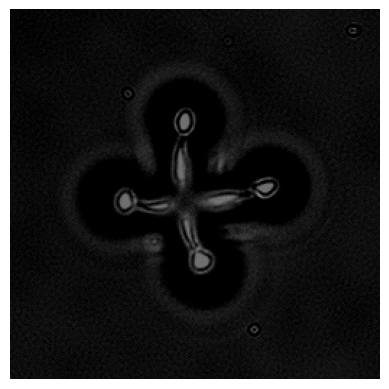

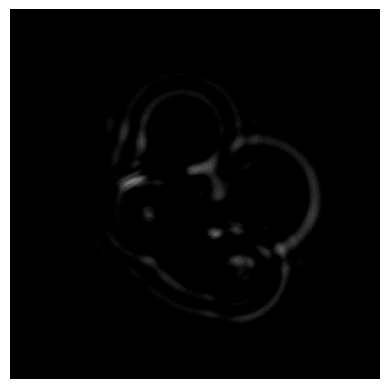

In [153]:
for image, targets in train.take(8):
    plt.imshow(image)
    plt.axis("off")
    plt.show()

In [154]:
BATCH_SIZE = 16
train = train.batch(BATCH_SIZE)
val = val.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)

X_test = []
y_test = []
for imgs, targets in test.as_numpy_iterator():
    X_test.append(imgs)
    y_test.append(targets)

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

### Inspect InceptionResNetV2 Arhitecture

In [155]:
inception =  tf.keras.applications.InceptionResNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(256, 256, 3)
)

inception.summary()

Define resuls path

In [16]:
inception_resnet_data = []
INCEPTION_RESNET_FOLDER = f"{FOLDER}/results/inception_resnet_model/"
os.makedirs(INCEPTION_RESNET_FOLDER, exist_ok=True)

### Train & Fine Tune InceptionResNetV2

In [182]:
def get_inception_resnet_model_configs(name):
  if name == "inception_resnet_54" or name == "inception_resnet_54_aug_tune":
    return (54,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 10, 5)
  elif name == "inception_resnet_20" or name == "inception_resnet_20_aug_tune":
    return (20,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 10, 5)
  elif name == "inception_resnet_54_ep" or name == "inception_resnet_54_aug_tune_ep":
    return (54,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  elif name == "inception_resnet_20_ep" or name == "inception_resnet_20_aug_tune_ep":
    return (20,  layers.GlobalAveragePooling2D(), 0.2, tf.keras.optimizers.Adam(1e-4), 5, 10)
  else:
    raise Exception("Model does not exist")

In [183]:
INCEPTION_RESNET_CONFIGS = ["inception_resnet_20", "inception_resnet_54", "inception_resnet_20_aug_tune", "inception_resnet_54_aug_tune", "inception_resnet_20_ep", "inception_resnet_54_ep", "inception_resnet_20_aug_tune_ep", "inception_resnet_54_aug_tune_ep"]

MODEL: inception_resnet_20
Epoch 1/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 31s 58ms/step - accuracy: 0.2470 - loss: 3.5580 - val_accuracy: 0.7523 - val_loss: 0.7704
Epoch 2/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.7178 - loss: 0.9394 - val_accuracy: 0.8824 - val_loss: 0.4111
Epoch 3/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.8395 - loss: 0.4898 - val_accuracy: 0.8545 - val_loss: 0.3596
Epoch 4/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.8687 - loss: 0.3883 - val_accuracy: 0.9350 - val_loss: 0.2393
Epoch 5/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9075 - loss: 0.2722 - val_accuracy: 0.8854 - val_loss: 0.3187
Epoch 6/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9258 - loss: 0.2217 - val_accuracy: 0.8978 - val_loss: 0.2980
Epoch 7/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - accuracy: 0.9305 - loss: 0.2100 - val_accuracy: 0.9133 - val_loss: 0.3038
Epoch 8/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.93

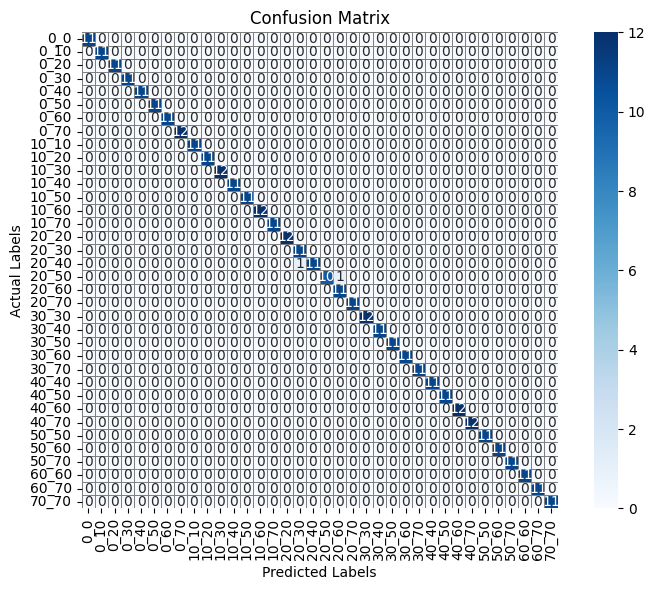

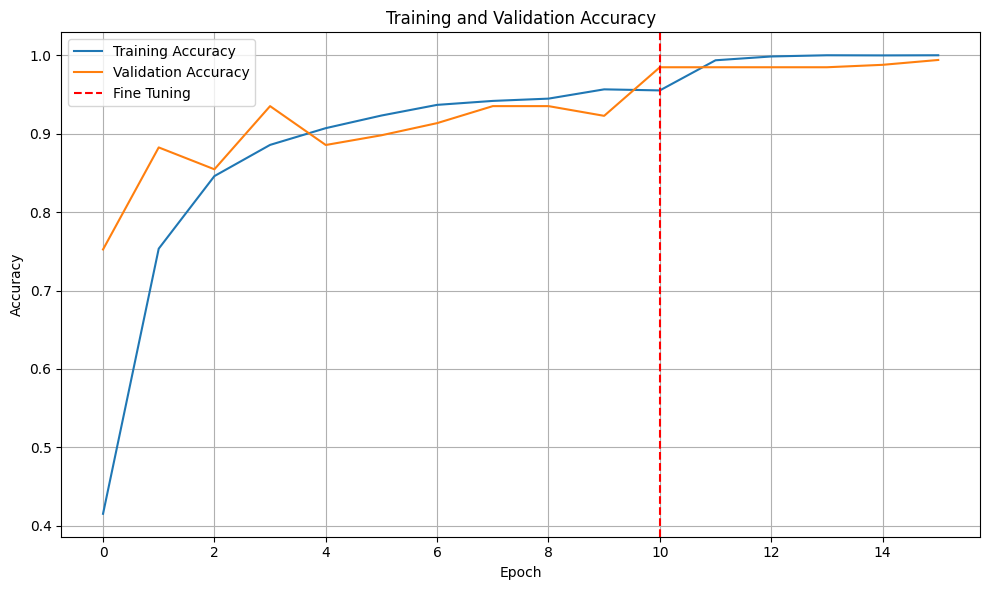

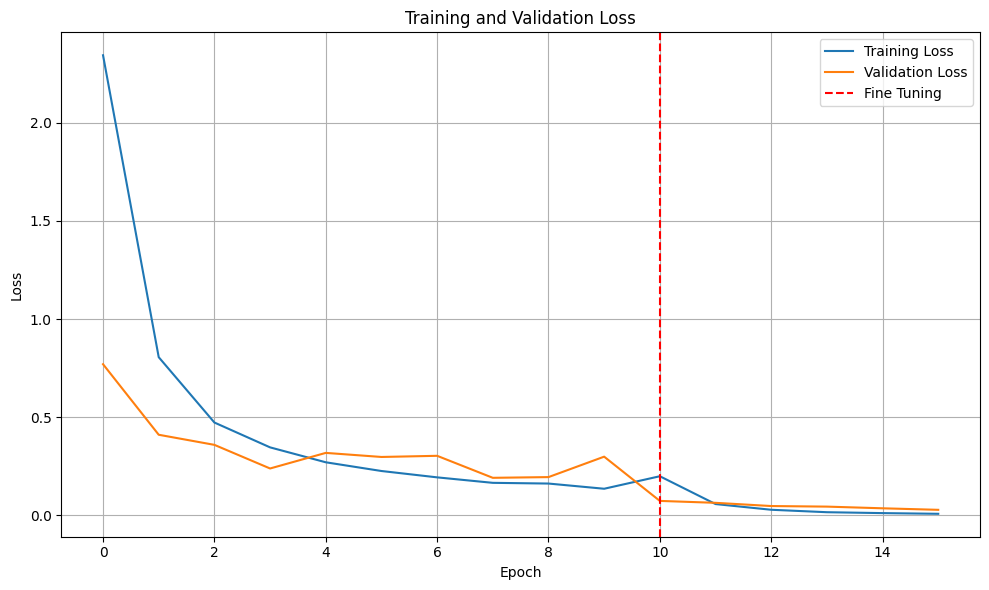

MODEL: inception_resnet_54
Epoch 1/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - accuracy: 0.2540 - loss: 3.5744 - val_accuracy: 0.7616 - val_loss: 0.7334
Epoch 2/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.7186 - loss: 0.8908 - val_accuracy: 0.8669 - val_loss: 0.4408
Epoch 3/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.8369 - loss: 0.5028 - val_accuracy: 0.8885 - val_loss: 0.3208
Epoch 4/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.8840 - loss: 0.3597 - val_accuracy: 0.9319 - val_loss: 0.2192
Epoch 5/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.9183 - loss: 0.2409 - val_accuracy: 0.9102 - val_loss: 0.2695
Epoch 6/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.9329 - loss: 0.2082 - val_accuracy: 0.9195 - val_loss: 0.2232
Epoch 7/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.9323 - loss: 0.1998 - val_accuracy: 0.8824 - val_loss: 0.3422
Epoch 8/10
323/323 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.93

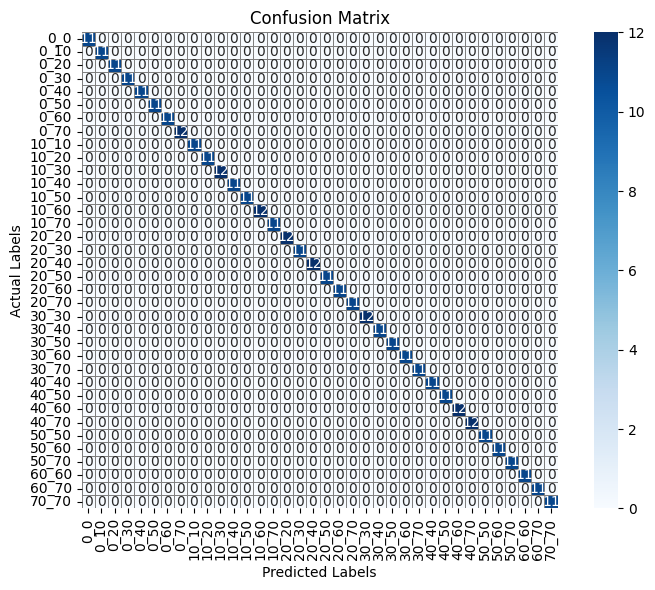

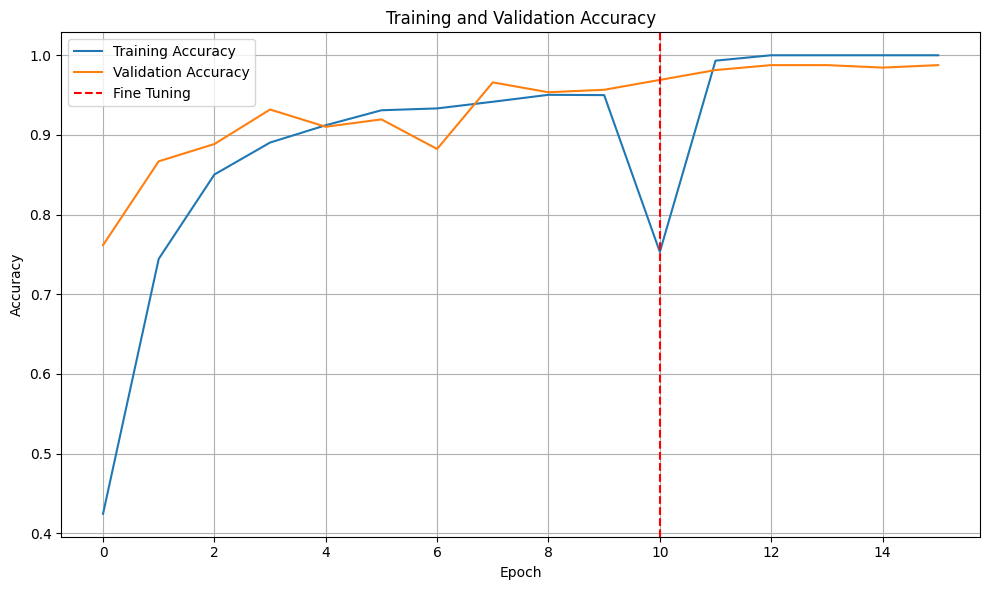

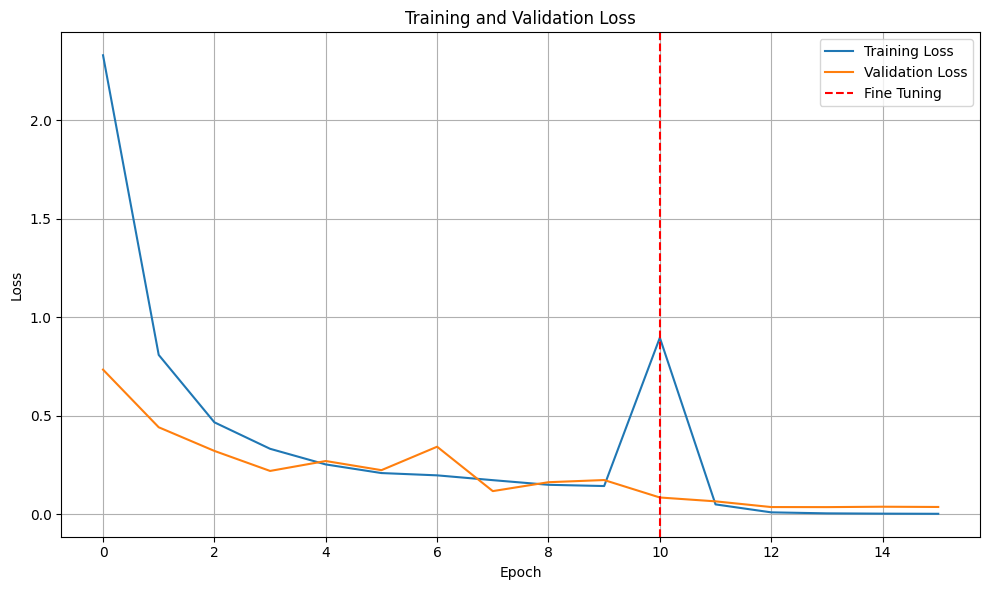

MODEL: inception_resnet_20_aug_tune
Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 24s 175ms/step - accuracy: 0.1304 - loss: 5.0084 - val_accuracy: 0.4613 - val_loss: 2.0719
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5573 - loss: 1.5975 - val_accuracy: 0.6347 - val_loss: 1.2120
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7415 - loss: 0.8404 - val_accuracy: 0.7059 - val_loss: 0.9022
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8079 - loss: 0.5553 - val_accuracy: 0.8204 - val_loss: 0.5075
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8896 - loss: 0.3437 - val_accuracy: 0.8235 - val_loss: 0.5474
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9269 - loss: 0.2476 - val_accuracy: 0.8111 - val_loss: 0.5841
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9394 - loss: 0.2120 - val_accuracy: 0.8793 - val_loss: 0.3957
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9552 - l

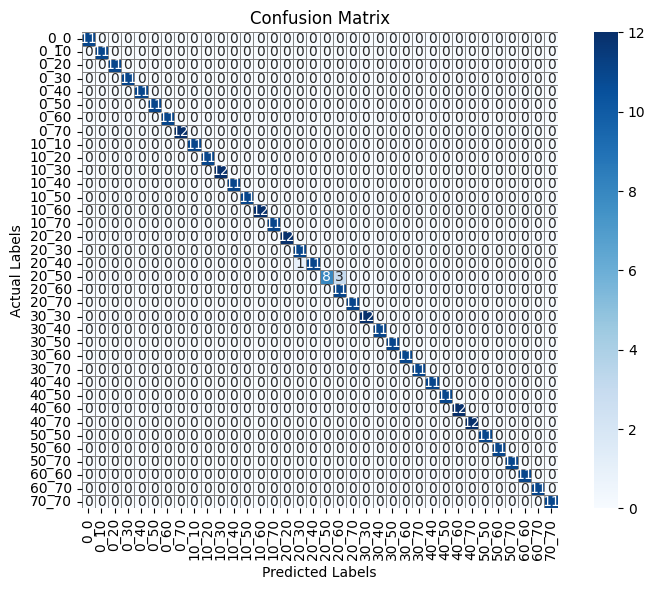

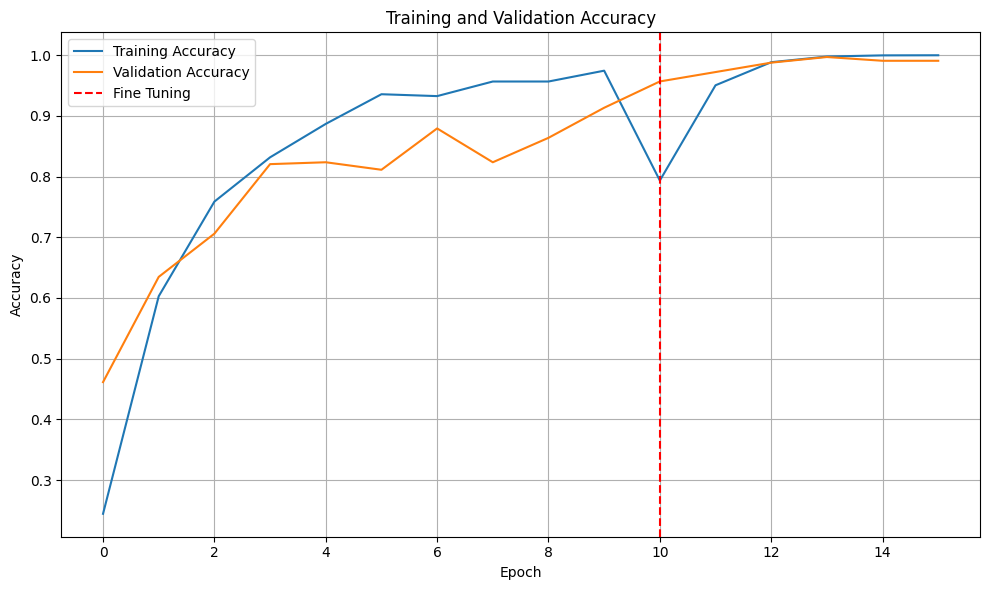

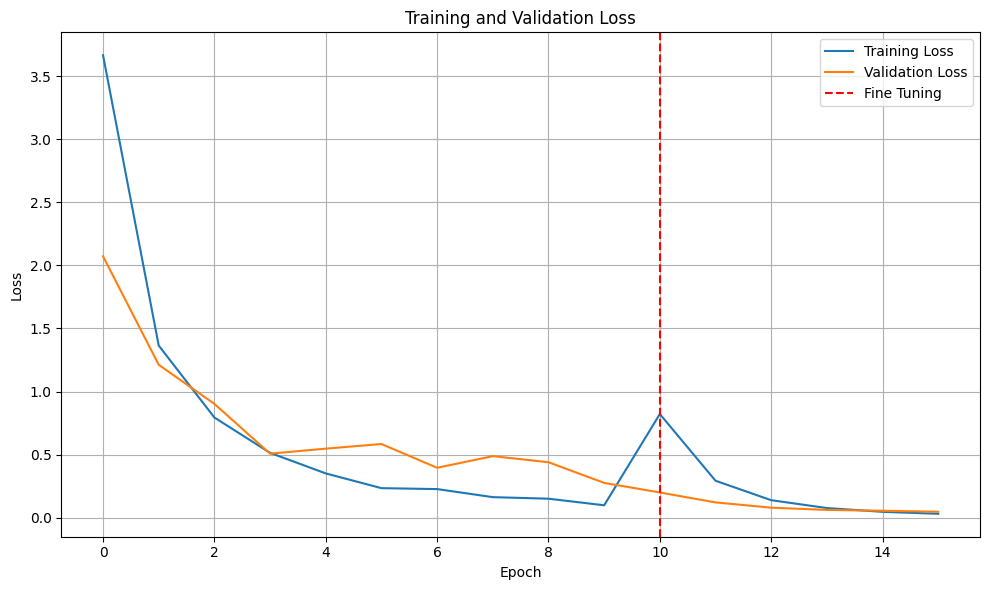

MODEL: inception_resnet_54_aug_tune
Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 24s 176ms/step - accuracy: 0.1170 - loss: 4.9225 - val_accuracy: 0.4303 - val_loss: 1.8265
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5849 - loss: 1.4601 - val_accuracy: 0.6563 - val_loss: 1.2557
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.7107 - loss: 0.9311 - val_accuracy: 0.7337 - val_loss: 0.8516
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8048 - loss: 0.5734 - val_accuracy: 0.8390 - val_loss: 0.5720
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9082 - loss: 0.3048 - val_accuracy: 0.8514 - val_loss: 0.4872
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9269 - loss: 0.2532 - val_accuracy: 0.8545 - val_loss: 0.4503
Epoch 7/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9314 - loss: 0.2226 - val_accuracy: 0.8824 - val_loss: 0.4009
Epoch 8/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9527 - l

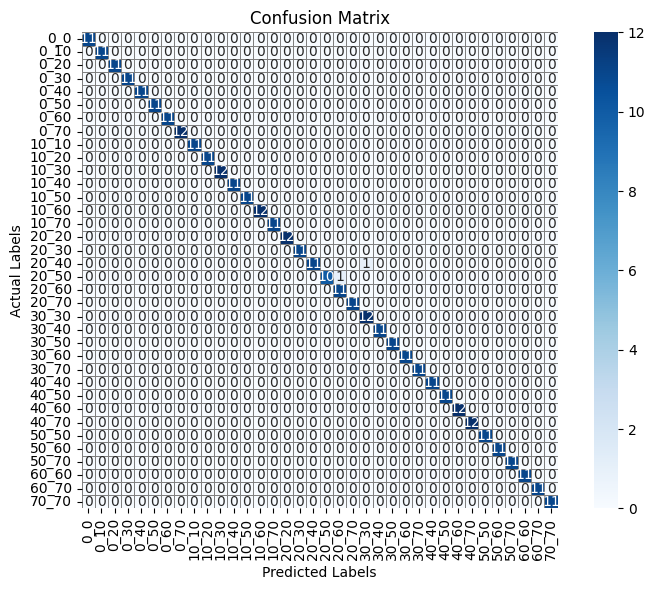

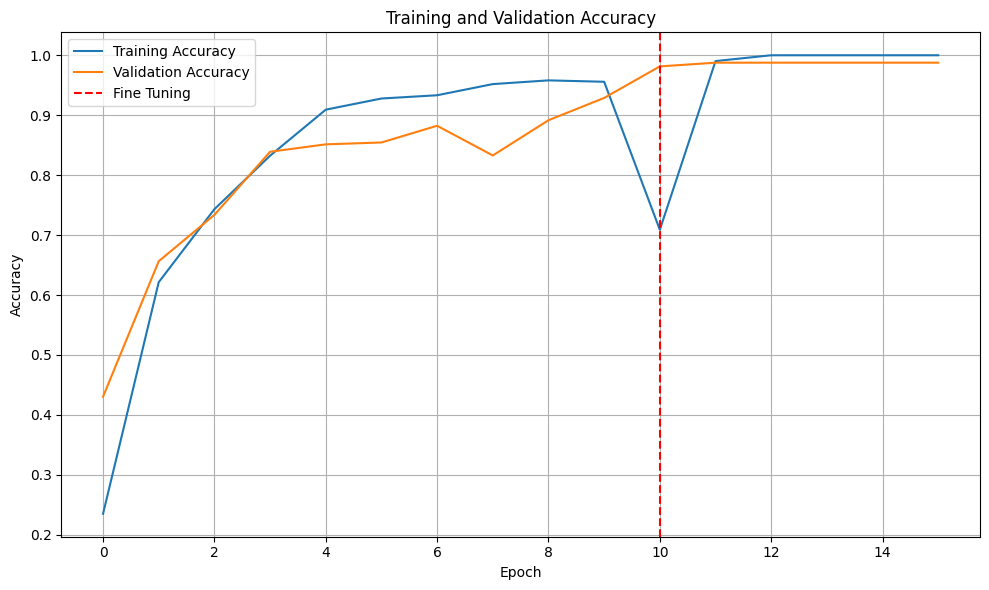

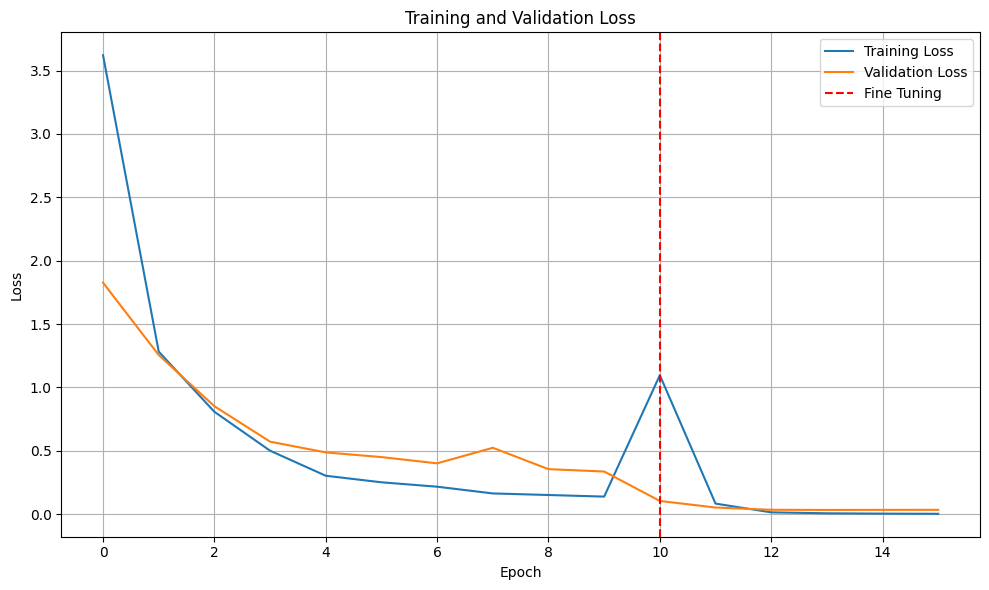

MODEL: inception_resnet_20_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 24s 182ms/step - accuracy: 0.1251 - loss: 4.9572 - val_accuracy: 0.3932 - val_loss: 2.0859
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5312 - loss: 1.6838 - val_accuracy: 0.6409 - val_loss: 1.0846
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.7623 - loss: 0.7928 - val_accuracy: 0.7245 - val_loss: 0.8267
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7891 - loss: 0.6136 - val_accuracy: 0.7833 - val_loss: 0.6396
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9012 - loss: 0.3241 - val_accuracy: 0.7926 - val_loss: 0.5853
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.6845 - loss: 1.2127 - val_accuracy: 0.9567 - val_loss: 0.2654
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.9322 - loss: 0.3708 - val_accuracy: 0.9690 - val_loss: 0.1548
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.9861 - loss:

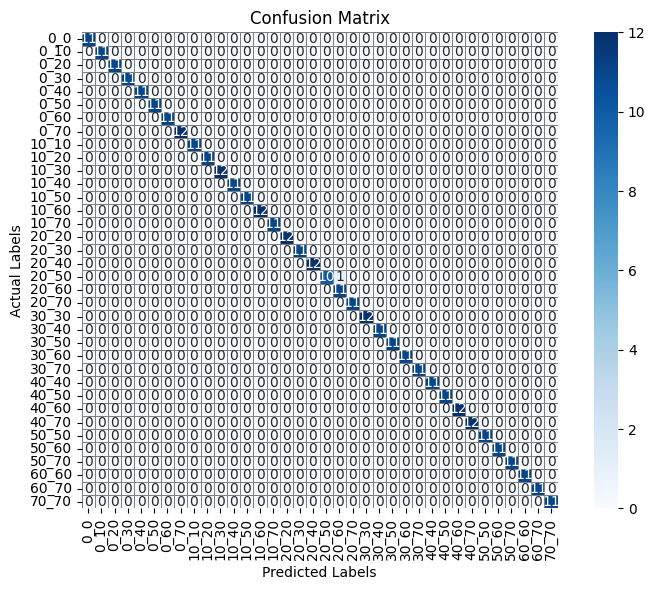

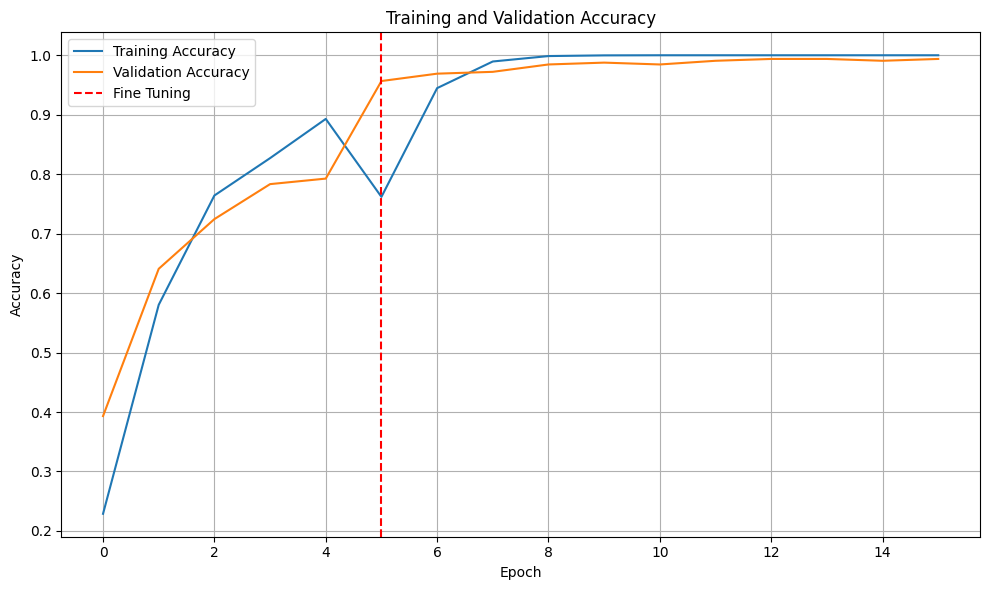

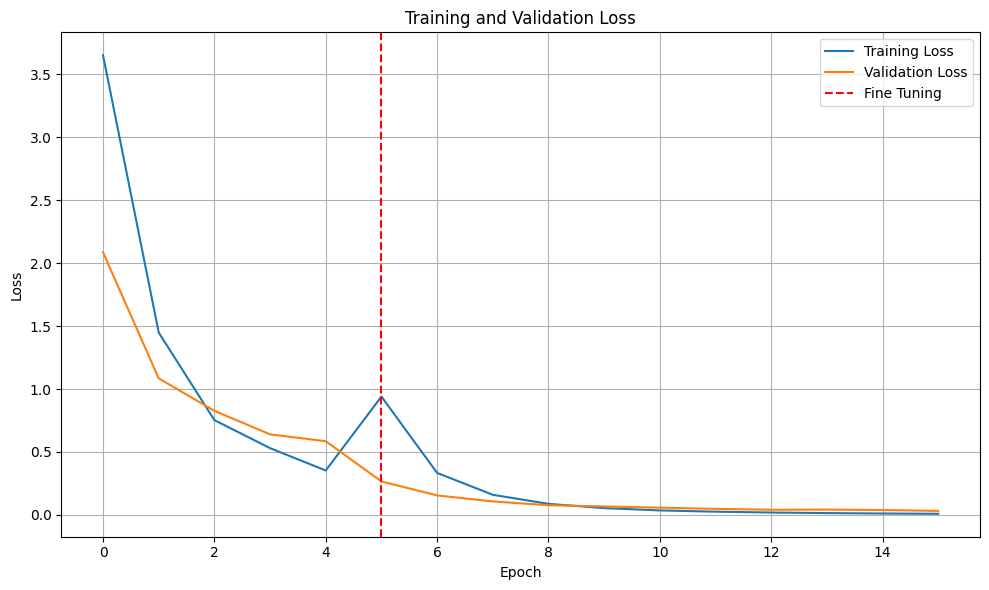

MODEL: inception_resnet_54_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 24s 178ms/step - accuracy: 0.1316 - loss: 5.0243 - val_accuracy: 0.4706 - val_loss: 1.8733
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5868 - loss: 1.5183 - val_accuracy: 0.6563 - val_loss: 1.1631
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7339 - loss: 0.9097 - val_accuracy: 0.6904 - val_loss: 0.8980
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8417 - loss: 0.5144 - val_accuracy: 0.7616 - val_loss: 0.6510
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8766 - loss: 0.3751 - val_accuracy: 0.7926 - val_loss: 0.5472
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.5282 - loss: 1.8430 - val_accuracy: 0.9845 - val_loss: 0.1059
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.9814 - loss: 0.1292 - val_accuracy: 0.9907 - val_loss: 0.0463
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.9999 - loss:

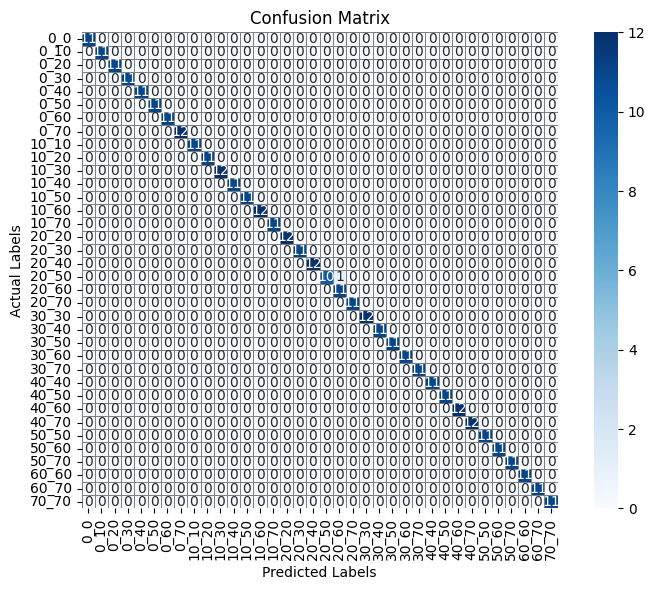

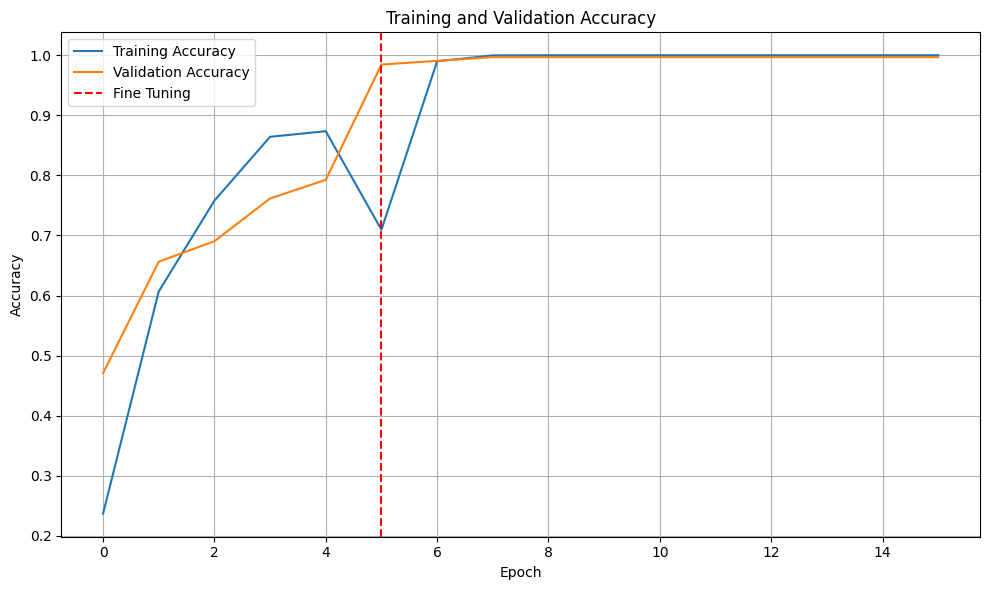

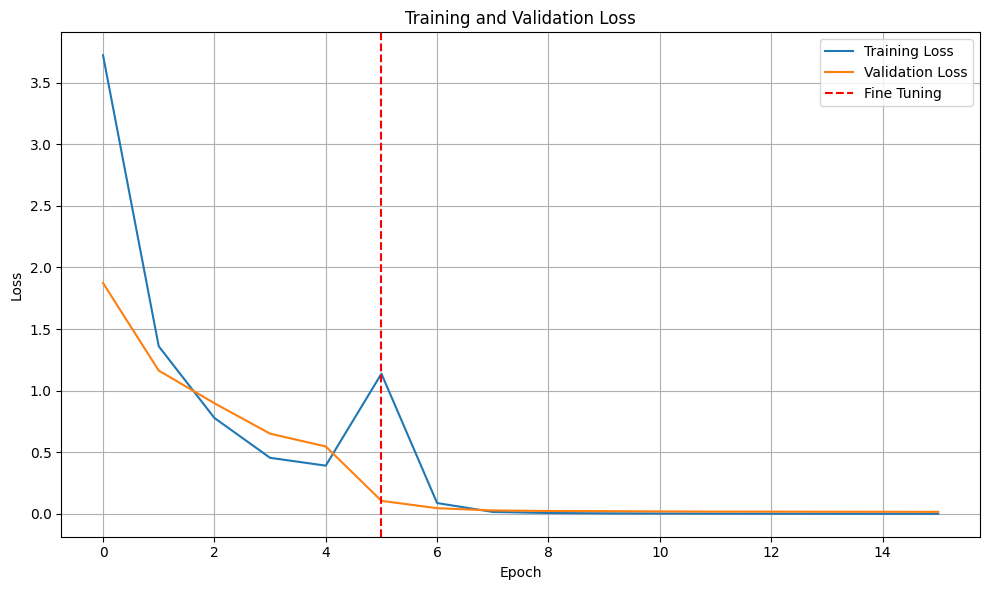

MODEL: inception_resnet_20_aug_tune_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 25s 176ms/step - accuracy: 0.1313 - loss: 4.9750 - val_accuracy: 0.4272 - val_loss: 1.9922
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5557 - loss: 1.5514 - val_accuracy: 0.6347 - val_loss: 1.1286
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.7208 - loss: 0.8822 - val_accuracy: 0.7276 - val_loss: 0.8562
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8285 - loss: 0.5524 - val_accuracy: 0.7740 - val_loss: 0.6850
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9044 - loss: 0.3201 - val_accuracy: 0.8390 - val_loss: 0.5653
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - accuracy: 0.7061 - loss: 1.1672 - val_accuracy: 0.9505 - val_loss: 0.2696
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.9401 - loss: 0.3742 - val_accuracy: 0.9659 - val_loss: 0.1537
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.981

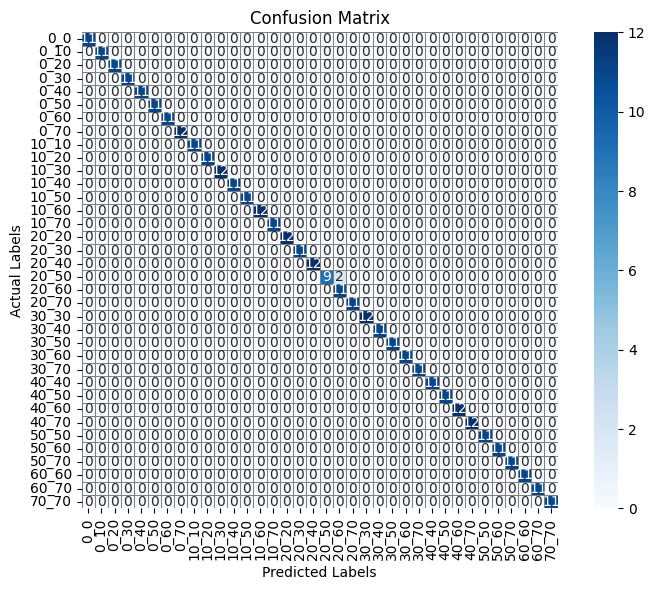

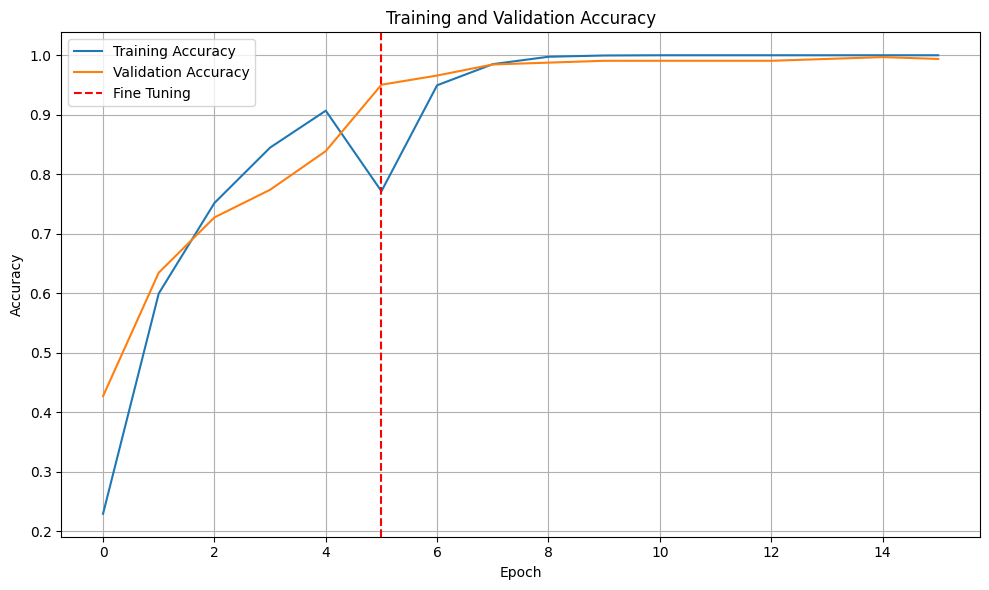

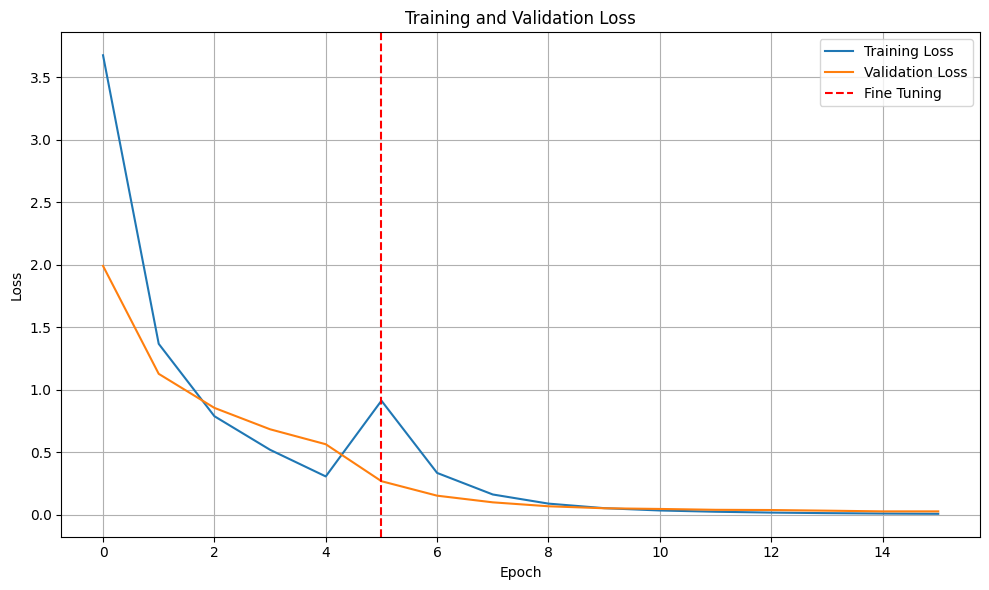

MODEL: inception_resnet_54_aug_tune_ep
Epoch 1/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 25s 180ms/step - accuracy: 0.1508 - loss: 4.8979 - val_accuracy: 0.4303 - val_loss: 1.9614
Epoch 2/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5751 - loss: 1.5706 - val_accuracy: 0.6099 - val_loss: 1.1950
Epoch 3/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.7269 - loss: 0.8840 - val_accuracy: 0.7616 - val_loss: 0.7538
Epoch 4/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8196 - loss: 0.5332 - val_accuracy: 0.7678 - val_loss: 0.7261
Epoch 5/5
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8820 - loss: 0.3743 - val_accuracy: 0.7988 - val_loss: 0.6032
Epoch 5/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.5289 - loss: 1.8400 - val_accuracy: 0.9845 - val_loss: 0.1049
Epoch 6/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.9818 - loss: 0.1337 - val_accuracy: 0.9876 - val_loss: 0.0483
Epoch 7/15
323/323 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - accuracy: 1.000

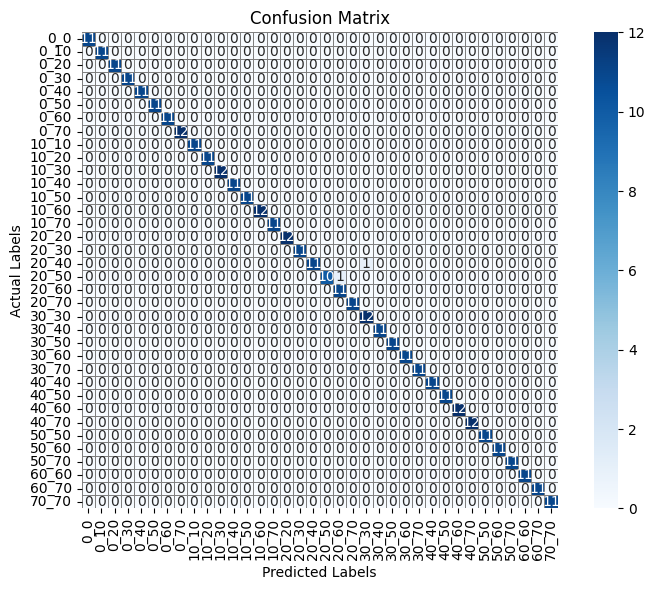

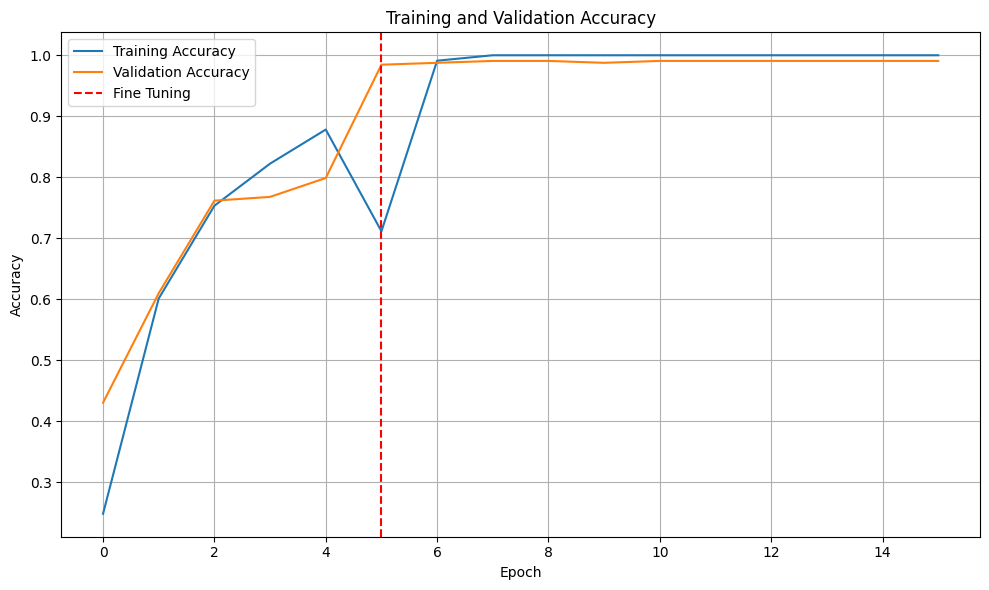

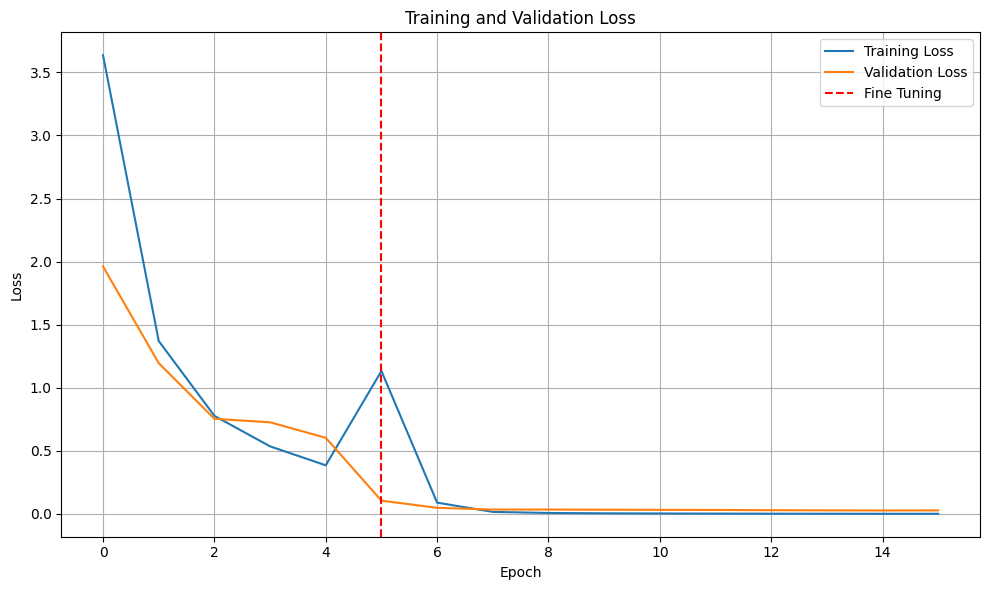

In [158]:
tune = train

for model_type in INCEPTION_RESNET_CONFIGS:
  num_layers, layer, d_rate, optimizer, epochs, tune_epochs = get_inception_resnet_model_configs(model_type)
  print(f"MODEL: {model_type}")
  model_history = {model_type: []}

  # use aug data only for fine tuning
  if "aug_tune" in model_type:
    train = train_dataset.map(lambda x, y: (preprocess_input_inception(tf.cast(x, tf.float32)), y))
    train = train.batch(BATCH_SIZE)

  inception = tf.keras.applications.InceptionV3(
      weights="imagenet",
      include_top=False,
      input_shape=(128, 128, 3)
  )

  inception.trainable = False

  model = models.Sequential([
      Input(shape=(256, 256, 3)),
      Resizing(128, 128),
      inception,
      layer,
      layers.Dropout(d_rate),
      layers.Dense(36, activation='softmax')
  ])

  model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

  history = model.fit(train, validation_data=val, epochs=epochs, batch_size=BATCH_SIZE)
  model_history[model_type].append(history.history)

  for layer in inception.layers[-num_layers:]:
        layer.trainable = True

  model.compile(
      optimizer,
      loss='categorical_crossentropy', metrics=['accuracy'])

  history = model.fit(tune, validation_data=val, epochs=epochs + tune_epochs, initial_epoch=history.epoch[-1], batch_size=BATCH_SIZE)

  model_history[model_type].append(history.history)

  acc, precision, recall, f1 = evaluate_model(model, labels, X_test, y_test, path=f"{INCEPTION_FOLDER}{model_type}-cm-ep{epochs + tune_epochs}")
  inception_resnet_data = store_results(inception_resnet_data, model_type, {"epochs": epochs + tune_epochs, "acc": acc, "precision": precision, "recall": recall, "f1": f1})
  plot_training_and_tuning_metrics(model_history, INCEPTION_FOLDER, epochs, models=[model_type], save=True)

In [159]:
df = pd.DataFrame(inception_resnet_data)
df.to_csv(f"{INCEPTION_RESNET_FOLDER}inception_resnet_results.csv", index=False)
df

,epochs,acc,precision,recall,f1,time,model
0,15,0.995050,0.995462,0.995050,0.995044,2024-12-22 10:27:25,inception_resnet_20
1,15,1.000000,1.000000,1.000000,1.000000,2024-12-22 10:30:29,inception_resnet_54
2,15,0.990099,0.991897,0.990099,0.989958,2024-12-22 10:32:36,inception_resnet_20_aug_tune
3,15,0.995050,0.995446,0.995050,0.995040,2024-12-22 10:35:01,inception_resnet_54_aug_tune
4,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:37:44,inception_resnet_20_ep
5,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:40:39,inception_resnet_54_ep
6,15,0.995050,0.995811,0.995050,0.995008,2024-12-22 10:43:10,inception_resnet_20_aug_tune_ep
7,15,0.995050,0.995446,0.995050,0.995040,2024-12-22 10:46:12,inception_resnet_54_aug_tune_ep


In [184]:
last = 0
for layer in model.layers[-3:]:
  last = layer.count_params()

params_data = []

for model_type in INCEPTION_RESNET_CONFIGS:
  params = last
  num_layers, _, _, _, _, _ =  get_inception_resnet_model_configs(model_type)
  for layer in  resnet.layers[-num_layers:]:
      params += layer.count_params()
  params_data.append({"model": model_type, "params": params})

params_df = pd.DataFrame(params_data)
df = pd.merge(pd.read_csv(f"{INCEPTION_RESNET_FOLDER}inception_resnet_results.csv"), params_df[["model", "params"]], on='model', how='left')
df.to_csv(f"{INCEPTION_RESNET_FOLDER}inception_resnet_results.csv", index=False)
df

,epochs,acc,precision,recall,f1,time,model,params
0,15,0.995050,0.995462,0.995050,0.995044,2024-12-22 10:27:25,inception_resnet_20,9017380
1,15,1.000000,1.000000,1.000000,1.000000,2024-12-22 10:30:29,inception_resnet_54,17315876
2,15,0.990099,0.991897,0.990099,0.989958,2024-12-22 10:32:36,inception_resnet_20_aug_tune,9017380
3,15,0.995050,0.995446,0.995050,0.995040,2024-12-22 10:35:01,inception_resnet_54_aug_tune,17315876
4,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:37:44,inception_resnet_20_ep,9017380
5,15,0.997525,0.997731,0.997525,0.997520,2024-12-22 10:40:39,inception_resnet_54_ep,17315876
6,15,0.995050,0.995811,0.995050,0.995008,2024-12-22 10:43:10,inception_resnet_20_aug_tune_ep,9017380
7,15,0.995050,0.995446,0.995050,0.995040,2024-12-22 10:46:12,inception_resnet_54_aug_tune_ep,17315876


## CLASSIFICATION RESULTS
-----

In [17]:
resnet_df = pd.read_csv(f"{RESNET_FOLDER}resnet_results.csv")
inception_df = pd.read_csv(f"{INCEPTION_FOLDER}inception_results.csv")
inception_resnet_df = pd.read_csv(f"{INCEPTION_RESNET_FOLDER}inception_resnet_results.csv")
print(resnet_df.head())
print(inception_df.head())
print(inception_resnet_df.head())

# Regression Task: DEPTH ESTIMATION
---

In [19]:
def comparison_plot_tuning(metric, train, val, epoch, save=False, file="plot"):
  plt.figure(figsize=(10, 6))
  plt.plot(train, label=f'Training {metric}')
  plt.plot(val, label=f'Validation {metric}')
  plt.axvline(x=epoch, color='red', linestyle='--', label='Fine Tuning')
  plt.title(f'Training and Validation {metric}')
  plt.xlabel('Epoch')
  plt.ylabel(f'{metric}')
  plt.legend()
  plt.grid(True)
  if save:
    plt.savefig(file)
  plt.tight_layout()
  plt.show()

def plot_training_and_tuning_metrics_regression(model_history, folder, epoch, models=[], save=False):
  for model in models:
    train, tune = model_history[model]

    t_acc = train['root_mean_squared_error'] + tune["root_mean_squared_error"]
    v_acc = train['val_root_mean_squared_error'] + tune["val_root_mean_squared_error"]
    comparison_plot_tuning("RMSE", t_acc, v_acc, epoch, save=save, file=f"{folder}{model}-rmse")

    t_acc = train['loss'] + tune["loss"]
    v_acc = train['val_loss'] + tune["val_loss"]
    comparison_plot_tuning("MSE", t_acc, v_acc, epoch, save=save, file=f"{folder}{model}-mse")

def evaluate_regression_model(model, X_test, y_test):
  loss, rmse = model.evaluate(X_test, y_test)
  print(f"Test Loss: {loss}")
  print(f"Test RMSE: {rmse:.4f}")
  return loss, rmse

def store_results(data, model, results):
  timestamp = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
  results["time"] = timestamp
  results["model"] = model
  data.append(results)
  return data

In [42]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 3))
df["depth"] = scaler.fit_transform(df[["depth"]])
train_dataset, val_dataset, test_dataset = create_depth_datasets(df, normalize=False, strat=False)

In [43]:
train = train_dataset.map(lambda x, y: (preprocess_input_resnet(x), y))
val = val_dataset.map(lambda x, y: (preprocess_input_resnet(x), y))
test = test_dataset.map(lambda x, y: (preprocess_input_resnet(x), y))

In [44]:
for img, depth in train_dataset.take(1):
    print(img.shape, depth)

(256, 256, 3) tf.Tensor(1.6467171120093047, shape=(), dtype=float64)


In [45]:
BATCH_SIZE = 16
train = train.batch(BATCH_SIZE)
val = val.batch(BATCH_SIZE)
test = test.batch(BATCH_SIZE)

X_test = []
y_test = []
for imgs, targets in test.as_numpy_iterator():
    X_test.append(imgs)
    y_test.append(targets)

X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

In [46]:
depth_data = []
DEPTH_FOLDER = f"{FOLDER}/results/depth/"
os.makedirs(DEPTH_FOLDER, exist_ok=True)

Epoch 1/15
81/81 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 24.4623 - root_mean_squared_error: 2.2136 - val_loss: 12.4103 - val_root_mean_squared_error: 1.8146 - learning_rate: 0.0010
Epoch 2/15
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 10.5064 - root_mean_squared_error: 1.6614 - val_loss: 6.1499 - val_root_mean_squared_error: 1.2084 - learning_rate: 0.0010
Epoch 3/15
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 5.8057 - root_mean_squared_error: 1.3105 - val_loss: 3.8068 - val_root_mean_squared_error: 1.0448 - learning_rate: 0.0010
Epoch 4/15
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 3.4142 - root_mean_squared_error: 1.0114 - val_loss: 2.2164 - val_root_mean_squared_error: 0.7517 - learning_rate: 0.0010
Epoch 5/15
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 2.2493 - root_mean_squared_error: 0.8702 - val_loss: 1.5220 - val_root_mean_squared_error: 0.6590 - learning_rate: 0.0010
Epoch 6/15
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 1.6564 - root_mean_squared_erro

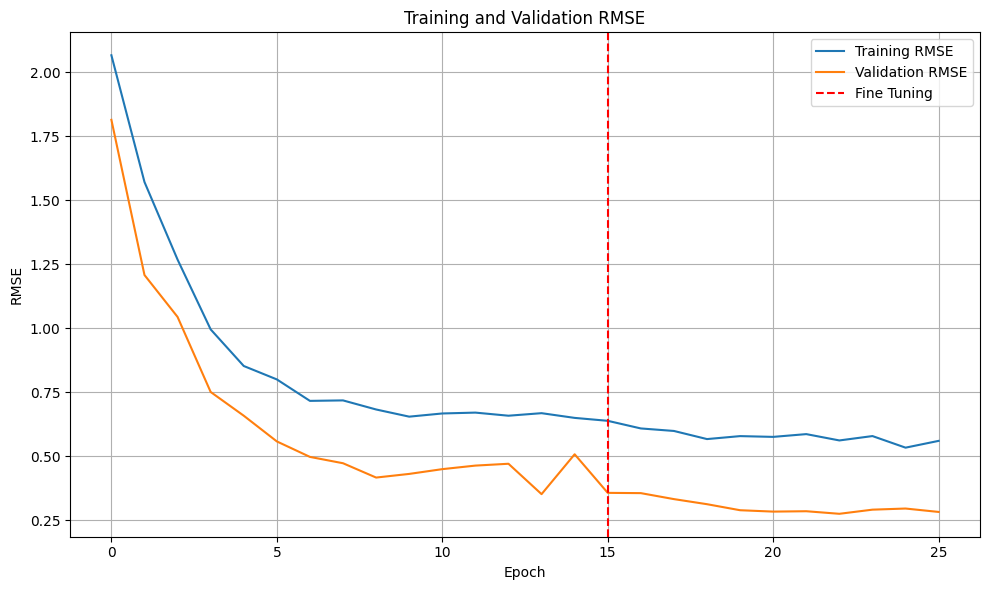

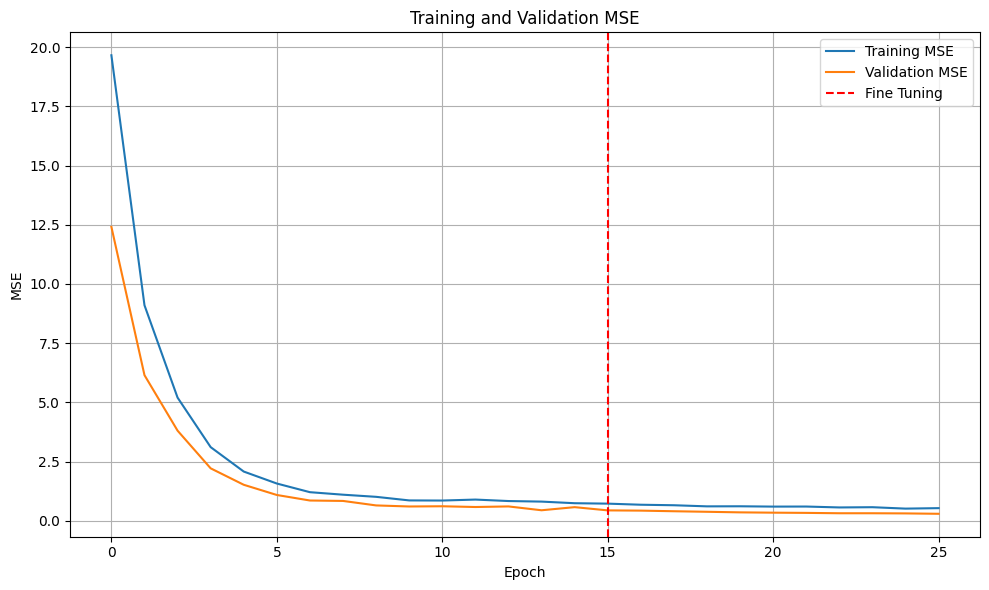

[{'epochs': 25, 'loss': 0.2980308532714844, 'rmse': 0.2851284444332123, 'time': '2024-12-22 17:39:23', 'model': 'resnet_fc_bn_3'}]


In [47]:
from tensorflow.keras import layers, regularizers
from tensorflow.keras import layers, regularizers, callbacks
model_type = 'resnet_fc_bn_3'
model_history = {model_type: []}

resnet = ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(128, 128, 3)
)

resnet.trainable = False

model = models.Sequential([
    Input(shape=(256, 256, 3)),
    Resizing(128, 128),
    resnet,
    layers.GlobalAveragePooling2D(),
    layers.Dense(2048, kernel_regularizer=regularizers.l2(0.01)),  # L2 regularization
    layers.BatchNormalization(),
    layers.ReLU(),
    layers.Dropout(0.5),  # Increased dropout rate
    layers.Dense(256, kernel_regularizer=regularizers.l2(0.01)),  # L2 regularization
    layers.BatchNormalization(),
    layers.ReLU(),
    layers.Dense(4, kernel_regularizer=regularizers.l2(0.01)),
    layers.BatchNormalization(),
    layers.ReLU(),
    layers.Dropout(0.2),
    layers.Dense(1)
])

model.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])

epochs = 15
history = model.fit(train, validation_data=val, epochs=epochs, batch_size=BATCH_SIZE,
                    callbacks=[callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
                               callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)])
model_history[model_type].append(history.history)

for layer in resnet.layers:
    if layer.name.startswith("conv5") or layer.name.startswith("conv4_block4"):
      layer.trainable = True

model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])

tune_epochs = 10
history = model.fit(train, validation_data=val, epochs=epochs + tune_epochs, initial_epoch=history.epoch[-1], batch_size=BATCH_SIZE)
model_history[model_type].append(history.history)


loss, rmse = evaluate_regression_model(model, X_test, y_test)
depth_data = store_results(depth_data, model_type, {"epochs": epochs + tune_epochs, "loss": loss, "rmse": rmse})
plot_training_and_tuning_metrics_regression(model_history, DEPTH_FOLDER, epochs, models=[model_type], save=False)
print(depth_data)

In [37]:
def compute_rmse(actual, predicted):
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.sqrt(np.mean((actual - predicted) ** 2))

avg =  df['init_depth'].mean()
stdev = df['init_depth'].std()

In [38]:
df['init_depth']

,init_depth
0,0.611818
1,0.693017
2,0.457814
3,0.105780
4,0.296676
...,...
2011,0.003353
2012,0.958107
2013,0.016327
2014,0.000000


In [39]:
p =  model.predict(X_test)
y_pred = (p * stdev) + avg
compute_rmse(y_test, y_pred)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


1.2082050782996063

Epoch 10/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 33s 179ms/step - loss: 0.5578 - root_mean_squared_error: 0.7445 - val_loss: 0.1492 - val_root_mean_squared_error: 0.3862
Epoch 11/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.3626 - root_mean_squared_error: 0.5998 - val_loss: 0.3281 - val_root_mean_squared_error: 0.5728
Epoch 12/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.2086 - root_mean_squared_error: 0.4563 - val_loss: 0.2777 - val_root_mean_squared_error: 0.5270
Epoch 13/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1862 - root_mean_squared_error: 0.4312 - val_loss: 0.0687 - val_root_mean_squared_error: 0.2622
Epoch 14/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1425 - root_mean_squared_error: 0.3763 - val_loss: 0.0403 - val_root_mean_squared_error: 0.2008
Epoch 15/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.1158 - root_mean_squared_error: 0.3402 - val_loss: 0.0443 - val_root_mean_squared_error: 0.2104
Epoch 16/20
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/ste

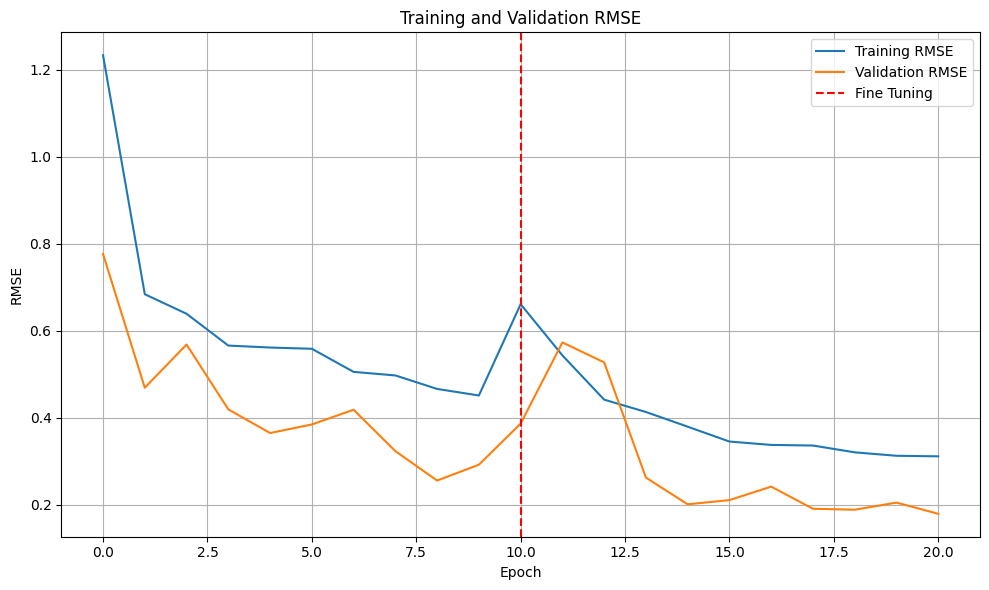

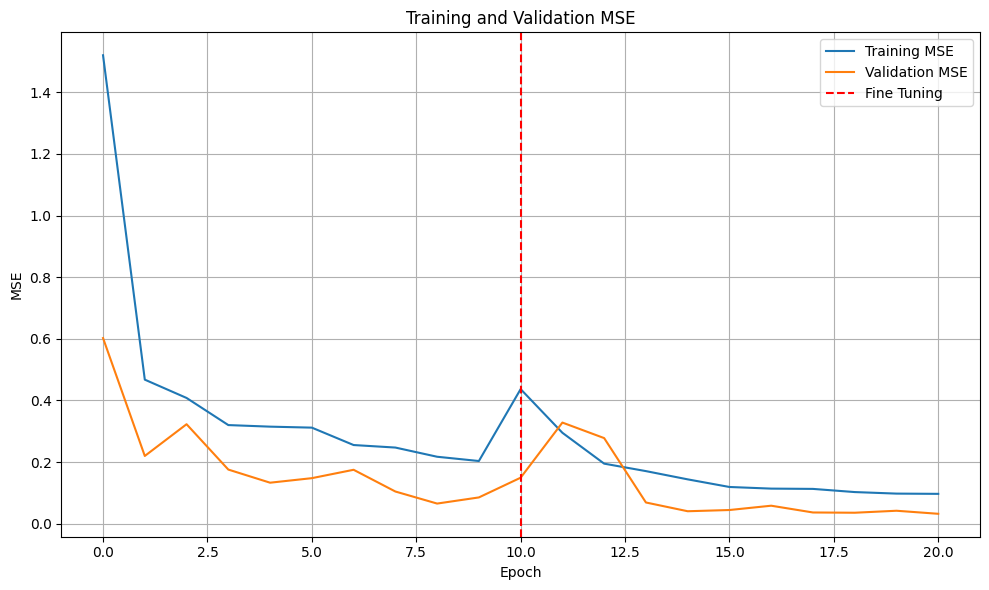

[{'epochs': 25, 'loss': 0.2980308532714844, 'rmse': 0.2851284444332123, 'time': '2024-12-22 17:39:23', 'model': 'resnet_fc_bn_3'}, {'epochs': 20, 'loss': 0.038708560168743134, 'rmse': 0.196744903922081, 'time': '2024-12-22 17:43:12', 'model': 'resnet_last_alot_mse_128_dp2_aug'}]


In [49]:
# model_type = 'resnet_last_alot_mse_128_dp2_aug'
# model_history = {model_type: []}

# resnet = ResNet50(
#     weights="imagenet",
#     include_top=False,
#     input_shape=(128, 128, 3)
# )

# resnet.trainable = False

# model = models.Sequential([
#     Input(shape=(256, 256, 3)),
#     Resizing(128, 128),
#     resnet,
#     layers.GlobalAveragePooling2D(),
#     layers.Dense(128),
#     layers.BatchNormalization(),
#     layers.ReLU(),
#     layers.Dropout(0.2),
#     layers.Dense(1)
# ])

# model.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])


# epochs = 10
# history = model.fit(train, validation_data=val, epochs=epochs, batch_size=BATCH_SIZE)
# model_history[model_type].append(history.history)

# for layer in resnet.layers:
#     if layer.name.startswith("conv5") or layer.name.startswith("conv4_block4"):
#       layer.trainable = True

# model.compile(optimizer=tf.keras.optimizers.Adam(1e-4), loss=tf.keras.losses.MeanSquaredError(), metrics=[tf.keras.metrics.RootMeanSquaredError()])


tune_epochs = 10
history = model.fit(train, validation_data=val, epochs=epochs + tune_epochs, initial_epoch=history.epoch[-1], batch_size=BATCH_SIZE)
model_history[model_type].append(history.history)


loss, rmse = evaluate_regression_model(model, X_test, y_test)
depth_data = store_results(depth_data, model_type, {"epochs": epochs + tune_epochs, "loss": loss, "rmse": rmse})
plot_training_and_tuning_metrics_regression(model_history, DEPTH_FOLDER, epochs, models=[model_type], save=False)
print(depth_data)

# Future Exploration: Data Augumentation => Instead of poses should we estimate the cos between pitch and roll?
---
The microrobot structure symetric => we can generate more poses by flipping images (the angle is the same):
*   pitch = a & flip across x-axis  => pitch = a
*   roll = a & flip across y-axis  => roll = a